# Step 1. Mount the drive



In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


# Step 2. Input the image Path: Modify the dataset_dir and folder

In [ ]:
import os
import sys
import cv2

import os
import sys

# directory of the project, folder which you put utils.py in
project_dir = os.path.abspath("/content/gdrive/Shared drives/Graphene_DL_2")


## For your own dataset
### Modify your folder path here:
# path to the dataset, should contain 3 subfolders: train2019, val2019 and annotations
dataset_dir = os.path.abspath("/content/gdrive/MyDrive/3")
dataset_dir1 = os.path.abspath("/content/gdrive/Shared drives/Graphene_DL_2")
# model paths to save or load the models

##(work) 2 features UNet with wb + SVM w/o wb (UNet threshold 0.75) ---- modelT
model_path = "/content/gdrive/Shareddrives/Graphene_DL_2/Unet_h5_files/good_Preprocesseddata_ep400_pw120_lt00004.h5" # UNet with wb
SVM_model_path = "/content/gdrive/Shareddrives/Graphene_DL_2/Unet_h5_files/SVM_gaussian_Good_model8_pre_mean.sav" # 2 features SVM w/o wb
Sc_transform_path = "/content/gdrive/Shareddrives/Graphene_DL_2/Unet_h5_files/SC_bi_feature_pre.bin" # 2 features SVM w/o wb

sys.path.append(project_dir) 
import utils

def load_images_from_folder(folder):
    images = []
    for filename in os.listdir(folder):
        img = cv2.imread(os.path.join(folder,filename))
        if img is not None:
            images.append(img)
    return images

## For your own dataset
### Modify your folder path here:
folder= "/content/gdrive/MyDrive/3"


In [ ]:
from tensorflow.keras.utils import get_custom_objects
from tensorflow.keras.models import load_model
import numpy as np
import matplotlib.pyplot as plt
import tensorflow.keras as keras
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Input, Conv2DTranspose, Concatenate
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras import backend as K
import tensorflow as tf
import cv2
from imgaug import augmenters as iaa

loading annotations into memory...
Done (t=0.45s)
creating index...
index created!


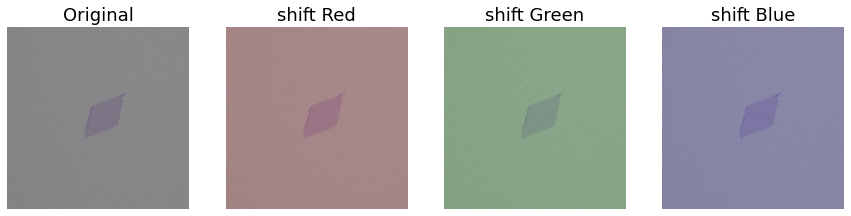

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


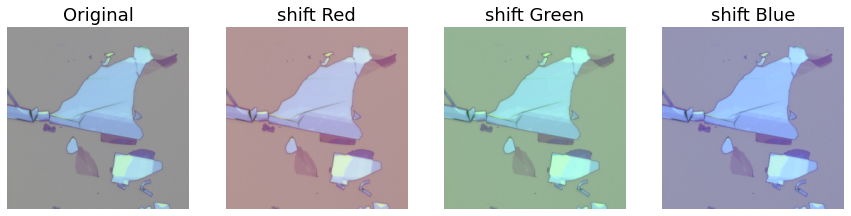

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


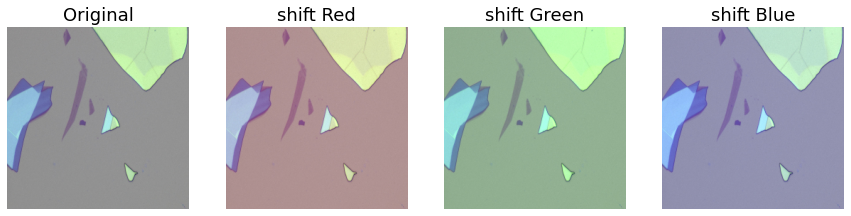

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


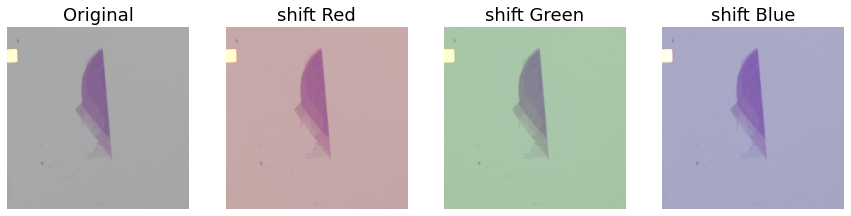

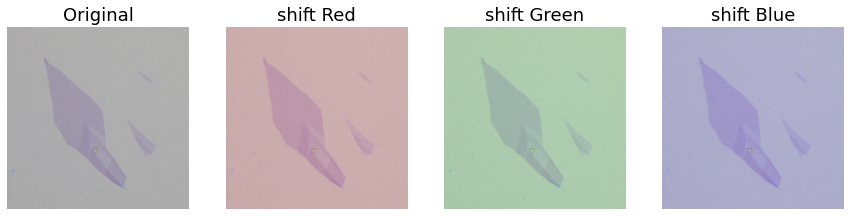

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


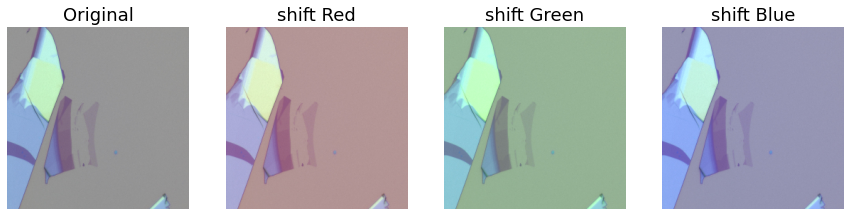

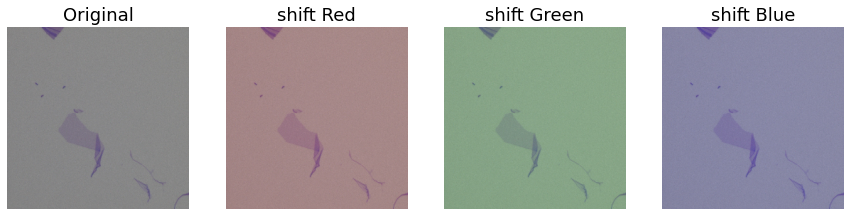

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


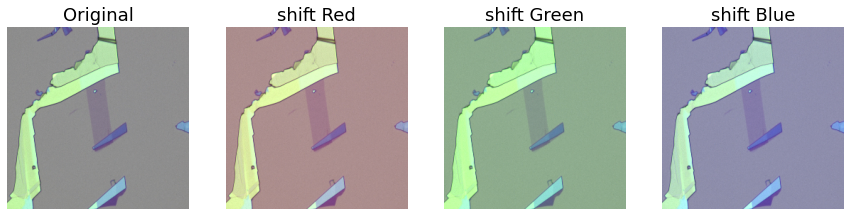

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


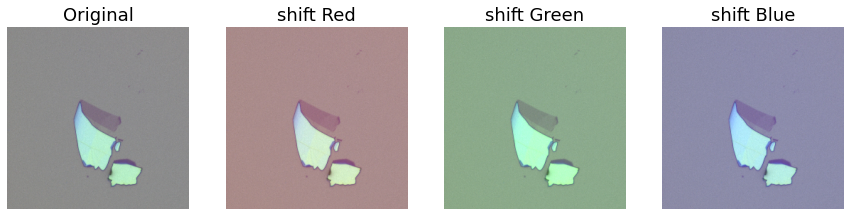

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


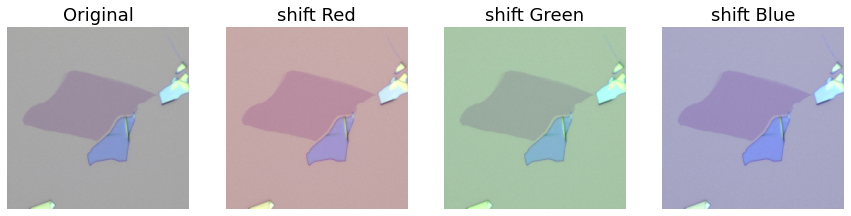

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


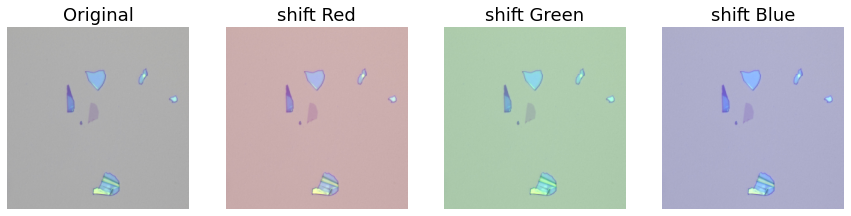

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


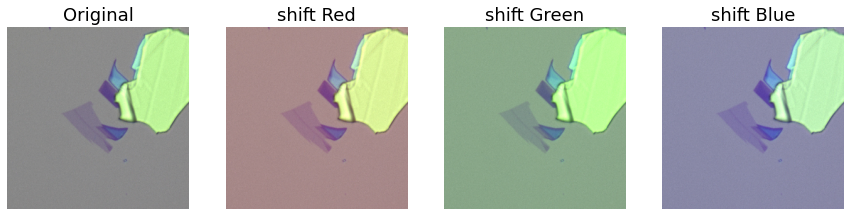

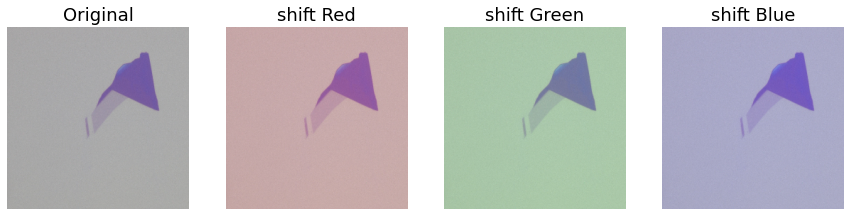

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


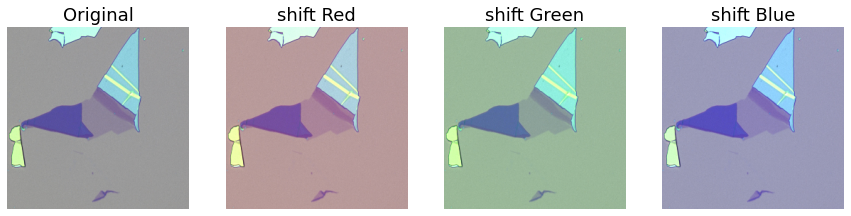

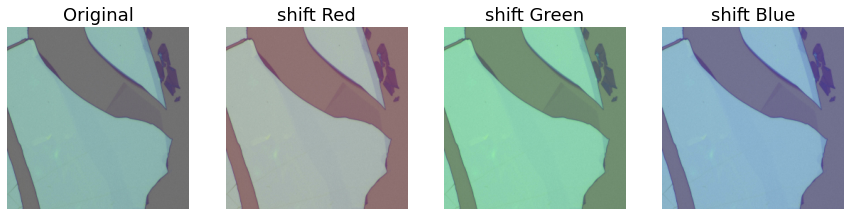

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


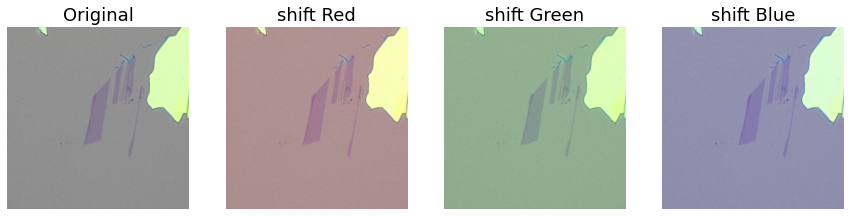

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


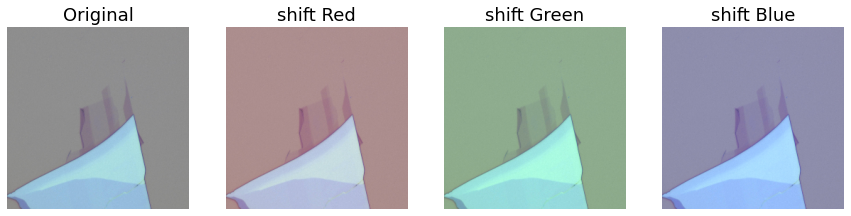

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


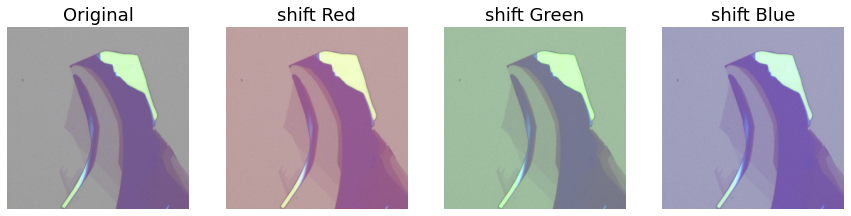

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


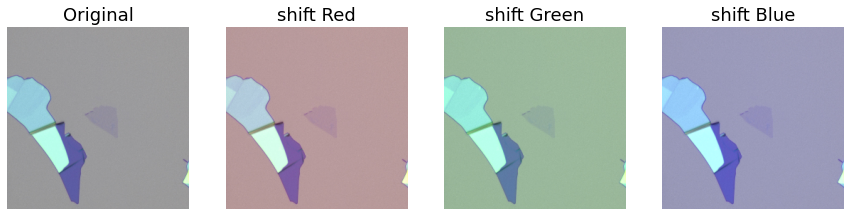

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


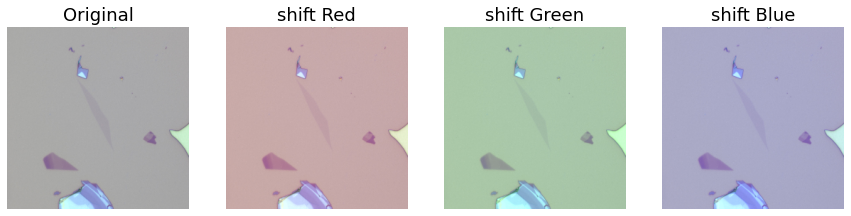

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


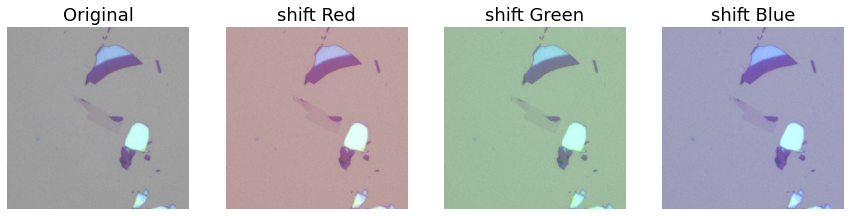

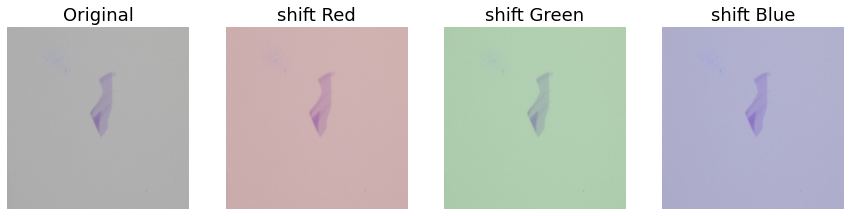

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


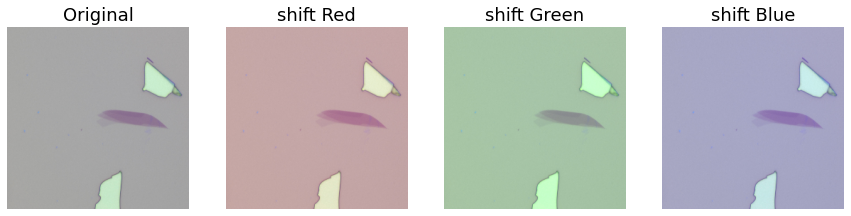

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


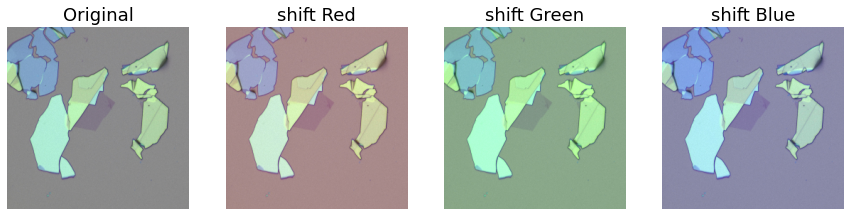

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


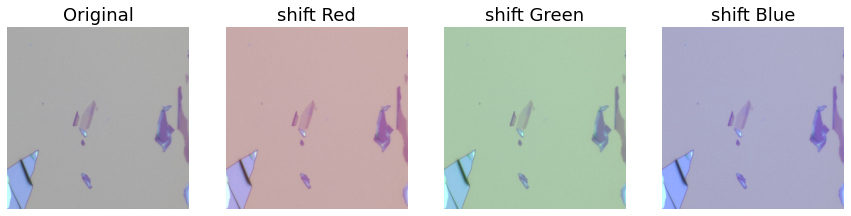

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


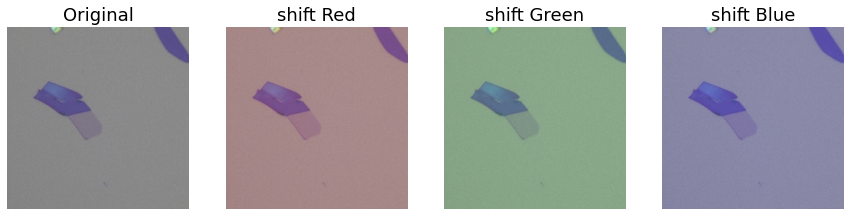

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


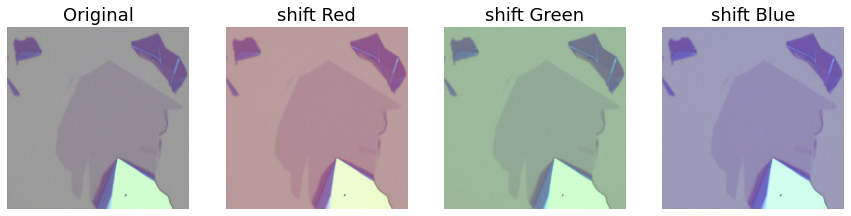

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


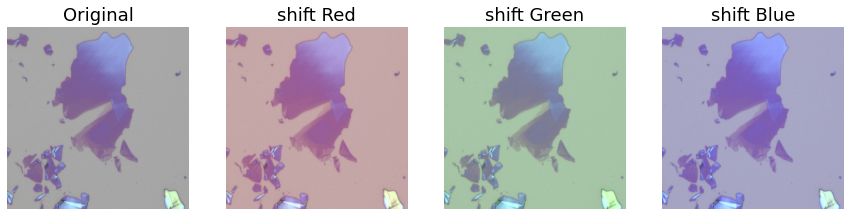

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


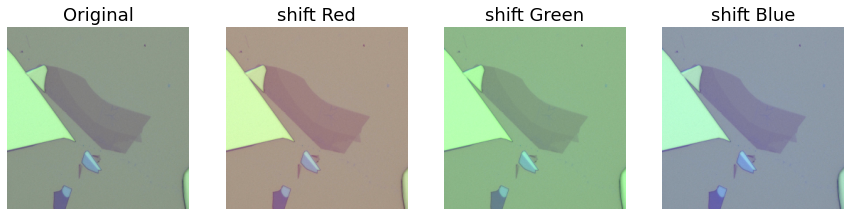

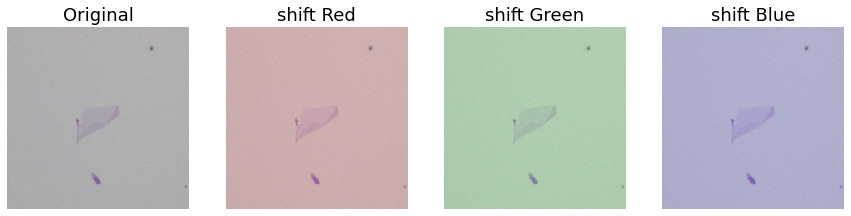

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


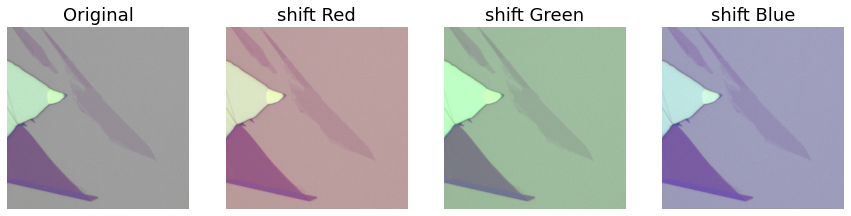

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


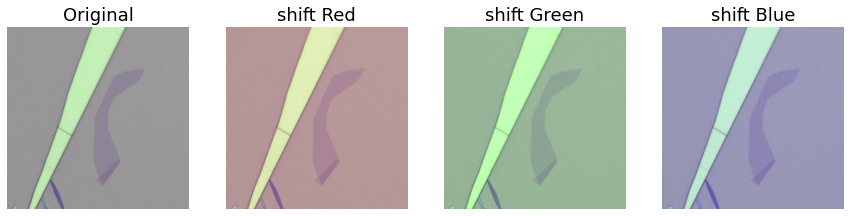

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


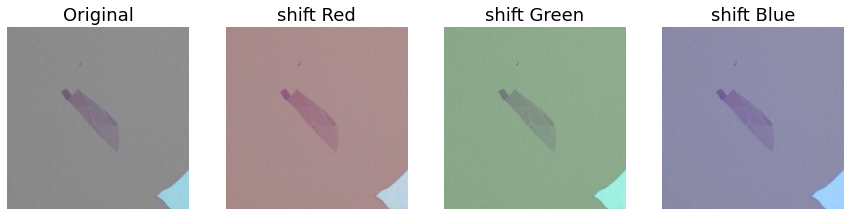

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


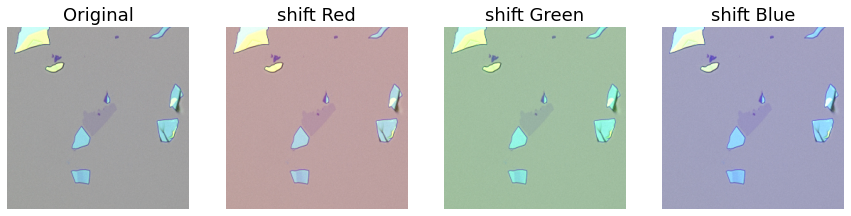

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


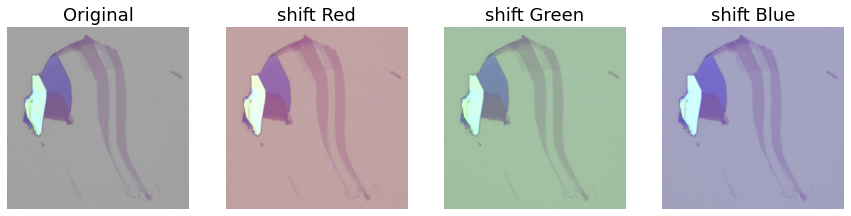

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


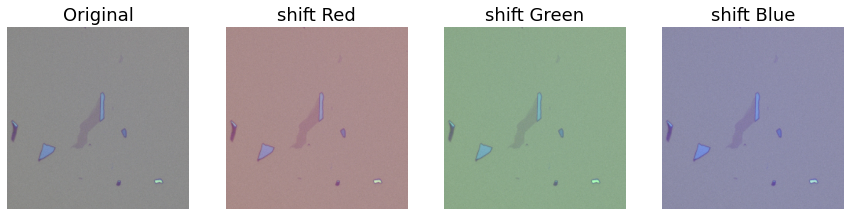

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


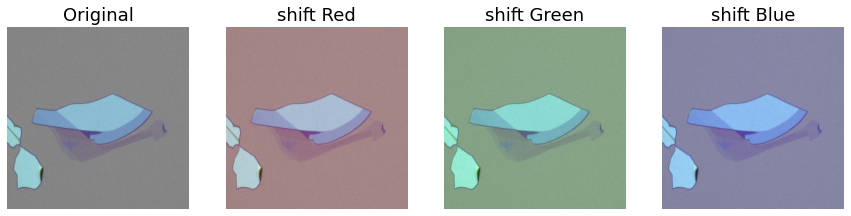

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


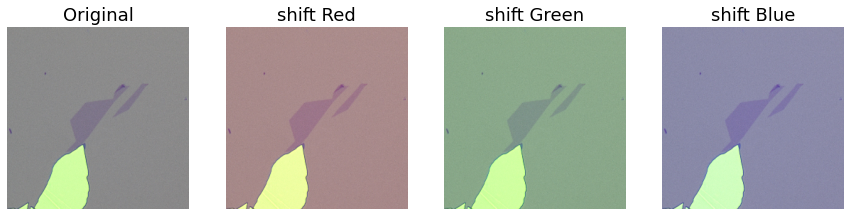

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


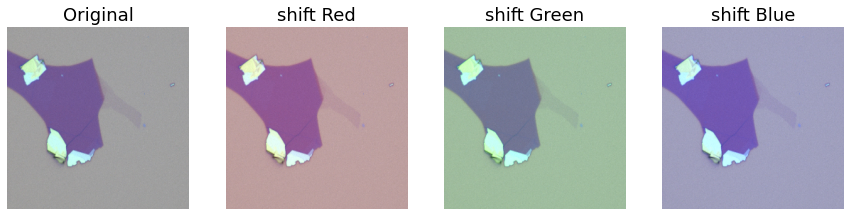

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


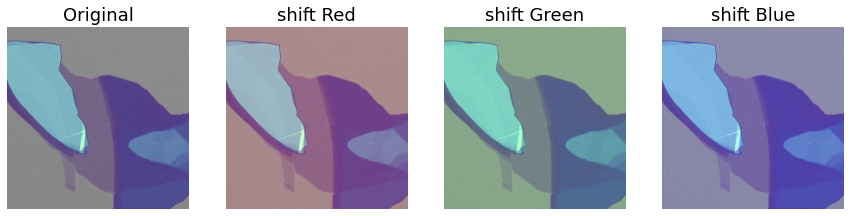

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


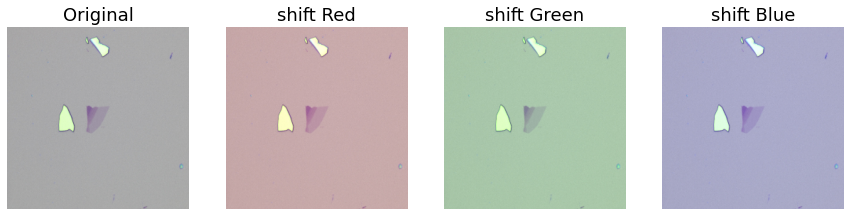

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


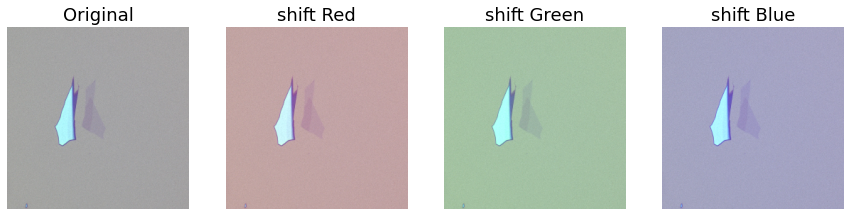

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


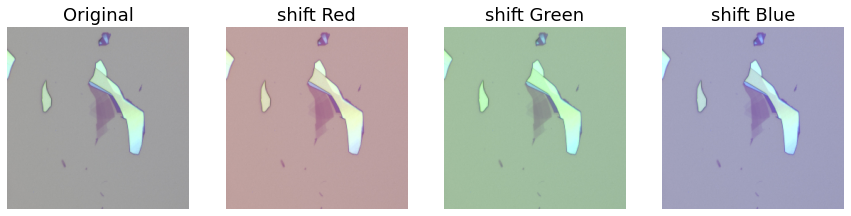

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


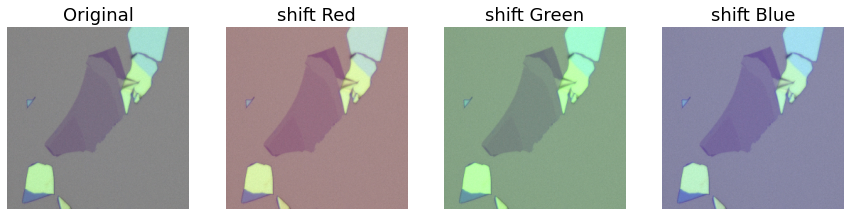

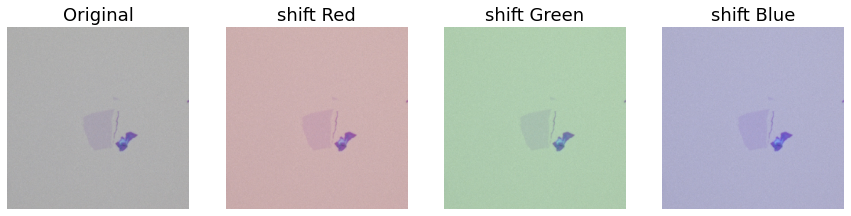

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


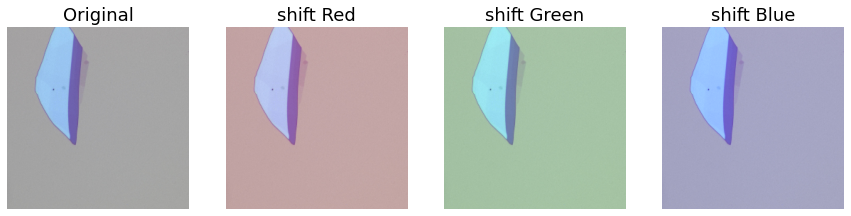

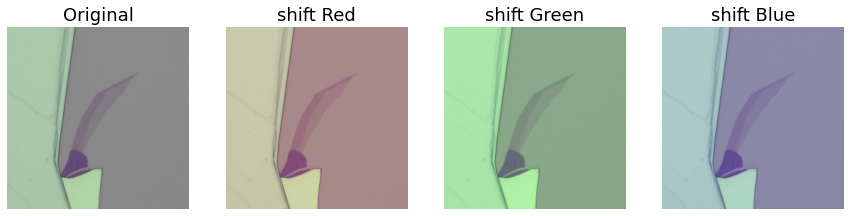

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


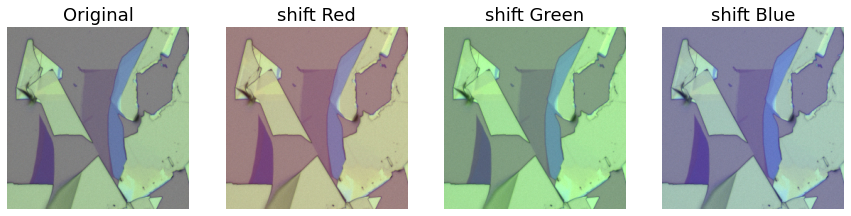

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


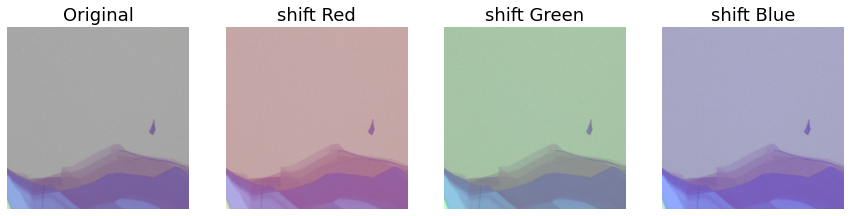

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


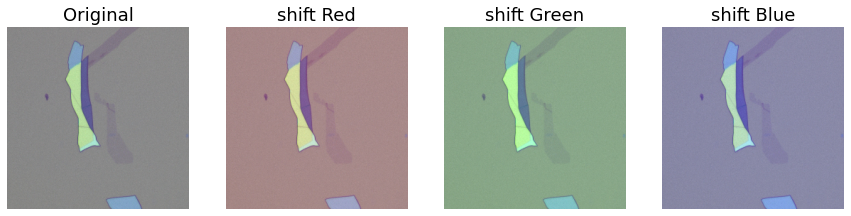

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


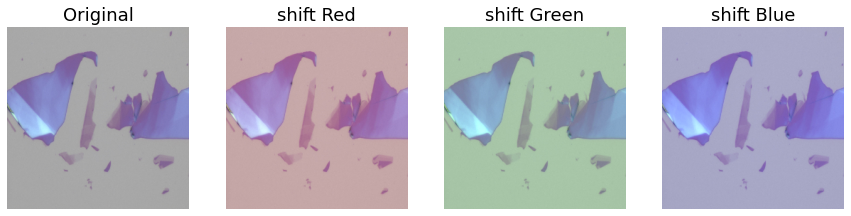

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


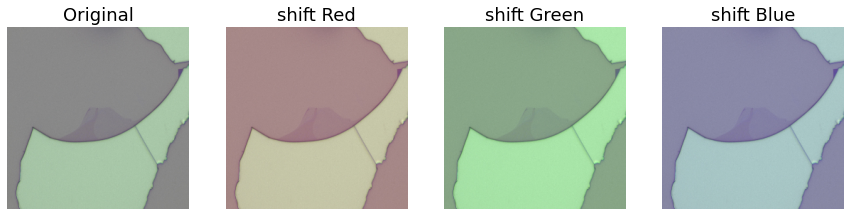

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


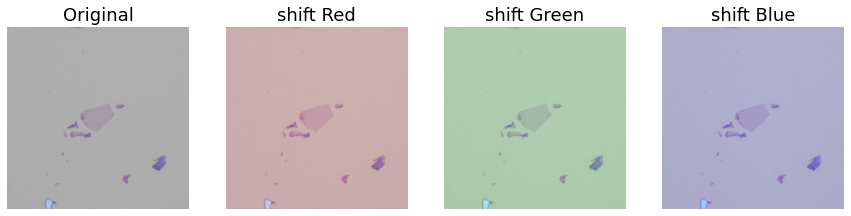

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


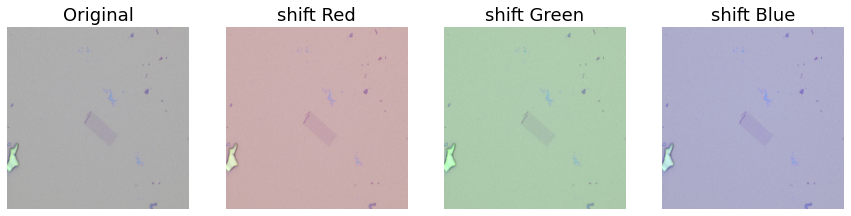

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


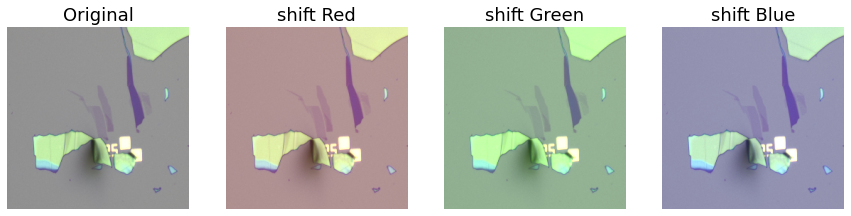

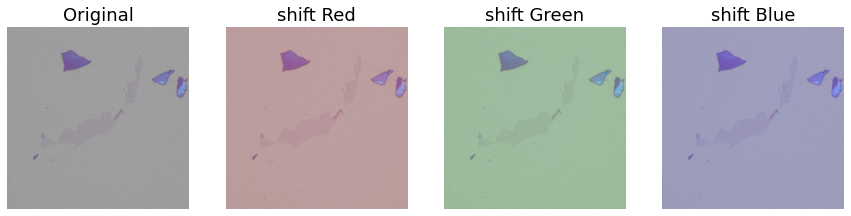

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


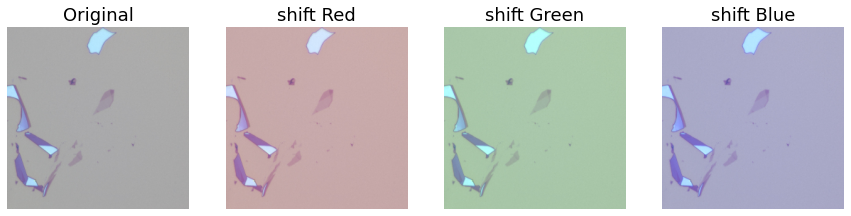

In [ ]:
# Load the test dataset and then shift the RGB color
# build a CocoDataset object for validation images
dataset_val = utils.CocoDataset()
dataset_val.load_coco(dataset_dir1, "val")
dataset_val.prepare()
default_input_size = (256,256,3)
for j in range(57):

  raw = cv2.resize(dataset_val.load_image(j),
                         dsize=default_input_size[:2],
                         interpolation=cv2.INTER_CUBIC)/255
  shift_red = np.zeros((256,256,3))
  shift_red[:,:,0] = 30/255
  shift_green = np.zeros((256,256,3))
  shift_green[:,:,1] = 30/255
  shift_blue = np.zeros((256,256,3))
  shift_blue[:,:,2] = 30/255
  shift_red =  shift_red + raw
  shift_green = shift_green + raw
  shift_blue = shift_blue + raw

  fig, ax = plt.subplots(1, 4, figsize=(15,60))
  [axi.set_axis_off() for axi in ax.ravel()]
  ax[0].imshow(raw)
  ax[0].set_title('Original', fontsize=18)
  ax[1].imshow(shift_red)
  ax[1].set_title('shift Red', fontsize=18)
  ax[2].imshow(shift_green)
  ax[2].set_title('shift Green', fontsize=18)
  ax[3].imshow(shift_blue)
  ax[3].set_title('shift Blue', fontsize=18)
  plt.show()

In [ ]:
# Evaluation metrics
def mean_iou(y_true, y_pred):
    yt0 = y_true[:,:,:,0]
    yp0 = K.cast(y_pred[:,:,:,0] > 0.5, 'float32')
    inter = tf.math.count_nonzero(tf.math.logical_and(tf.equal(yt0, 1), tf.equal(yp0, 1)))
    union = tf.math.count_nonzero(tf.add(yt0, yp0))
    iou = tf.where(tf.equal(union, 0), 1., tf.cast(inter/union, 'float32'))
    return iou

In [ ]:
pos_weight= 200
default_input_size = (256,256,3)
def create_weighted_binary_crossentropy(pos_weight):

    def weighted_binary_crossentropy(y_true, y_pred):

        # Calculate the binary crossentropy
        b_ce = K.binary_crossentropy(y_true, y_pred)

        # Apply the weights
        weight_vector = y_true * pos_weight + (1. - y_true)
        weighted_b_ce = weight_vector * b_ce

        # Return the mean error
        return K.mean(weighted_b_ce)

    return weighted_binary_crossentropy

In [ ]:
get_custom_objects().update({"weighted_binary_crossentropy":create_weighted_binary_crossentropy(pos_weight),
                                 "mean_iou":mean_iou})
model_attached = load_model(model_path)

In [ ]:
def similarity(img1,img2):
    n=0
    for i in range(np.shape(img1)[0]):
        for j in range(np.shape(img1)[1]):
            if img1[i,j]==img2[i,j]:
                n=n+1
    return n/(np.shape(img1)[0]*np.shape(img1)[1])
            
def recall(img1,img2):
    n=0
    n1=0
    for i in range(np.shape(img1)[0]):
        for j in range(np.shape(img1)[1]):
            if img2[i,j]==1 and img1[i,j]==1:
                n=n+1
            if img1[i,j]==1:
                n1=n1+1
    if n1 == 0:
      n1 = 1
    return n/n1

            
def falsealarm(img1,img2):
    n=0
    n1=0
    for i in range(np.shape(img1)[0]):
        for j in range(np.shape(img1)[1]):
            if img2[i,j]==1 and img1[i,j]==0:
                n=n+1
            if img1[i,j]==0:
                n1=n1+1
    return n/n1

# Separation Result


# Shift 20

/usr/local/lib/python3.6/dist-packages/sklearn/externals/joblib/__init__.py:15: FutureWarning: sklearn.externals.joblib is deprecated in 0.21 and will be removed in 0.23. Please import this functionality directly from joblib, which can be installed with: pip install joblib. If this warning is raised when loading pickled models, you may need to re-serialize those models with scikit-learn 0.21+.
  warnings.warn(msg, category=FutureWarning)


Mono_Detection rate: 0.0 mono_falsealarm: 0.00726318359375
Bi_Detection rate: 0.7569339384770549 Bi_falsealarm: 0.0003461677654870738
Predict bi number: 1 ground truth bi number: 1
Predict mono number: 0 ground truth mono number: 0


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


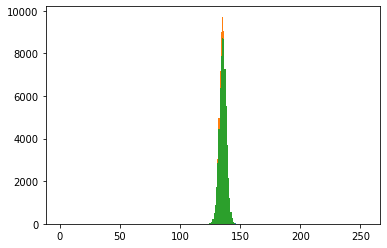

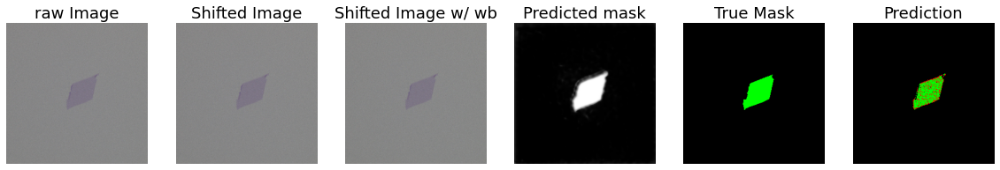

Mono_Detection rate: 0.8064516129032258 mono_falsealarm: 0.005641166758392956
Bi_Detection rate: 0.6045785639958376 Bi_falsealarm: 0.002802942315137437


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Predict bi number: 4 ground truth bi number: 4
Predict mono number: 2 ground truth mono number: 2


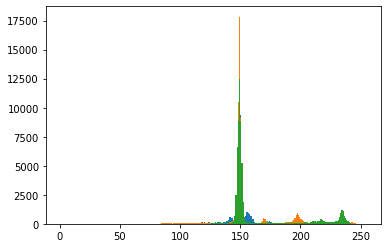

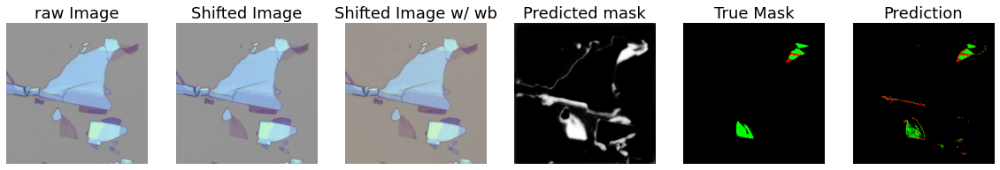

Mono_Detection rate: 0.0 mono_falsealarm: 0.000885009765625
Bi_Detection rate: 0.0 Bi_falsealarm: 0.00113004703439008
Predict bi number: 0 ground truth bi number: 1
Predict mono number: 0 ground truth mono number: 0


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


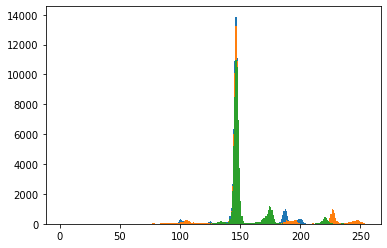

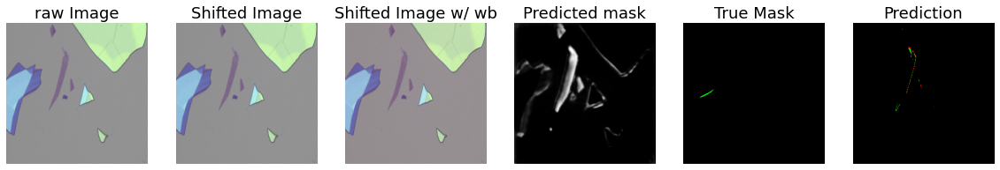

Mono_Detection rate: 0.8881578947368421 mono_falsealarm: 0.0029893303899926416
Bi_Detection rate: 0.37089201877934275 Bi_falsealarm: 0.0021809245891568118


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Predict bi number: 0 ground truth bi number: 1
Predict mono number: 1 ground truth mono number: 1


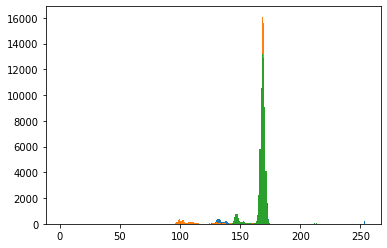

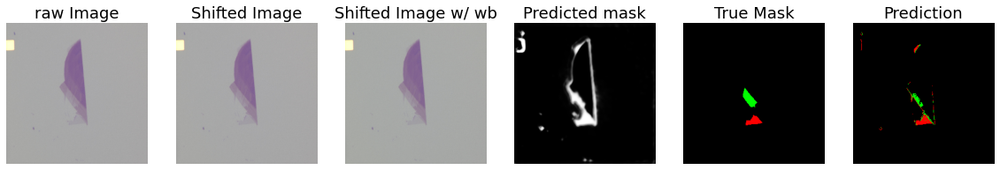

Mono_Detection rate: 0.64937106918239 mono_falsealarm: 0.007189094983194324
Bi_Detection rate: 0.9517733158191031 Bi_falsealarm: 0.019864799774112644


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Predict bi number: 2 ground truth bi number: 2
Predict mono number: 4 ground truth mono number: 5


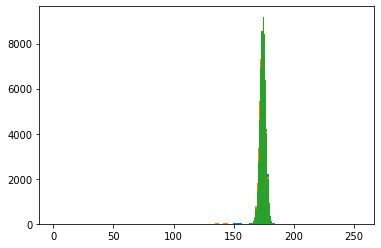

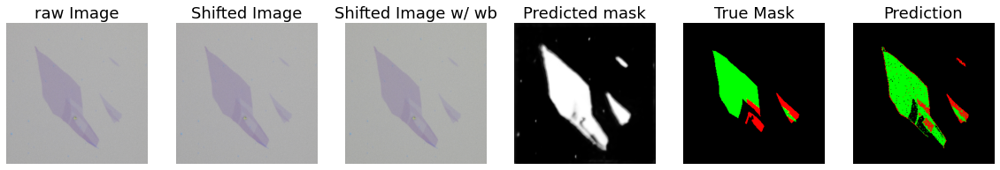

Mono_Detection rate: 0.0 mono_falsealarm: 0.007904052734375
Bi_Detection rate: 0.7522768670309654 Bi_falsealarm: 0.002436450541605885


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Predict bi number: 2 ground truth bi number: 3
Predict mono number: 0 ground truth mono number: 0


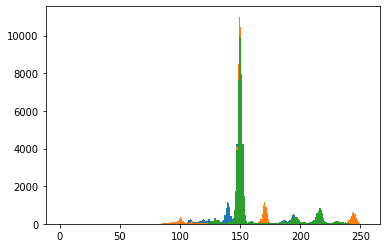

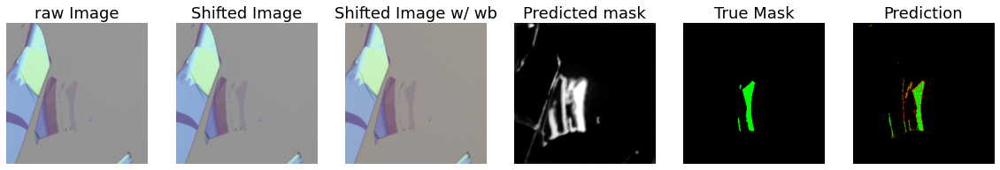

Mono_Detection rate: 0.2926829268292683 mono_falsealarm: 0.007241727014391786
Bi_Detection rate: 0.8210463733650416 Bi_falsealarm: 0.003147805932283021


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Predict bi number: 1 ground truth bi number: 2
Predict mono number: 0 ground truth mono number: 1


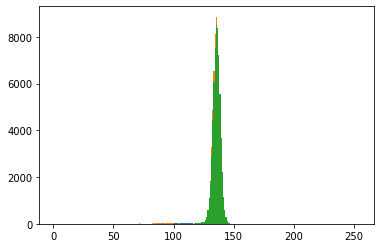

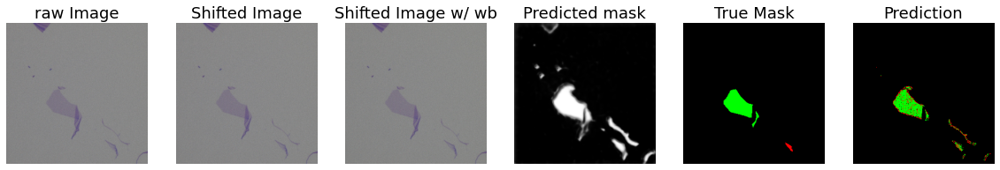

Mono_Detection rate: 0.0 mono_falsealarm: 0.0041656494140625
Bi_Detection rate: 0.869377990430622 Bi_falsealarm: 0.0001576143492103521
Predict bi number: 2 ground truth bi number: 2
Predict mono number: 0 ground truth mono number: 0


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


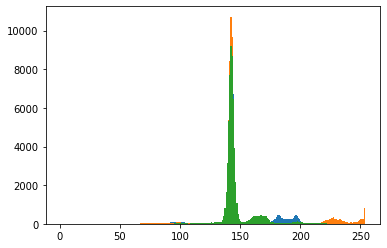

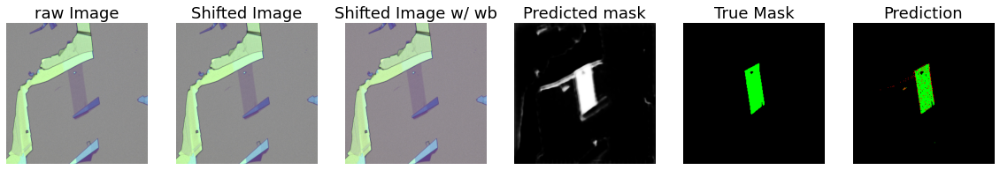

Mono_Detection rate: 0.5192307692307693 mono_falsealarm: 0.0016964176549700452
Bi_Detection rate: 0.0 Bi_falsealarm: 0.00457763671875
Predict bi number: 0 ground truth bi number: 0
Predict mono number: 1 ground truth mono number: 1


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


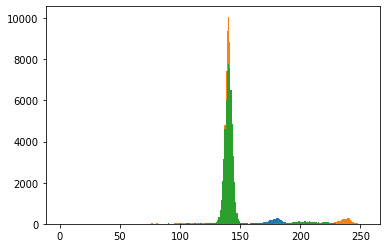

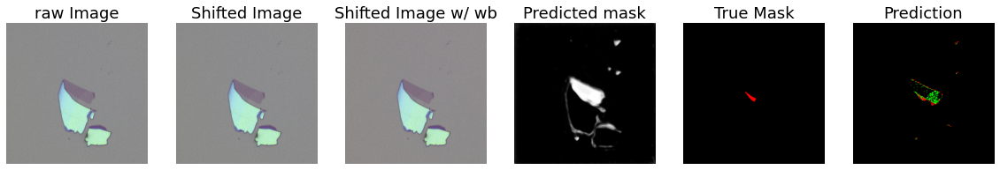

Mono_Detection rate: 0.7816091954022989 mono_falsealarm: 0.0057449311677794926


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Bi_Detection rate: 0.0 Bi_falsealarm: 0.0852813720703125
Predict bi number: 0 ground truth bi number: 0
Predict mono number: 1 ground truth mono number: 1


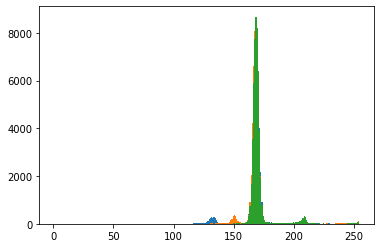

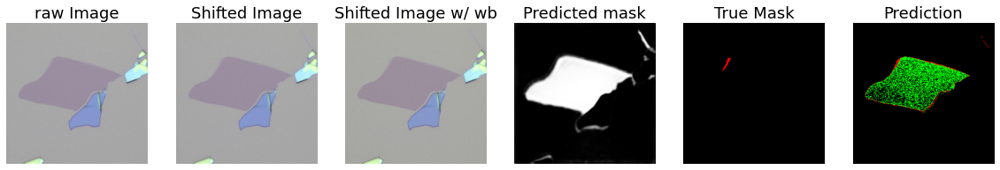

Mono_Detection rate: 0.0 mono_falsealarm: 0.0006103515625


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Bi_Detection rate: 0.8688524590163934 Bi_falsealarm: 9.198080667167451e-05
Predict bi number: 1 ground truth bi number: 1
Predict mono number: 0 ground truth mono number: 0


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


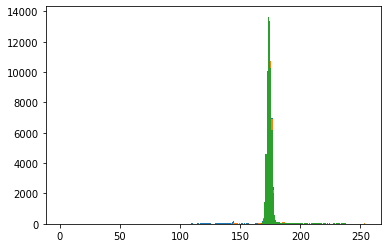

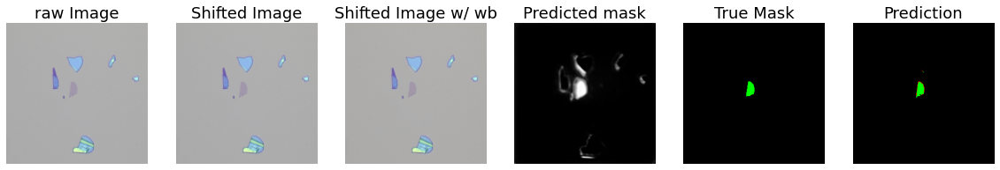

Mono_Detection rate: 0.0 mono_falsealarm: 0.0040283203125
Bi_Detection rate: 0.794392523364486 Bi_falsealarm: 0.0009746895142273228


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Predict bi number: 2 ground truth bi number: 2
Predict mono number: 0 ground truth mono number: 0


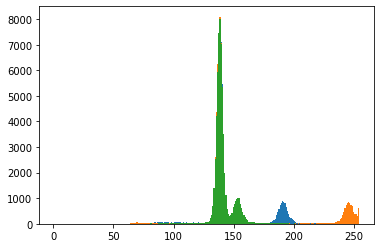

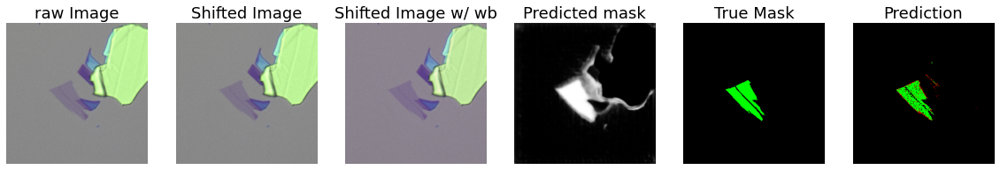

Mono_Detection rate: 0.0 mono_falsealarm: 0.002899169921875
Bi_Detection rate: 0.8395765472312704 Bi_falsealarm: 0.0002799029669714499
Predict bi number: 1 ground truth bi number: 1
Predict mono number: 0 ground truth mono number: 0


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


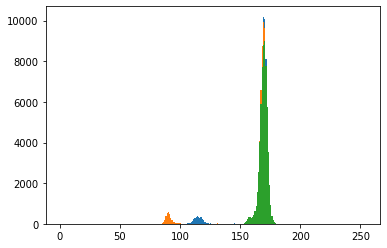

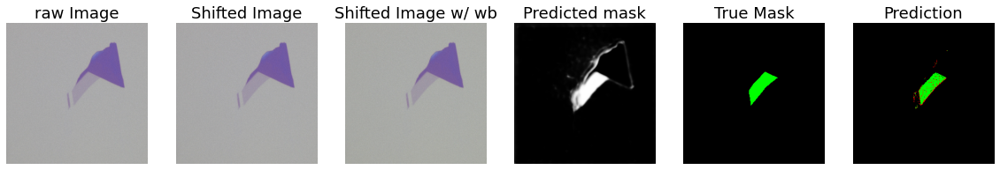

Mono_Detection rate: 0.0 mono_falsealarm: 0.001739501953125


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Bi_Detection rate: 0.9130812690134724 Bi_falsealarm: 0.00044279275717561475
Predict bi number: 1 ground truth bi number: 1
Predict mono number: 0 ground truth mono number: 0


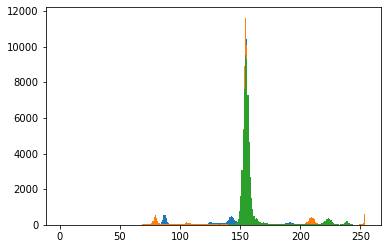

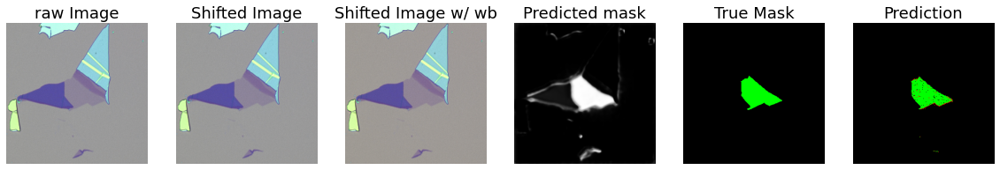

Mono_Detection rate: 0.0 mono_falsealarm: 0.0002687704542220676
Bi_Detection rate: 0.0 Bi_falsealarm: 0.0002755495683056763


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Predict bi number: 0 ground truth bi number: 1
Predict mono number: 0 ground truth mono number: 1


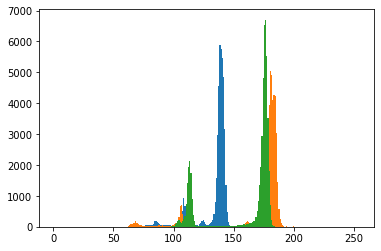

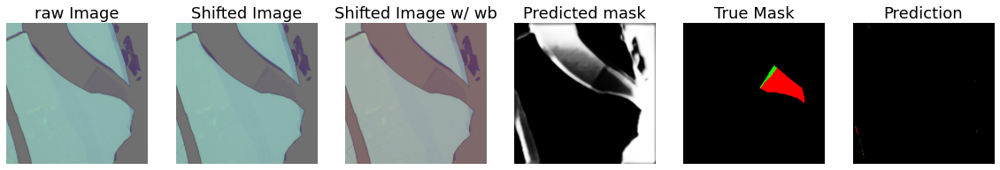

Mono_Detection rate: 0.0 mono_falsealarm: 0.01190185546875
Bi_Detection rate: 0.750445632798574 Bi_falsealarm: 0.005624723503760349


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Predict bi number: 5 ground truth bi number: 6
Predict mono number: 0 ground truth mono number: 0


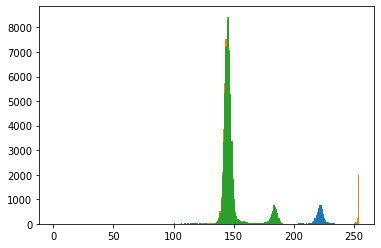

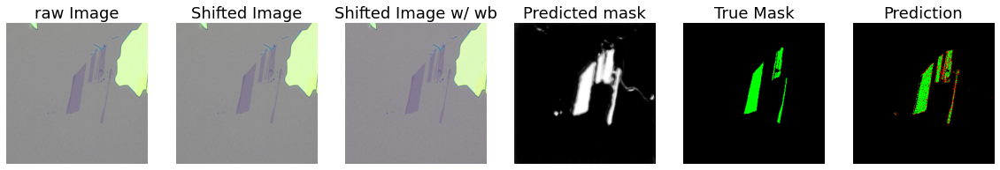

Mono_Detection rate: 0.8383413461538461 mono_falsealarm: 0.003287825651302605
Bi_Detection rate: 0.6903225806451613 Bi_falsealarm: 0.015111836835294842


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Predict bi number: 1 ground truth bi number: 1
Predict mono number: 4 ground truth mono number: 4


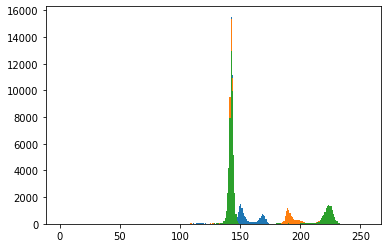

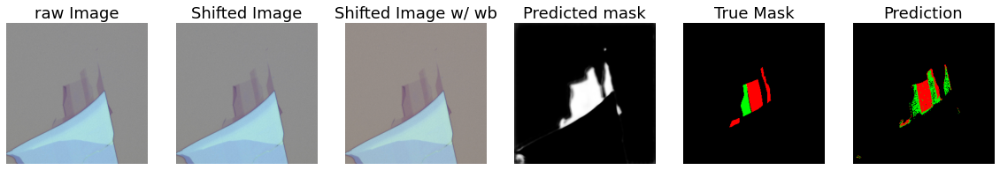

Mono_Detection rate: 0.28023407022106633 mono_falsealarm: 0.005656426763336354
Bi_Detection rate: 0.9188410708234497 Bi_falsealarm: 0.004963611362645471
Predict bi number: 2 ground truth bi number: 2
Predict mono number: 1 ground truth mono number: 3


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


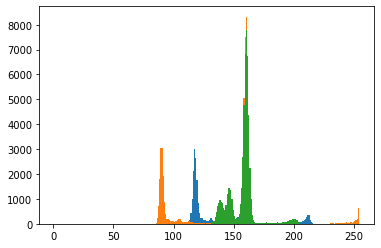

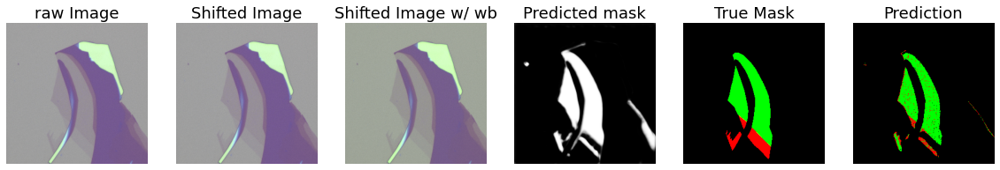

Mono_Detection rate: 0.8558139534883721 mono_falsealarm: 0.0005447809980387884
Bi_Detection rate: 0.0 Bi_falsealarm: 0.002197265625
Predict bi number: 0 ground truth bi number: 0
Predict mono number: 1 ground truth mono number: 1


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


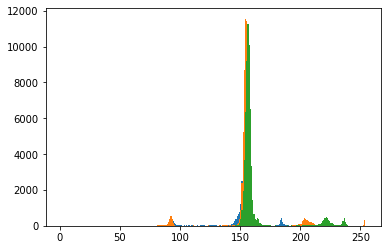

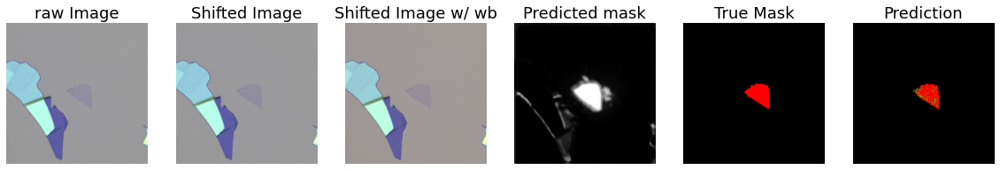

Mono_Detection rate: 0.9388185654008439 mono_falsealarm: 0.000928965132842014
Bi_Detection rate: 0.0 Bi_falsealarm: 0.00054931640625
Predict bi number: 0 ground truth bi number: 0
Predict mono number: 1 ground truth mono number: 1


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


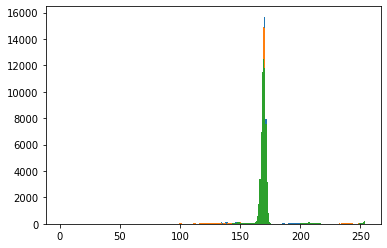

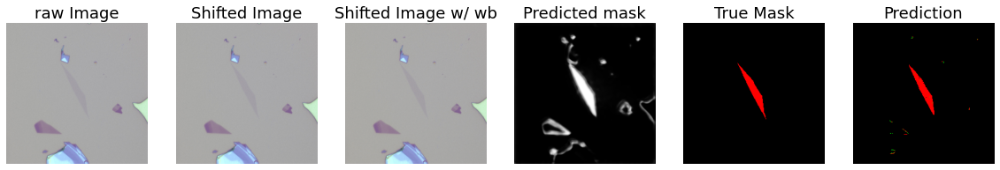

Mono_Detection rate: 0.7690742624618515 mono_falsealarm: 0.0024785834895357304
Bi_Detection rate: 0.6329787234042553 Bi_falsealarm: 0.002081165452653486


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Predict bi number: 1 ground truth bi number: 1
Predict mono number: 2 ground truth mono number: 2


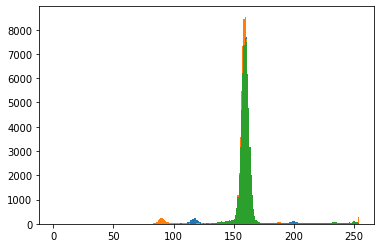

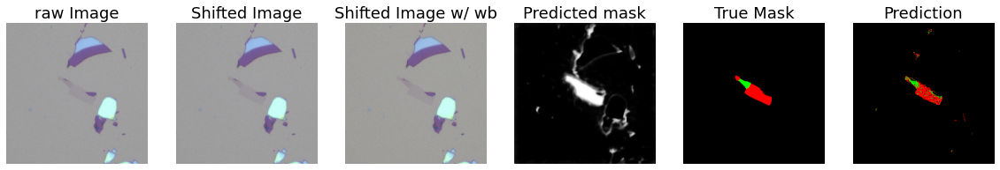

Mono_Detection rate: 0.7647058823529411 mono_falsealarm: 0.003511343165094196
Bi_Detection rate: 0.80355472404116 Bi_falsealarm: 0.0029472443265546712


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Predict bi number: 3 ground truth bi number: 3
Predict mono number: 1 ground truth mono number: 1


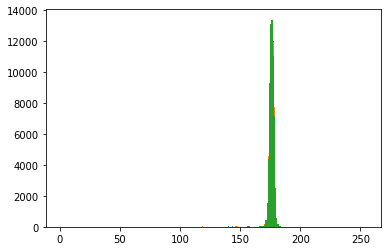

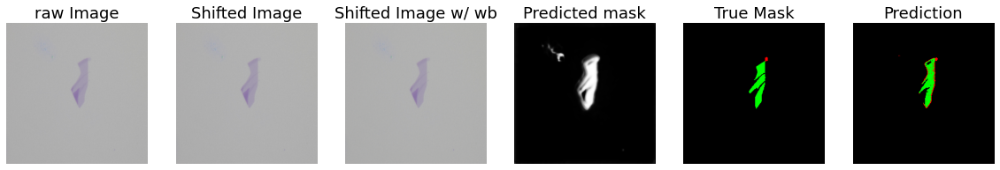

Mono_Detection rate: 0.7947598253275109 mono_falsealarm: 0.0017149769549971673
Bi_Detection rate: 0.0 Bi_falsealarm: 0.0014495849609375
Predict bi number: 0 ground truth bi number: 0
Predict mono number: 1 ground truth mono number: 1


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


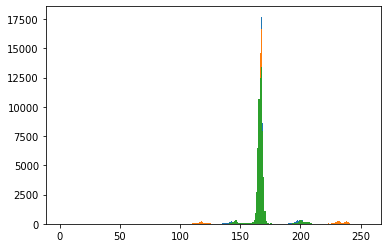

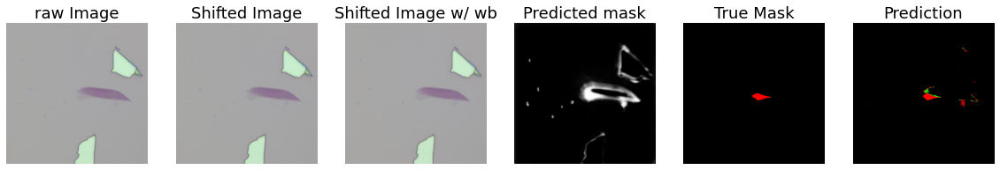

Mono_Detection rate: 0.0 mono_falsealarm: 0.0045029918182928315
Bi_Detection rate: 0.8919523099850969 Bi_falsealarm: 0.0010748668099822413
Predict bi number: 1 ground truth bi number: 1
Predict mono number: 0 ground truth mono number: 1


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


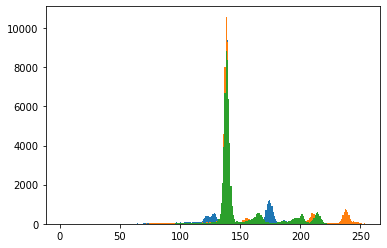

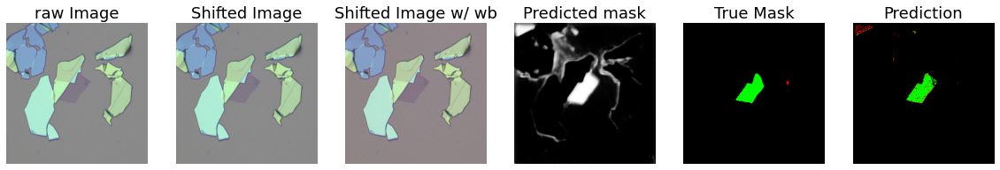

Mono_Detection rate: 0.0 mono_falsealarm: 0.001678466796875


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Bi_Detection rate: 0.8264984227129337 Bi_falsealarm: 0.0007359818457811374
Predict bi number: 1 ground truth bi number: 1
Predict mono number: 0 ground truth mono number: 0


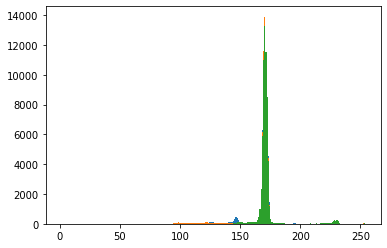

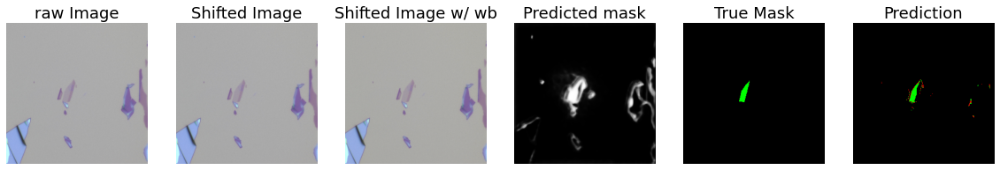

Mono_Detection rate: 0.0 mono_falsealarm: 0.0029754638671875
Bi_Detection rate: 0.7894736842105263 Bi_falsealarm: 0.0004660049396523603
Predict bi number: 1 ground truth bi number: 1
Predict mono number: 0 ground truth mono number: 0


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


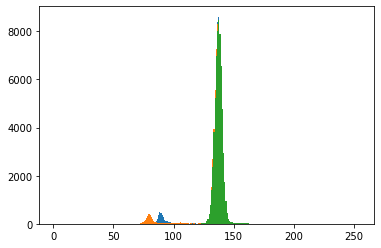

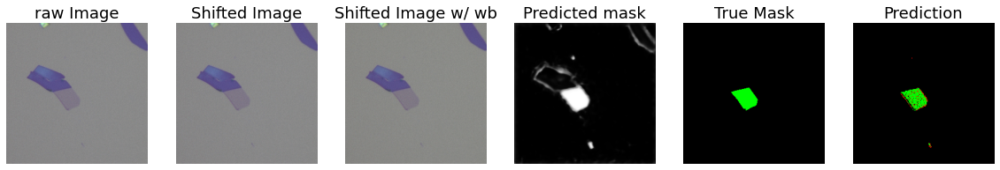

Mono_Detection rate: 0.0 mono_falsealarm: 0.03961181640625


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Bi_Detection rate: 0.75 Bi_falsealarm: 0.0061374795417348605
Predict bi number: 1 ground truth bi number: 1
Predict mono number: 0 ground truth mono number: 0


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


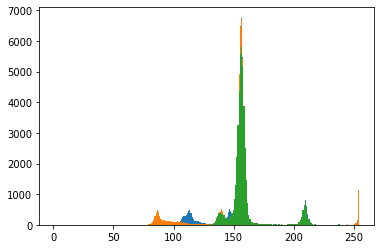

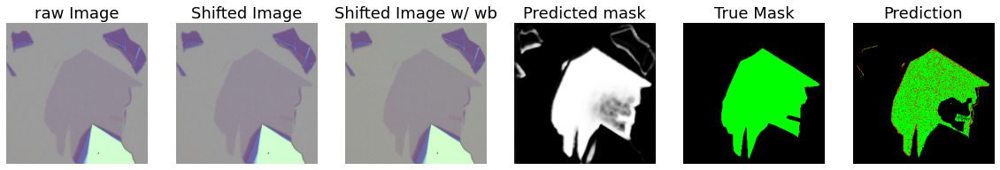

Mono_Detection rate: 0.0 mono_falsealarm: 0.0059051513671875
Bi_Detection rate: 0.44505494505494503 Bi_falsealarm: 0.00301435260274811
Predict bi number: 0 ground truth bi number: 1
Predict mono number: 0 ground truth mono number: 0


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


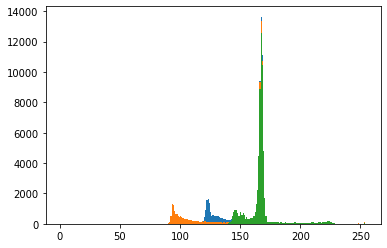

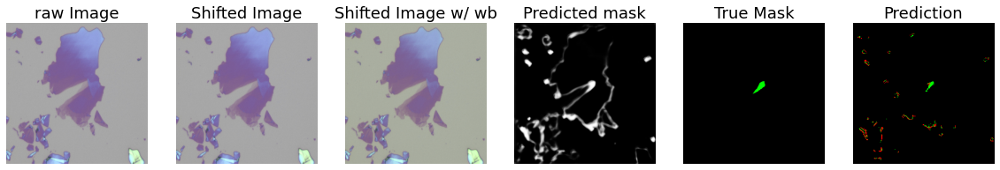

Mono_Detection rate: 0.0 mono_falsealarm: 0.0057220458984375
Bi_Detection rate: 0.8307692307692308 Bi_falsealarm: 0.04281284843671244
Predict bi number: 1 ground truth bi number: 1
Predict mono number: 0 ground truth mono number: 0


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


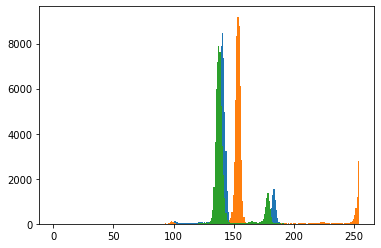

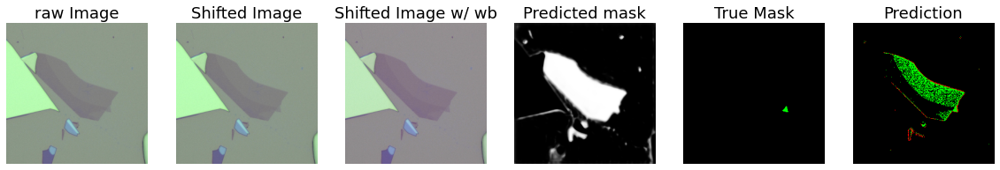

Mono_Detection rate: 0.8275547445255474 mono_falsealarm: 0.0029174425822470515
Bi_Detection rate: 0.7513661202185792 Bi_falsealarm: 0.002976829829676231
Predict bi number: 1 ground truth bi number: 1
Predict mono number: 1 ground truth mono number: 1


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


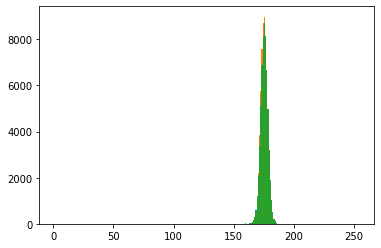

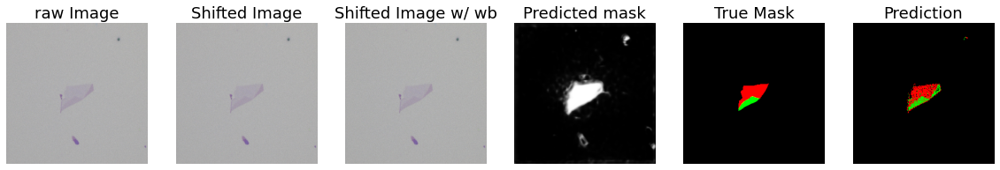

Mono_Detection rate: 0.7297297297297297 mono_falsealarm: 0.009521315112391576
Bi_Detection rate: 0.9217583632844899 Bi_falsealarm: 0.014551268592839032


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Predict bi number: 2 ground truth bi number: 2
Predict mono number: 5 ground truth mono number: 5


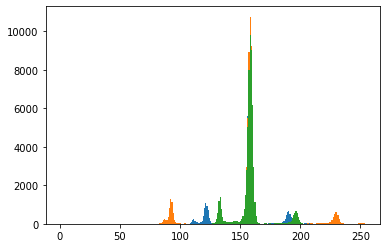

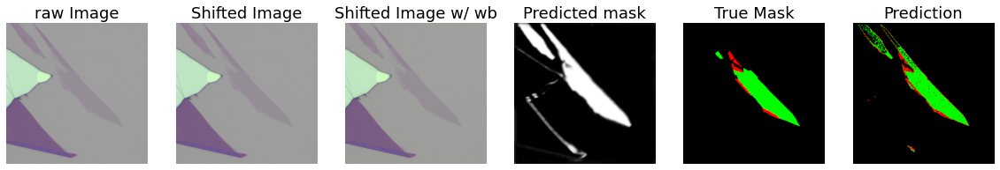

Mono_Detection rate: 0.0 mono_falsealarm: 0.00628662109375
Bi_Detection rate: 0.8927694406548431 Bi_falsealarm: 0.0004687171695948021


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Predict bi number: 2 ground truth bi number: 2
Predict mono number: 0 ground truth mono number: 0


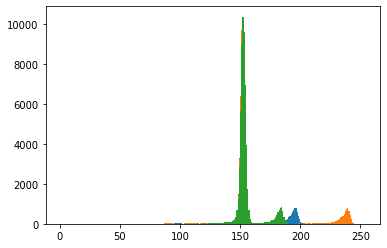

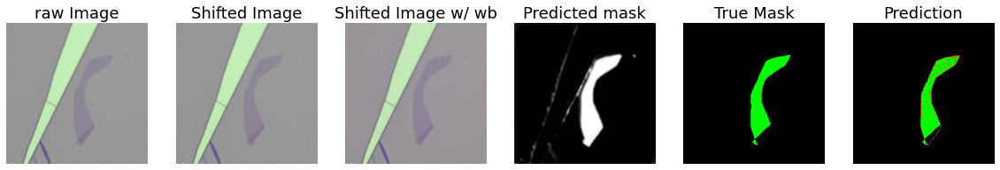

Mono_Detection rate: 0.0 mono_falsealarm: 0.0058135986328125
Bi_Detection rate: 0.7369614512471655 Bi_falsealarm: 0.00559903486249884
Predict bi number: 3 ground truth bi number: 3
Predict mono number: 0 ground truth mono number: 0


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


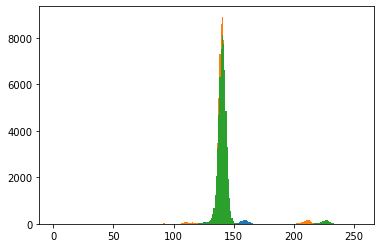

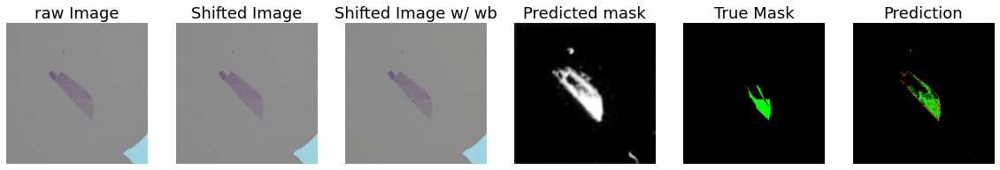

Mono_Detection rate: 0.865970409051349 mono_falsealarm: 0.00029509062388370324


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Bi_Detection rate: 0.0 Bi_falsealarm: 0.001617431640625
Predict bi number: 0 ground truth bi number: 0
Predict mono number: 1 ground truth mono number: 1


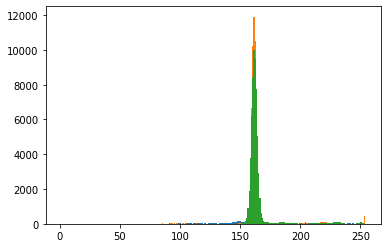

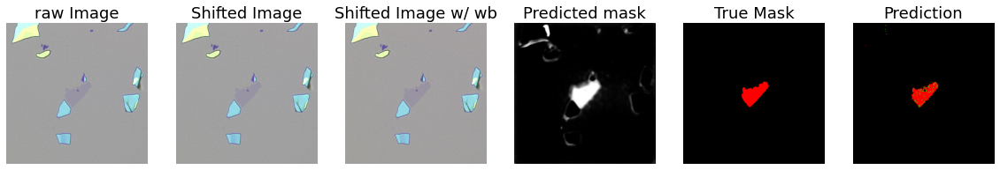

Mono_Detection rate: 0.826151560178306 mono_falsealarm: 0.01167075220079244
Bi_Detection rate: 0.7465437788018433 Bi_falsealarm: 0.051516404109064745


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Predict bi number: 2 ground truth bi number: 2
Predict mono number: 5 ground truth mono number: 5


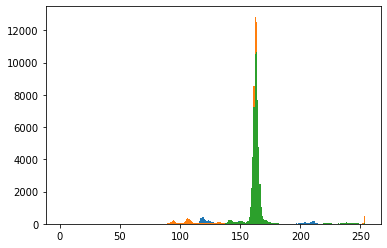

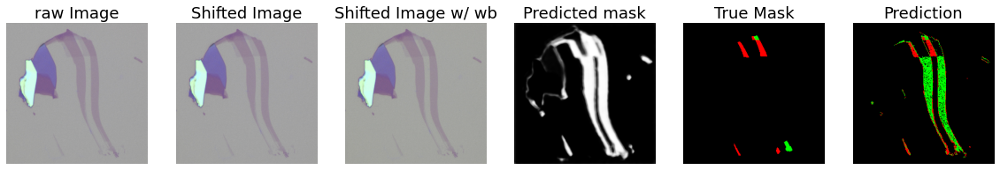

Mono_Detection rate: 0.632183908045977 mono_falsealarm: 0.004797628687986066
Bi_Detection rate: 0.6877637130801688 Bi_falsealarm: 0.0004954480708490741
Predict bi number: 1 ground truth bi number: 1
Predict mono number: 1 ground truth mono number: 1


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


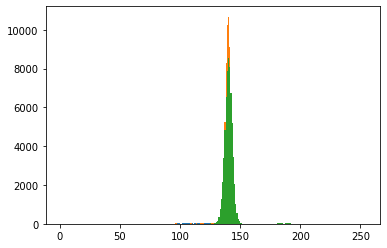

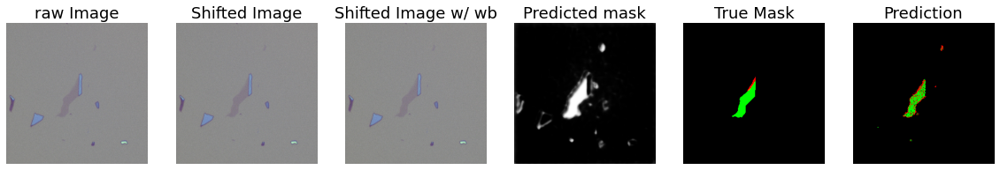

Mono_Detection rate: 0.6416666666666667 mono_falsealarm: 0.004652528749845431
Bi_Detection rate: 0.8467023172905526 Bi_falsealarm: 0.015089887291582576


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Predict bi number: 1 ground truth bi number: 1
Predict mono number: 2 ground truth mono number: 2


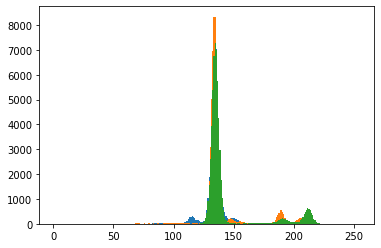

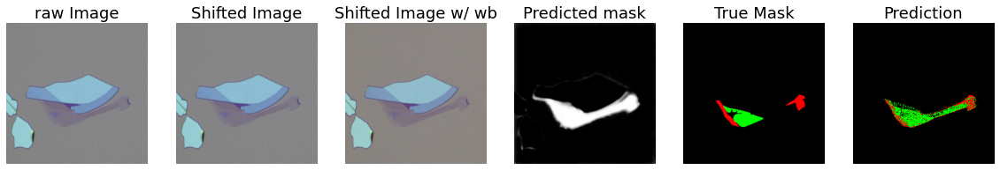

Mono_Detection rate: 0.0 mono_falsealarm: 0.0048370361328125
Bi_Detection rate: 0.7612994350282486 Bi_falsealarm: 0.0001913753508548099
Predict bi number: 2 ground truth bi number: 2
Predict mono number: 0 ground truth mono number: 0


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


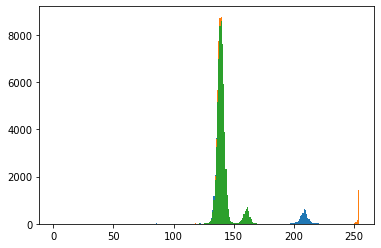

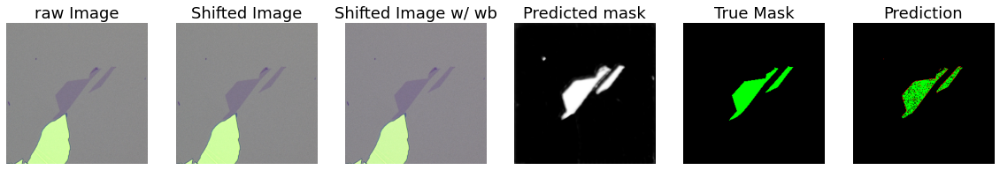

Mono_Detection rate: 0.7443095599393019 mono_falsealarm: 0.0013703323055841042
Bi_Detection rate: 0.6736111111111112 Bi_falsealarm: 0.0023397357474920478


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Predict bi number: 1 ground truth bi number: 1
Predict mono number: 1 ground truth mono number: 1


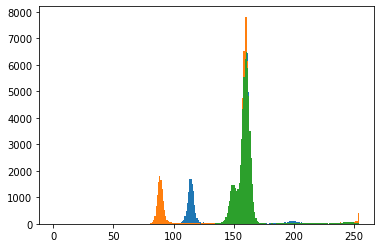

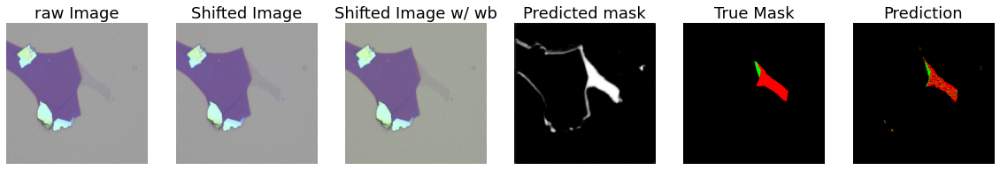

Mono_Detection rate: 0.0 mono_falsealarm: 0.00146484375
Bi_Detection rate: 0.651685393258427 Bi_falsealarm: 0.0007702617349375318


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Predict bi number: 2 ground truth bi number: 2
Predict mono number: 0 ground truth mono number: 0


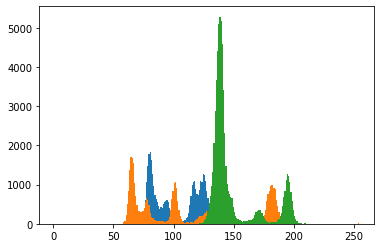

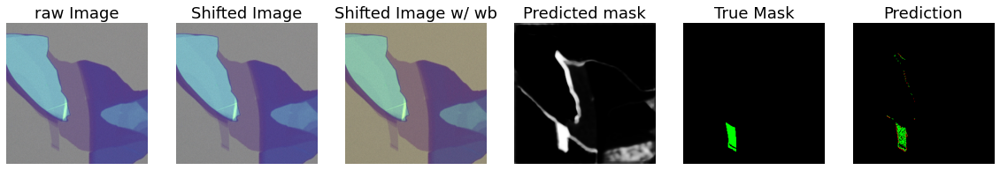

Mono_Detection rate: 0.0 mono_falsealarm: 0.001007080078125
Bi_Detection rate: 0.8973880597014925 Bi_falsealarm: 0.00023076923076923076
Predict bi number: 1 ground truth bi number: 1
Predict mono number: 0 ground truth mono number: 0


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


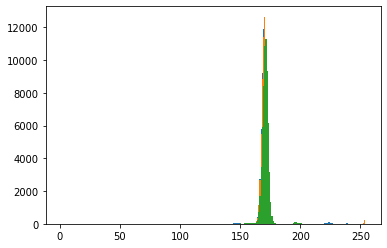

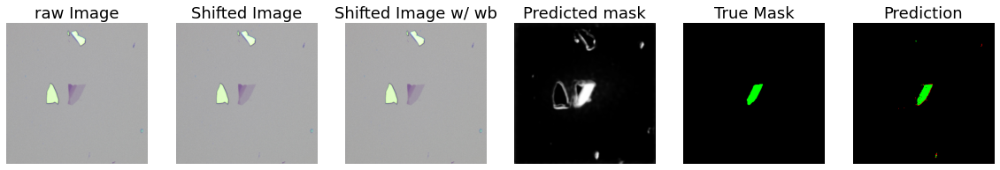

Mono_Detection rate: 0.8006430868167203 mono_falsealarm: 0.001331207529062118
Bi_Detection rate: 0.8089171974522293 Bi_falsealarm: 0.0014139706447398755


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Predict bi number: 1 ground truth bi number: 1
Predict mono number: 2 ground truth mono number: 2


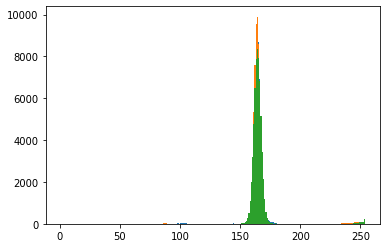

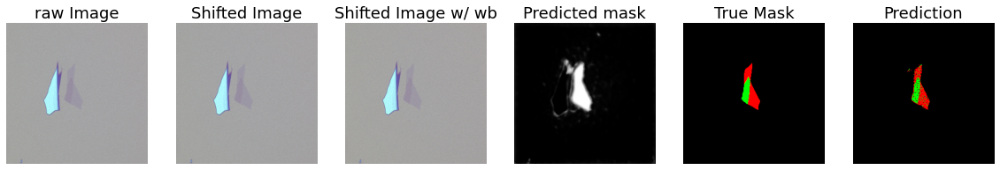

Mono_Detection rate: 0.7922077922077922 mono_falsealarm: 0.0018353675323483528
Bi_Detection rate: 0.8947368421052632 Bi_falsealarm: 0.003252951327906657
Predict bi number: 1 ground truth bi number: 1
Predict mono number: 2 ground truth mono number: 2


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


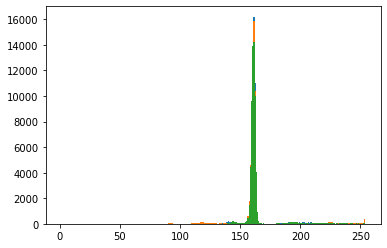

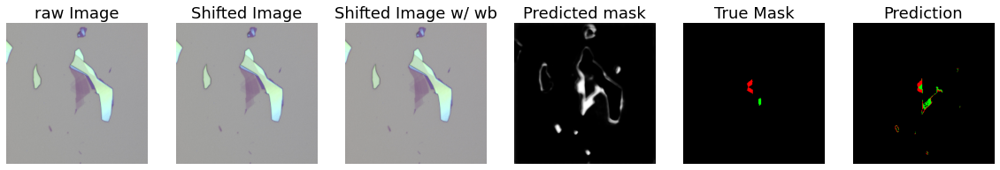

Mono_Detection rate: 0.0 mono_falsealarm: 0.0073394775390625
Bi_Detection rate: 0.7683013503909026 Bi_falsealarm: 0.044301330131453785
Predict bi number: 1 ground truth bi number: 1
Predict mono number: 0 ground truth mono number: 0


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


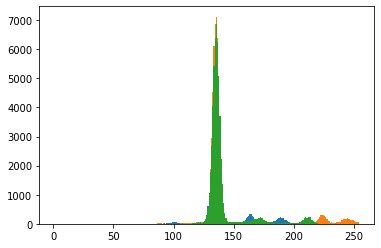

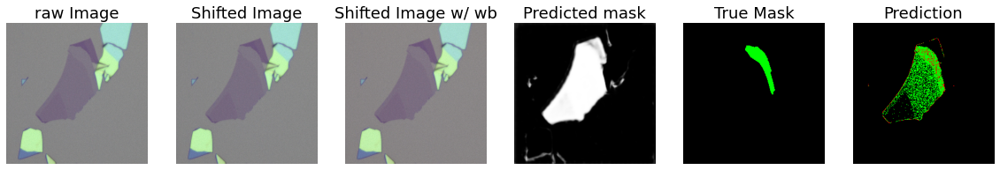

Mono_Detection rate: 0.8520041109969168 mono_falsealarm: 0.0021544267966661424
Bi_Detection rate: 0.0 Bi_falsealarm: 0.001983642578125
Predict bi number: 0 ground truth bi number: 0
Predict mono number: 1 ground truth mono number: 1


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


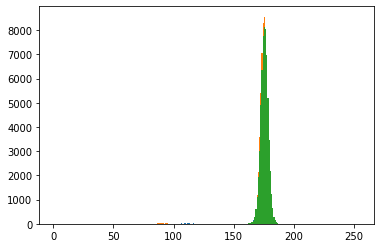

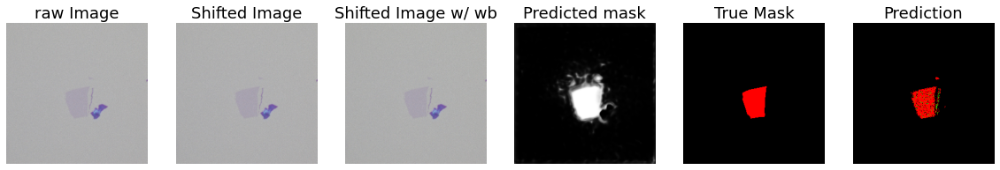

Mono_Detection rate: 0.6742857142857143 mono_falsealarm: 0.000596686097213935
Bi_Detection rate: 0.8913043478260869 Bi_falsealarm: 0.0003531832560425048


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Predict bi number: 1 ground truth bi number: 1
Predict mono number: 1 ground truth mono number: 1


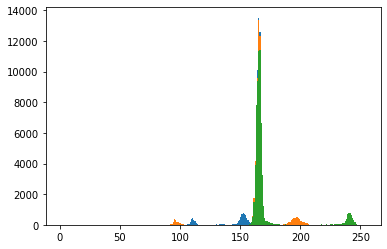

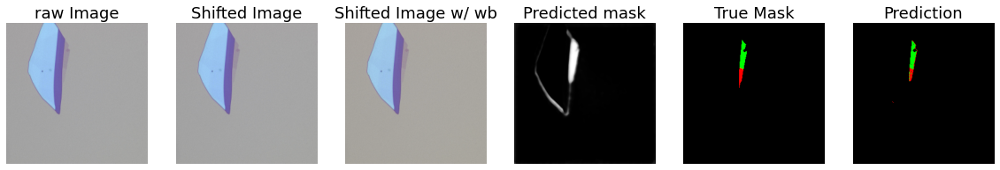

Mono_Detection rate: 0.0 mono_falsealarm: 0.015533447265625


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Bi_Detection rate: 0.8547249647390691 Bi_falsealarm: 0.0031192488848685238
Predict bi number: 1 ground truth bi number: 1
Predict mono number: 0 ground truth mono number: 0


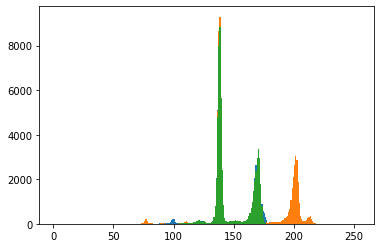

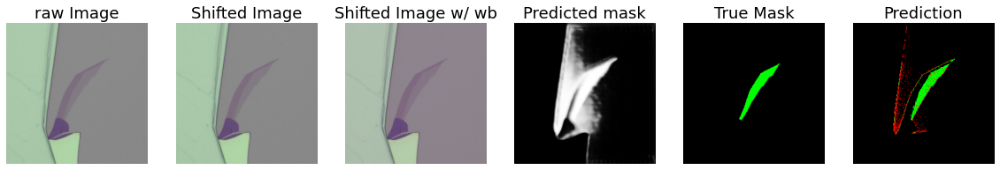

Mono_Detection rate: 0.0 mono_falsealarm: 3.057589702037884e-05
Bi_Detection rate: 0.0 Bi_falsealarm: 7.62939453125e-05
Predict bi number: 0 ground truth bi number: 0
Predict mono number: 0 ground truth mono number: 1


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


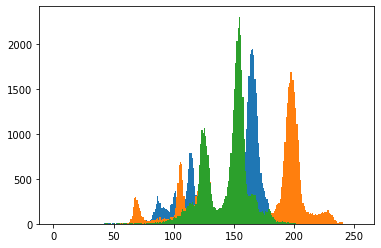

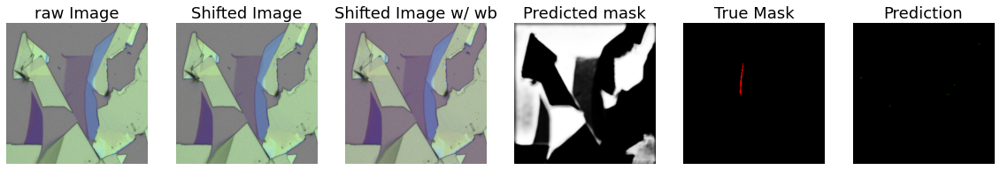

Mono_Detection rate: 0.0 mono_falsealarm: 0.0015411376953125


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Bi_Detection rate: 0.8869309838472834 Bi_falsealarm: 0.0029141932002158663
Predict bi number: 1 ground truth bi number: 1
Predict mono number: 0 ground truth mono number: 0


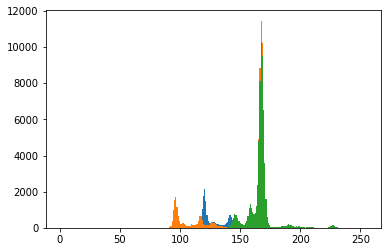

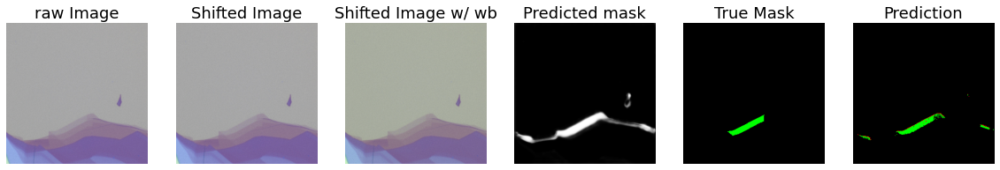

Mono_Detection rate: 0.7628458498023716 mono_falsealarm: 0.004594997255547714
Bi_Detection rate: 0.6736334405144695 Bi_falsealarm: 0.0036863062278355003


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Predict bi number: 1 ground truth bi number: 1
Predict mono number: 4 ground truth mono number: 4


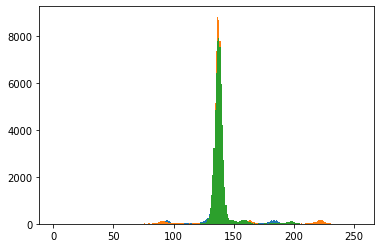

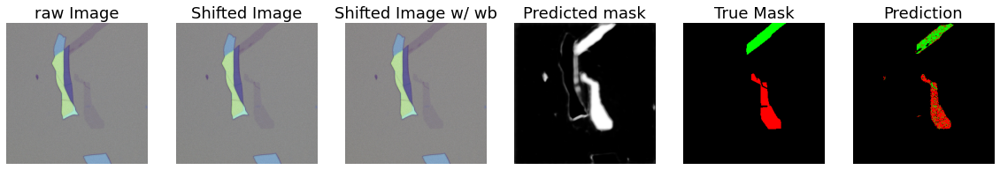

Mono_Detection rate: 0.6169154228855721 mono_falsealarm: 0.005402923394811357
Bi_Detection rate: 0.7341772151898734 Bi_falsealarm: 0.004099238275872618


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Predict bi number: 1 ground truth bi number: 1
Predict mono number: 1 ground truth mono number: 2


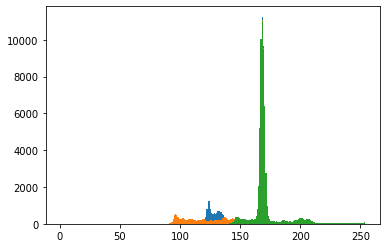

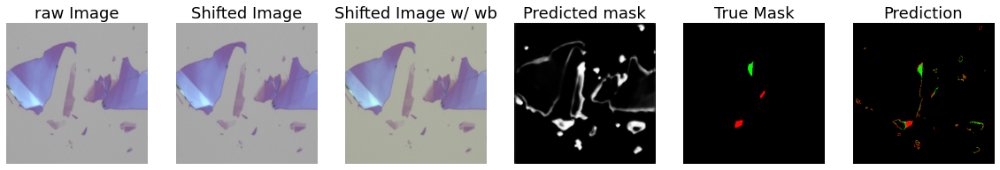

Mono_Detection rate: 0.8038914490527393 mono_falsealarm: 0.025336961137410942
Bi_Detection rate: 0.8500551267916208 Bi_falsealarm: 0.009546797877113988


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Predict bi number: 1 ground truth bi number: 1
Predict mono number: 2 ground truth mono number: 2


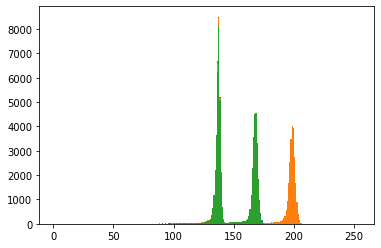

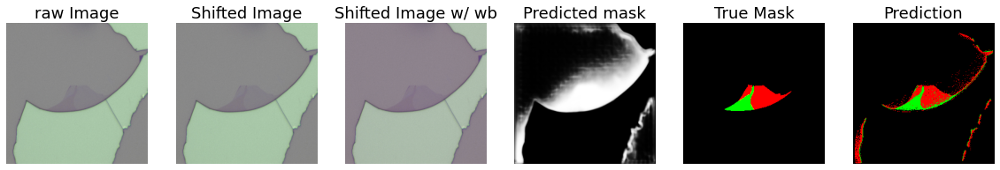

Mono_Detection rate: 0.0 mono_falsealarm: 0.0039520263671875
Bi_Detection rate: 0.8664772727272727 Bi_falsealarm: 0.0018610421836228288
Predict bi number: 1 ground truth bi number: 1
Predict mono number: 0 ground truth mono number: 0


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


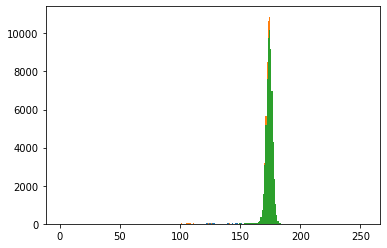

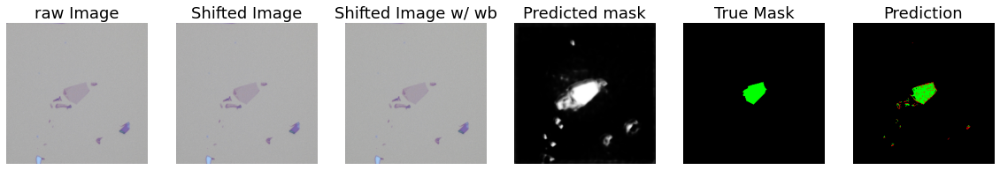

Mono_Detection rate: 0.8827519379844961 mono_falsealarm: 0.0015812972838893712


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Bi_Detection rate: 0.0 Bi_falsealarm: 0.0010833740234375
Predict bi number: 0 ground truth bi number: 0
Predict mono number: 1 ground truth mono number: 1


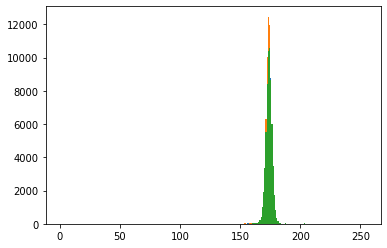

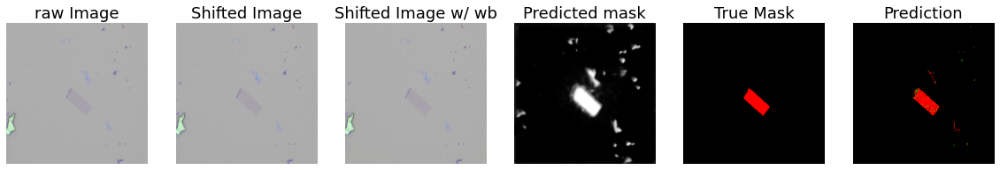

Mono_Detection rate: 0.79182156133829 mono_falsealarm: 0.006220601529103528
Bi_Detection rate: 0.8451178451178452 Bi_falsealarm: 0.0023155342823397776


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Predict bi number: 3 ground truth bi number: 3
Predict mono number: 2 ground truth mono number: 2


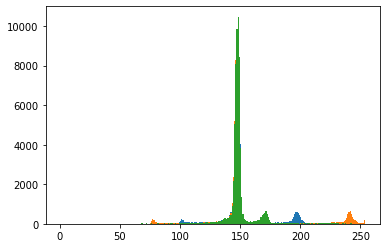

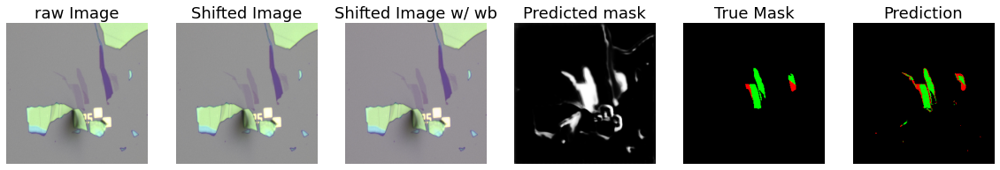

Mono_Detection rate: 0.7757009345794392 mono_falsealarm: 0.002852407814641298
Bi_Detection rate: 0.0 Bi_falsealarm: 0.0053558349609375


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Predict bi number: 0 ground truth bi number: 0
Predict mono number: 2 ground truth mono number: 2


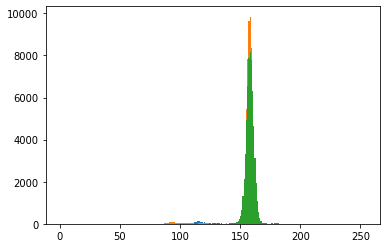

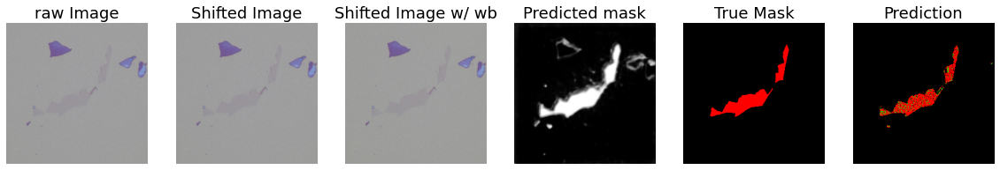

Mono_Detection rate: 0.0 mono_falsealarm: 0.0045623779296875


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Bi_Detection rate: 0.8741935483870967 Bi_falsealarm: 0.003878821328917916
Predict bi number: 1 ground truth bi number: 1
Predict mono number: 0 ground truth mono number: 0


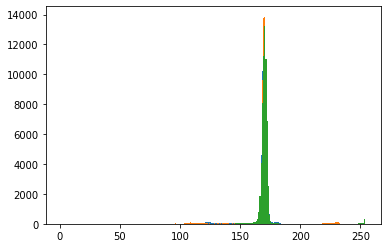

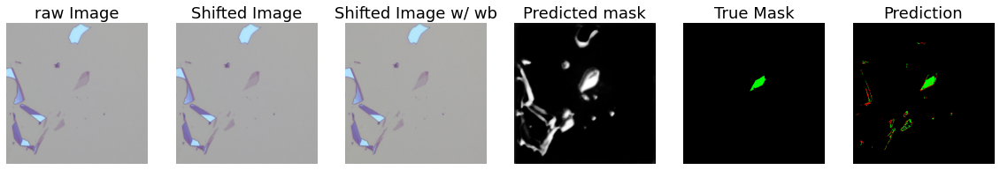

total_Mono_Detection rate: 0.672723812478126 total_Mono_False alarm: 0.0050910098328719915
total_Bi_Detection rate: 0.7529594151007417 total_Bi_False alarm: 0.0069867699318075654
total_Mono_Detection rate: 0.6971282160777197 total_Mono_False alarm: 0.0050943357039648
total_Bi_Detection rate: 0.8108200515491032 total_Bi_False alarm: 0.007000941110116442
bi recall: 0.9041095890410958
mono recall: 0.8709677419354839


In [ ]:
import pickle 
import glob
from sklearn.externals.joblib import load

## Load a trained model
clf1 = pickle.load(open(SVM_model_path, 'rb')) 
sc_X = load(Sc_transform_path)

#change the image format(eg, .bmp, .jpg, .png, etc.)
# for filename in glob.iglob(folder + '**/*.bmp',recursive = True):
#   new_plot=plt.imread(filename)
bi_number = 0
mono_number = 0

Real_bi_number = 0
Real_mono_number = 0

m_FA=[]
m_DR=[]
b_FA=[]
b_DR=[]
m_TP = 0
m_gTp  = 0
m_FP = 0
m_gTB  = 0
b_TP = 0
b_gTp  = 0
b_FP = 0
b_gTB  = 0

b_recall_gbg = 0
m_recall_gbg = 0

Tot_m_num = 0
Tot_b_num = 0

for f in range(57):

  raw = cv2.resize(dataset_val.load_image(f),
                         dsize=default_input_size[:2],
                         interpolation=cv2.INTER_CUBIC)/255
  #blue
  shift_blue = np.zeros((256,256,3))
  shift_blue[:,:,2] = 0/255
  shift_blue = shift_blue + raw

  shift_blue1 = np.zeros((256,256,3))
  shift_blue1[:,:,2] = 0/255
  shift_blue1 = shift_blue1 + raw
  

  r = np.mean(shift_blue[:,:,0])
  g = np.mean(shift_blue[:,:,1])
  b = np.mean(shift_blue[:,:,2])

  total = r+g+b
  KB = (total)/(3*b)
  KG = (total)/(3*g)
  KR = (total)/(3*r)
  shift_blue[:,:,0] = shift_blue[:,:,0]*KR
  shift_blue[:,:,1] = shift_blue[:,:,1]*KG
  shift_blue[:,:,2] = shift_blue[:,:,2]*KB 

  pred_mask = model_attached.predict(np.expand_dims(shift_blue, 0)).squeeze()
  
  #bg = (1-(1 + np.sign(pred_mask[:,:,None]- 0.84))/2)*raw # unlock for UNet w/o wb, and new dataset w wb 
  #bg = (1-(1 + np.sign(pred_mask[:,:,None]- 0.84))/2)*raw1 # unlock for UNet w/o wb, and new dataset w/o wb 
  #bg = (1-(1 + np.sign(pred_mask[:,:,None]- 0.75))/2)*raw # unlock for UNet w wb, and new dataset w wb 
  #bg = (1-(1 + np.sign(pred_mask[:,:,None]- 0.75))/2)*raw1 # unlock for UNet w wb, and new dataset w/o wb 
  bg = (1-(1 + np.sign(pred_mask[:,:,None]- 0.75))/2)*shift_blue1 # for instagram

  y, x, _ = plt.hist((bg[:,:,0]*255).ravel(), bins=range(1,255))
  Red_medium=int(np.mean(x[np.where(y == y.max())]))
  y, x, _ = plt.hist((bg[:,:,1]*255).ravel(), bins=range(1,255))
  Green_medium=int(np.mean(x[np.where(y == y.max())]))
  y, x, _ = plt.hist((bg[:,:,2]*255).ravel(), bins=range(1,255))
  Blue_medium=int(np.mean(x[np.where(y == y.max())]))
  average_bg_color = (Red_medium+Green_medium+Blue_medium)/3
  
  #graphene_pred =  raw * (1 + np.sign(pred_mask[:,:,None]- 0.84))/2 # unlock for UNet w/o wb, and new dataset w wb
  #graphene_pred =  raw1 * (1 + np.sign(pred_mask[:,:,None]- 0.84))/2 # unlock for UNet w/o wb, and new dataset w/o wb 
  #graphene_pred =  raw * (1 + np.sign(pred_mask[:,:,None]- 0.75))/2 # unlock for UNet w wb, and new dataset w wb
  graphene_pred =  shift_blue1 * (1 + np.sign(pred_mask[:,:,None]- 0.75))/2 # unlock for UNet w wb, and new dataset w/o wb
  red = graphene_pred[:,:,0]
  green = graphene_pred[:,:,1]
  blue = graphene_pred[:,:,2]
  red=red.flatten()
  green = green.flatten()
  blue=blue.flatten()
  for j in range(len(red)):
    k = j % 256 
    i = j // 256
    if red[j]+green[j]+blue[j] == 0:
      graphene_pred[i,k,:] = 0
      graphene_pred[i,k,2] = 255  
    else:
      #x = np.array([red[j],green[j],blue[j], average_bg_color]) # unlock for 4 features 
      average = np.mean([red[j],green[j],blue[j]]) # unlock for 2 feature
      x = np.array([average, average_bg_color]) # unlock for 2 feature
      x = np.expand_dims(x,0)
      x = sc_X.transform(x) # Perform mean and standard deviation on the x value
      y = clf1.predict(x)
      if y == 0:
        graphene_pred[i,k,:] = 0 
        graphene_pred[i,k,2] = 255   
      elif y == 1:
        graphene_pred[i,k,:] = 0
        graphene_pred[i,k,0] = 255
      elif y == 2:
        graphene_pred[i,k,:] = 0
        graphene_pred[i,k,1] = 255

  mpred = graphene_pred[:,:,0]/255
  bpred = graphene_pred[:,:,1]/255
  
  # Ground truth monolayer
  h=f
  mmask = np.clip(np.sum(dataset_val.load_mask(h)[0][:,:,[i for i in range(len(dataset_val.load_mask(h)[1])) if dataset_val.load_mask(h)[1][i]==2]],axis=-1,keepdims=True),a_min=0,a_max=1)
  mmask = cv2.resize(mmask.astype(np.float32), dsize=default_input_size[:2], interpolation=cv2.INTER_CUBIC)
  mmask[mmask != 0 ] = 1
    
    # Ground truth bilayer
  bmask = np.clip(np.sum(dataset_val.load_mask(h)[0][:,:,[i for i in range(len(dataset_val.load_mask(h)[1])) if dataset_val.load_mask(h)[1][i]==1]],axis=-1,keepdims=True),a_min=0,a_max=1)
  bmask = cv2.resize(bmask.astype(np.float32), dsize=default_input_size[:2], interpolation=cv2.INTER_CUBIC)
  bmask[bmask != 0 ] = 1

  A=recall(mmask,mpred)
  B=falsealarm(mmask,mpred)
  print("Mono_Detection rate:",A,"mono_falsealarm:",B)
  m_TP+=np.sum(mpred * mmask)
  m_gTp+=np.sum(mmask)

  m_FP += np.sum(mpred * (1-mmask))
  m_gTB += np.sum((1-mmask))
  if np.sum(mmask)==0:
    m_FA.append(B)
  else:
    m_FA.append(B)
    m_DR.append(A)
    Tot_m_num += 1
    if A > 0.5:
      m_recall_gbg += 1

  A=recall(bmask,bpred)
  B=falsealarm(bmask,bpred)
  print("Bi_Detection rate:",A,"Bi_falsealarm:",B)
  b_TP+=np.sum(bpred * bmask)
  b_gTp+=np.sum(bmask)

  b_FP += np.sum(bpred * (1-bmask))
  b_gTB += np.sum((1-bmask))
  if np.sum(bmask)==0:
    b_FA.append(B)
  else:
    b_FA.append(B)
    b_DR.append(A)
    Tot_b_num += 1
    if A > 0.5:
      b_recall_gbg += 1
  gt_mask = dataset_val.load_mask(h)
  image_bi_number =0
  image_mono_number = 0

  image_real_bi_number = 0
  image_real_mono_number = 0

  for z in range(len(gt_mask[1])):
    mask_graphene = np.clip(np.sum(gt_mask[0][:,:,[z]], axis = -1, keepdims = True), a_min = 0, a_max = 1)
    #mask_impurity = np.clip(np.sum(gt_mask[0][:,:,[i for i in range(len(gt_mask[1])) if gt_mask[1][i] ==1]], axis = -1, keepdims = True), a_min = 0, a_max = 1)
            
    mask_graphene = cv2.resize(mask_graphene.astype(np.float32), dsize=default_input_size[:2], interpolation=cv2.INTER_CUBIC)
    ##mask = np.clip(np.sum(gt_mask[0][:,:,[i for i in range(len(gt_mask[1])) if gt_mask[1][i] ==1]], axis = -1, keepdims = True), a_min = 0, a_max = 1)
    mask_graphene[mask_graphene != 0] = 1

    graphene_count = graphene_pred * mask_graphene[:,:,None] 

    bi_pixel = np.sum(graphene_count[:,:,1])/255
    mono_pixel = np.sum(graphene_count[:,:,0])/255
    bg_pixel = np.sum(graphene_count[:,:,2])/255
    
    #background_pixel = np.sum(defect_count[:,:,3])
    if bi_pixel == np.max([bi_pixel,mono_pixel,bg_pixel]) and gt_mask[1][z] ==1:
      bi_number+=1
      image_bi_number+=1
    if mono_pixel == np.max([bi_pixel,mono_pixel,bg_pixel]) and gt_mask[1][z] ==2:
      mono_number+=1
      image_mono_number+=1
    #if cluster_pixel == np.max([bi_pixel,mono_pixel,bg_pixel]) and gt_mask[1][z] ==3:
      #cluster_number+=1
      #image_cluster_number +=1 
    if gt_mask[1][z] ==1:
      Real_bi_number+=1
      image_real_bi_number += 1
    if gt_mask[1][z] ==2:
      Real_mono_number+=1
      image_real_mono_number+=1
    #if gt_mask[1][z] ==3:
      #Real_cluster_number+=1
      #image_real_cluster_number+=1
  
  

  print('Predict bi number:',image_bi_number,'ground truth bi number:',image_real_bi_number)
  print('Predict mono number:',image_mono_number,'ground truth mono number:',image_real_mono_number)
  #print('Predict cluster number:',image_cluster_number,'ground truth cluster number:',image_real_cluster_number)
  zero = np.zeros((256,256))
  mask = np.stack([mmask,bmask,zero],axis=2)
  graphene_pred[:,:,2]=0
  
  fig, ax = plt.subplots(1, 6, figsize=(20,120))
  [axi.set_axis_off() for axi in ax.ravel()]
  ax[0].imshow(raw)
  ax[0].set_title('raw Image', fontsize=18)
  ax[1].imshow(shift_blue1)
  ax[1].set_title('Shifted Image', fontsize=18)
  ax[2].imshow(shift_blue)
  ax[2].set_title('Shifted Image w/ wb', fontsize=18)
  ax[3].imshow(pred_mask, cmap = 'gray')
  ax[3].set_title('Predicted mask', fontsize=18)
  ax[4].imshow(mask)
  ax[4].set_title('True Mask',fontsize=18)
  ax[5].imshow(graphene_pred)
  ax[5].set_title('Prediction',fontsize=18)
  plt.show()

print("total_Mono_Detection rate:",np.mean(m_DR),"total_Mono_False alarm:",np.mean(m_FA))
print("total_Bi_Detection rate:",np.mean(b_DR),"total_Bi_False alarm:",np.mean(b_FA))

print("total_Mono_Detection rate:",m_TP/m_gTp,"total_Mono_False alarm:",m_FP/m_gTB)
print("total_Bi_Detection rate:",b_TP/b_gTp,"total_Bi_False alarm:",b_FP/b_gTB)
      
print("bi recall:",bi_number/Real_bi_number)
print("mono recall:",mono_number/Real_mono_number)

## Plot the images

# Shift 10

Mono_Detection rate: 0.0 mono_falsealarm: 0.006744384765625
Bi_Detection rate: 0.7589510842158346 Bi_falsealarm: 0.00033043286705584316
Predict bi number: 1 ground truth bi number: 1
Predict mono number: 0 ground truth mono number: 0


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


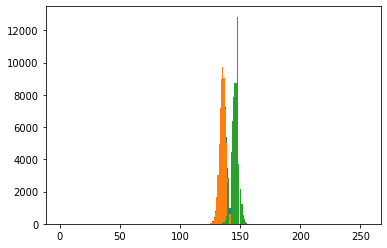

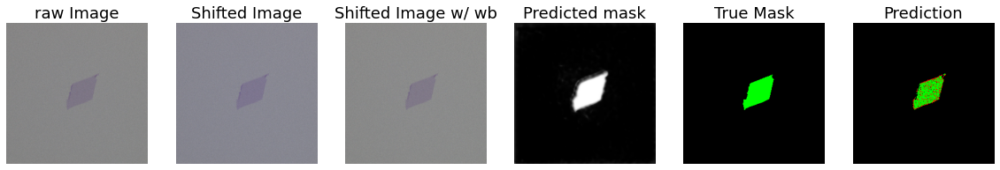

Mono_Detection rate: 0.8064516129032258 mono_falsealarm: 0.0051825353146211705
Bi_Detection rate: 0.7429760665972945 Bi_falsealarm: 0.0030507162214479288


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Predict bi number: 4 ground truth bi number: 4
Predict mono number: 2 ground truth mono number: 2


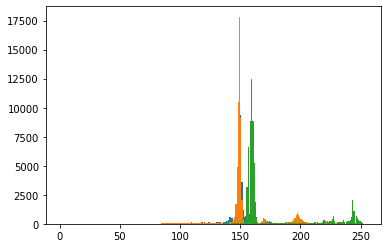

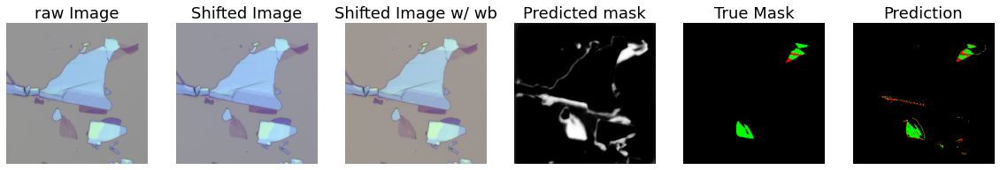

Mono_Detection rate: 0.0 mono_falsealarm: 0.0006561279296875


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Bi_Detection rate: 0.0 Bi_falsealarm: 0.0011453179402602163
Predict bi number: 0 ground truth bi number: 1
Predict mono number: 0 ground truth mono number: 0


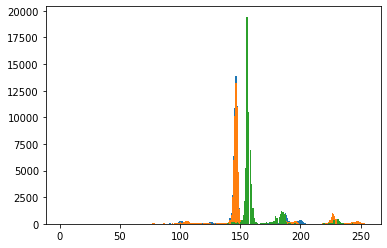

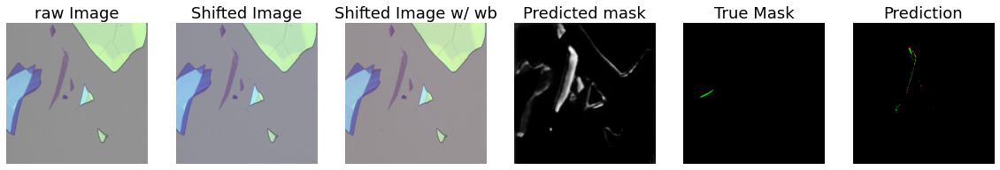

Mono_Detection rate: 0.8782894736842105 mono_falsealarm: 0.002866691194505764
Bi_Detection rate: 0.3474178403755869 Bi_falsealarm: 0.0023959453232990325


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Predict bi number: 0 ground truth bi number: 1
Predict mono number: 1 ground truth mono number: 1


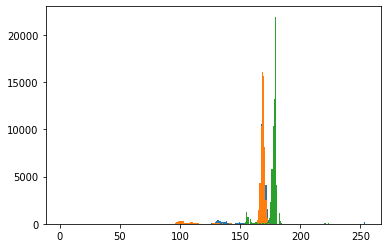

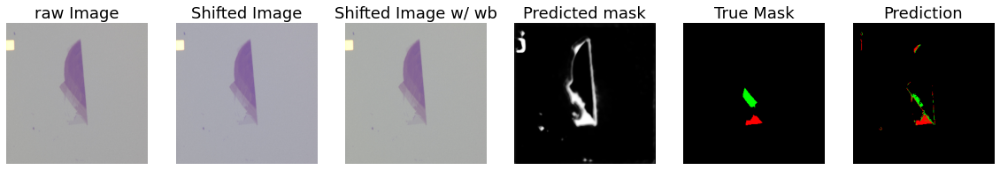

Mono_Detection rate: 0.8372641509433962 mono_falsealarm: 0.021069338976721027
Bi_Detection rate: 0.811221617564271 Bi_falsealarm: 0.018718753633298453


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Predict bi number: 2 ground truth bi number: 2
Predict mono number: 4 ground truth mono number: 5


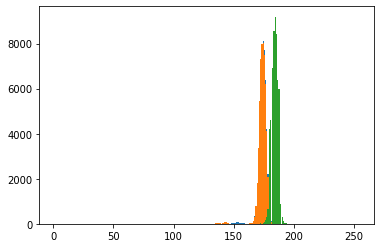

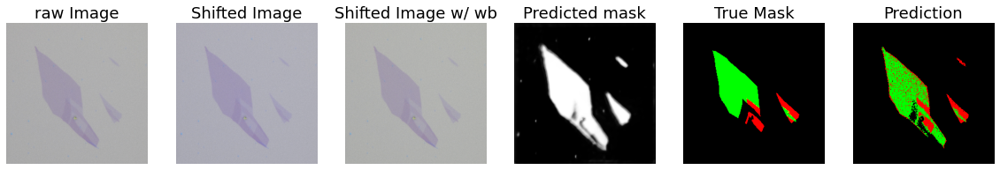

Mono_Detection rate: 0.0 mono_falsealarm: 0.0071868896484375
Bi_Detection rate: 0.7550091074681239 Bi_falsealarm: 0.002451969334864521


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Predict bi number: 2 ground truth bi number: 3
Predict mono number: 0 ground truth mono number: 0


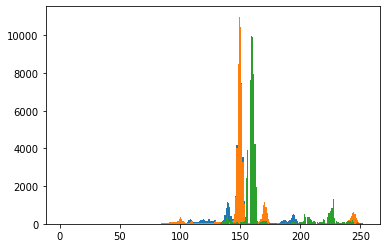

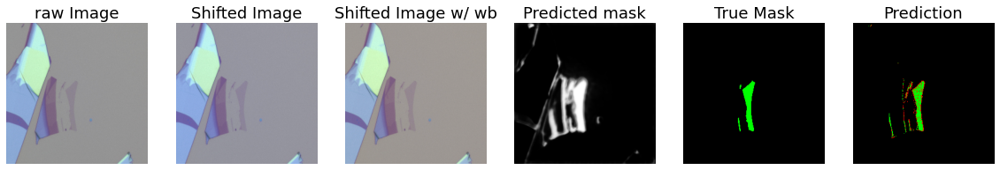

Mono_Detection rate: 0.2682926829268293 mono_falsealarm: 0.007608396736639472
Bi_Detection rate: 0.786563614744352 Bi_falsealarm: 0.0028189306856265858
Predict bi number: 1 ground truth bi number: 2
Predict mono number: 0 ground truth mono number: 1


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


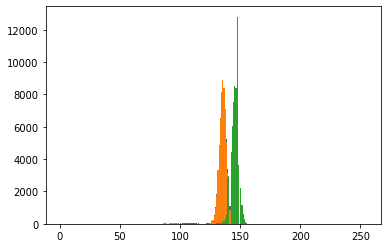

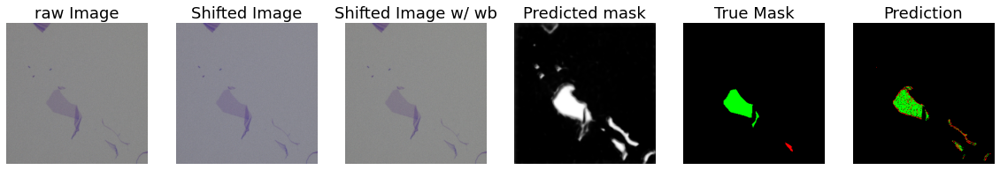

Mono_Detection rate: 0.0 mono_falsealarm: 0.0043182373046875
Bi_Detection rate: 0.869377990430622 Bi_falsealarm: 0.00017337578413138732


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Predict bi number: 2 ground truth bi number: 2
Predict mono number: 0 ground truth mono number: 0


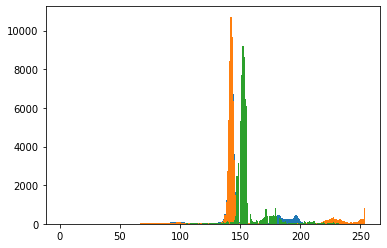

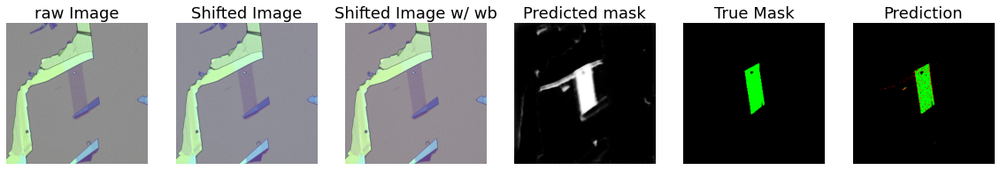

Mono_Detection rate: 0.5769230769230769 mono_falsealarm: 0.0013449076904267026


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Bi_Detection rate: 0.0 Bi_falsealarm: 0.0063934326171875
Predict bi number: 0 ground truth bi number: 0
Predict mono number: 1 ground truth mono number: 1


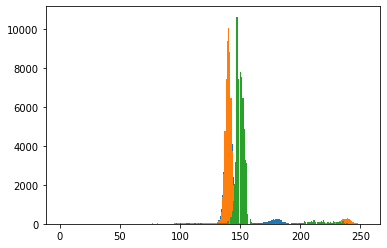

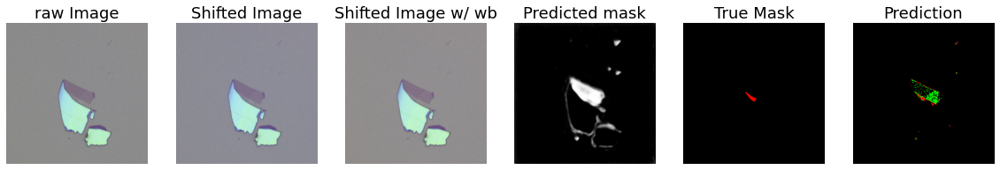

Mono_Detection rate: 0.7816091954022989 mono_falsealarm: 0.005179605494354382


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Bi_Detection rate: 0.0 Bi_falsealarm: 0.085723876953125
Predict bi number: 0 ground truth bi number: 0
Predict mono number: 1 ground truth mono number: 1


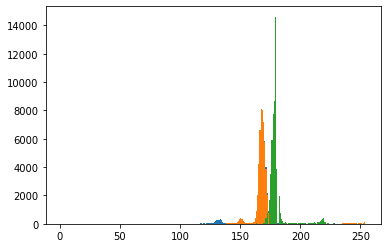

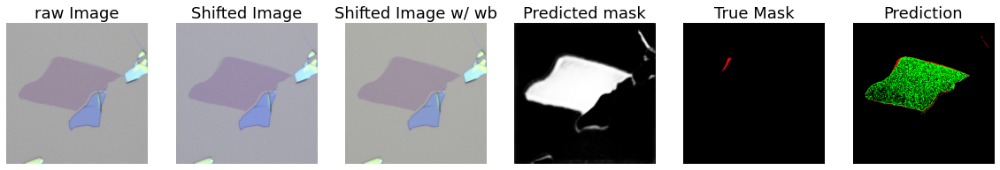

Mono_Detection rate: 0.0 mono_falsealarm: 0.0015106201171875


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Bi_Detection rate: 0.6786885245901639 Bi_falsealarm: 7.665067222639543e-05
Predict bi number: 1 ground truth bi number: 1
Predict mono number: 0 ground truth mono number: 0


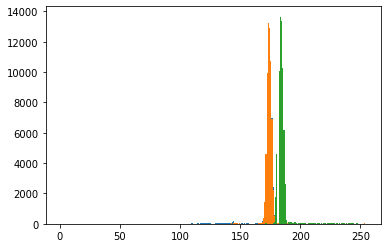

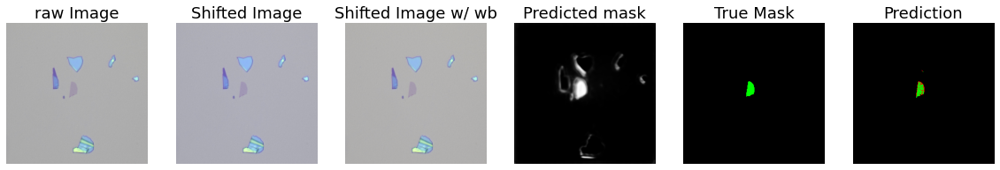

Mono_Detection rate: 0.0 mono_falsealarm: 0.0053558349609375
Bi_Detection rate: 0.7917964693665628 Bi_falsealarm: 0.0011633390976261593
Predict bi number: 2 ground truth bi number: 2
Predict mono number: 0 ground truth mono number: 0


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


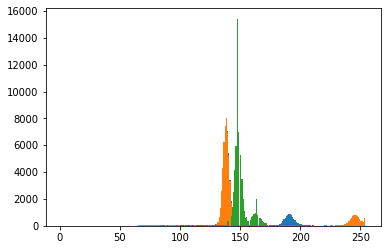

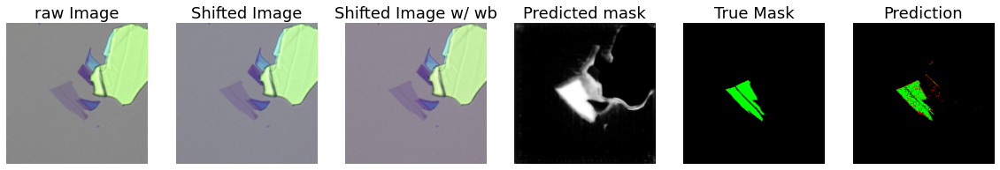

Mono_Detection rate: 0.0 mono_falsealarm: 0.0029296875


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Bi_Detection rate: 0.8403908794788274 Bi_falsealarm: 0.0002954531318031971
Predict bi number: 1 ground truth bi number: 1
Predict mono number: 0 ground truth mono number: 0


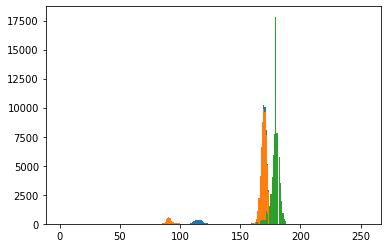

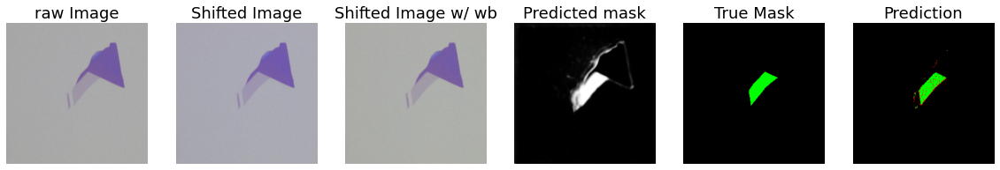

Mono_Detection rate: 0.0 mono_falsealarm: 0.002105712890625


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Bi_Detection rate: 0.9117774880486745 Bi_falsealarm: 0.00045860678421760103
Predict bi number: 1 ground truth bi number: 1
Predict mono number: 0 ground truth mono number: 0


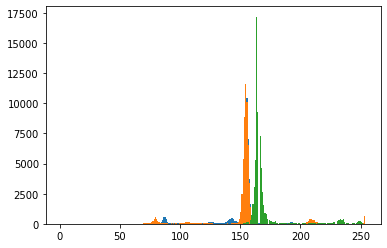

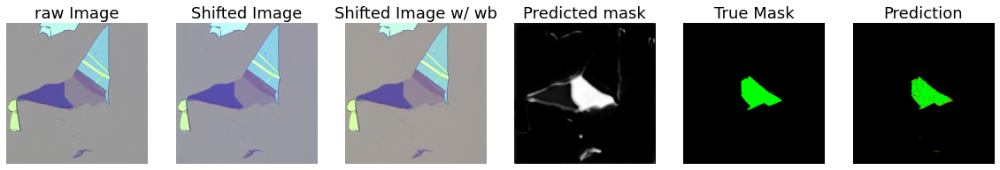

Mono_Detection rate: 0.0 mono_falsealarm: 0.00018972032062734186
Bi_Detection rate: 0.0 Bi_falsealarm: 0.0002143163309044149


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Predict bi number: 0 ground truth bi number: 1
Predict mono number: 0 ground truth mono number: 1


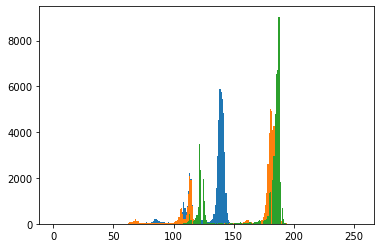

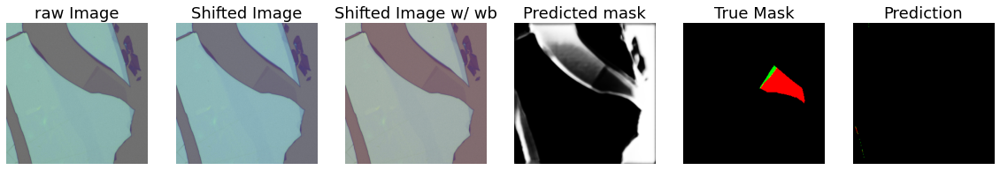

Mono_Detection rate: 0.0 mono_falsealarm: 0.0114288330078125
Bi_Detection rate: 0.7651515151515151 Bi_falsealarm: 0.005782721354989572


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Predict bi number: 5 ground truth bi number: 6
Predict mono number: 0 ground truth mono number: 0


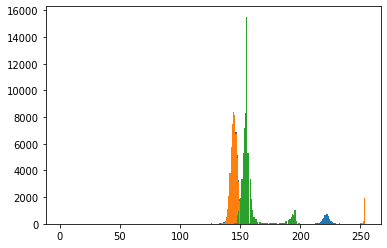

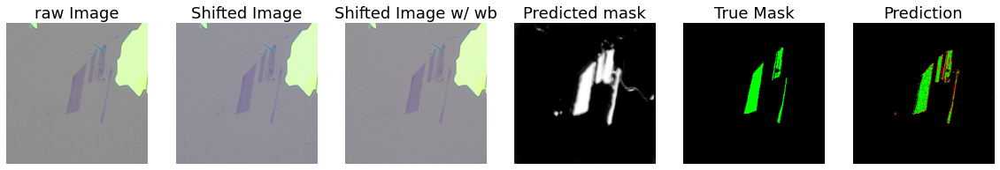

Mono_Detection rate: 0.8443509615384616 mono_falsealarm: 0.003381763527054108
Bi_Detection rate: 0.6903225806451613 Bi_falsealarm: 0.015188859449134265
Predict bi number: 1 ground truth bi number: 1
Predict mono number: 4 ground truth mono number: 4


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


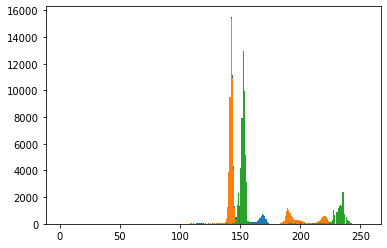

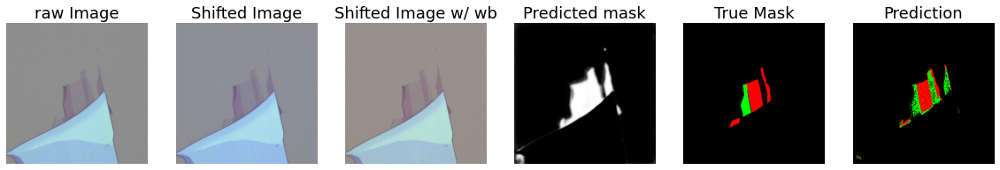

Mono_Detection rate: 0.32444733420026006 mono_falsealarm: 0.00617206787712116
Bi_Detection rate: 0.9125720094883091 Bi_falsealarm: 0.004158701411946205


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Predict bi number: 2 ground truth bi number: 2
Predict mono number: 1 ground truth mono number: 3


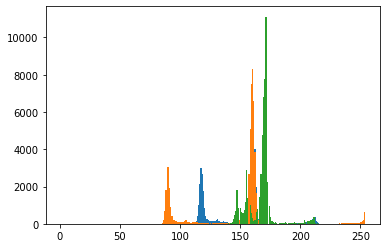

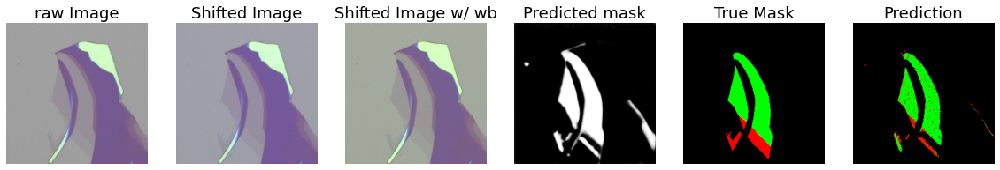

Mono_Detection rate: 0.875968992248062 mono_falsealarm: 0.0005447809980387884


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Bi_Detection rate: 0.0 Bi_falsealarm: 0.0018157958984375
Predict bi number: 0 ground truth bi number: 0
Predict mono number: 1 ground truth mono number: 1


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


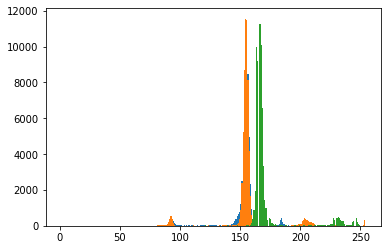

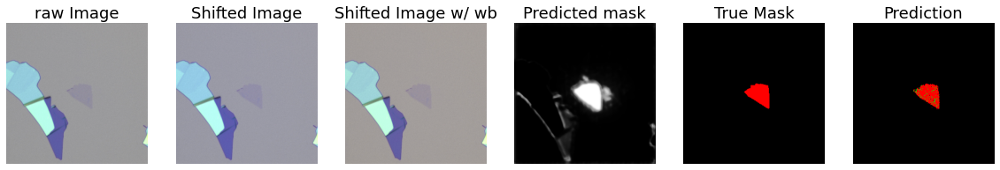

Mono_Detection rate: 0.939873417721519 mono_falsealarm: 0.0008979996284139469


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Bi_Detection rate: 0.0 Bi_falsealarm: 0.00048828125
Predict bi number: 0 ground truth bi number: 0
Predict mono number: 1 ground truth mono number: 1


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


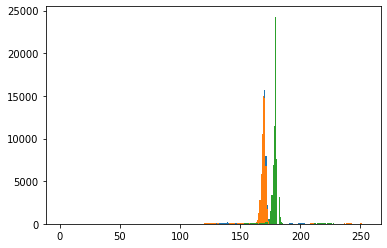

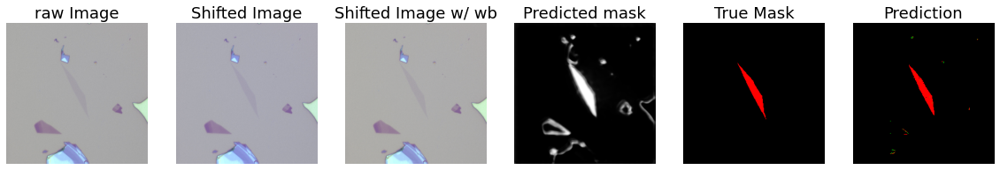

Mono_Detection rate: 0.7995930824008138 mono_falsealarm: 0.0031447028023484577
Bi_Detection rate: 0.6223404255319149 Bi_falsealarm: 0.001974046642590439


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Predict bi number: 1 ground truth bi number: 1
Predict mono number: 2 ground truth mono number: 2


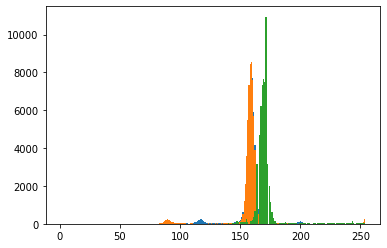

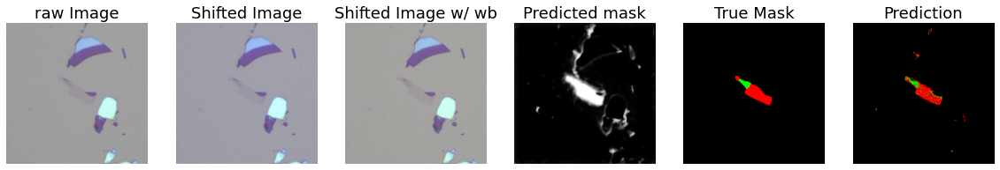

Mono_Detection rate: 0.5882352941176471 mono_falsealarm: 0.01161796586363775
Bi_Detection rate: 0.10477081384471469 Bi_falsealarm: 0.002249212775528565
Predict bi number: 0 ground truth bi number: 3
Predict mono number: 1 ground truth mono number: 1


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


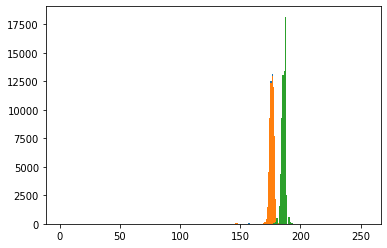

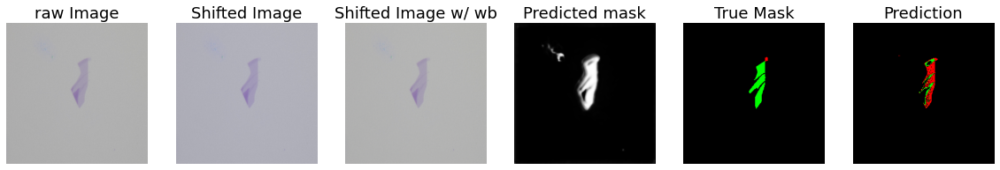

Mono_Detection rate: 0.8165938864628821 mono_falsealarm: 0.0016231031895508905


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Bi_Detection rate: 0.0 Bi_falsealarm: 0.0015411376953125
Predict bi number: 0 ground truth bi number: 0
Predict mono number: 1 ground truth mono number: 1


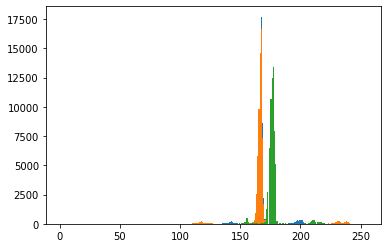

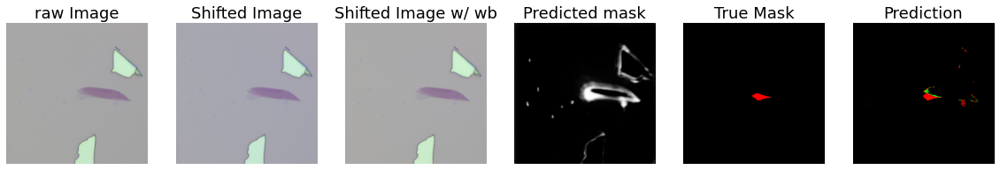

Mono_Detection rate: 0.08333333333333333 mono_falsealarm: 0.006823177433142019
Bi_Detection rate: 0.8025335320417287 Bi_falsealarm: 0.0011216001495466866


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Predict bi number: 1 ground truth bi number: 1
Predict mono number: 0 ground truth mono number: 1


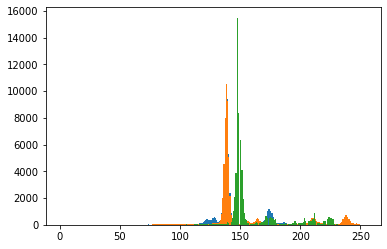

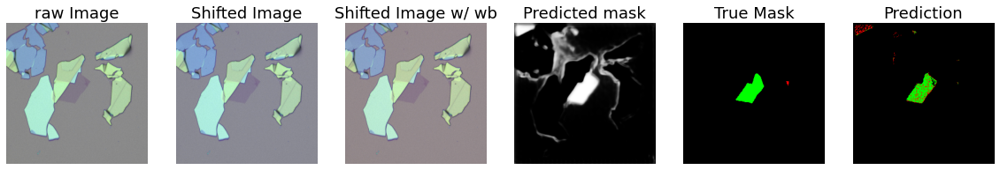

Mono_Detection rate: 0.0 mono_falsealarm: 0.0019378662109375


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Bi_Detection rate: 0.7917981072555205 Bi_falsealarm: 0.0006899829804198163
Predict bi number: 1 ground truth bi number: 1
Predict mono number: 0 ground truth mono number: 0


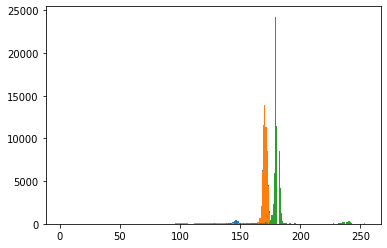

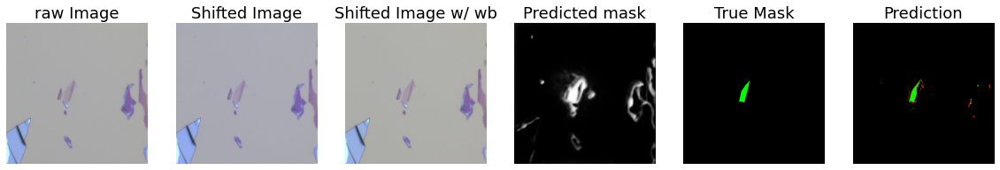

Mono_Detection rate: 0.0 mono_falsealarm: 0.0033416748046875


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Bi_Detection rate: 0.7696289905090595 Bi_falsealarm: 0.0004038709476987123
Predict bi number: 1 ground truth bi number: 1
Predict mono number: 0 ground truth mono number: 0


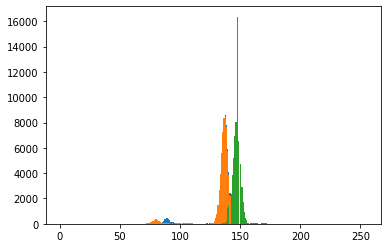

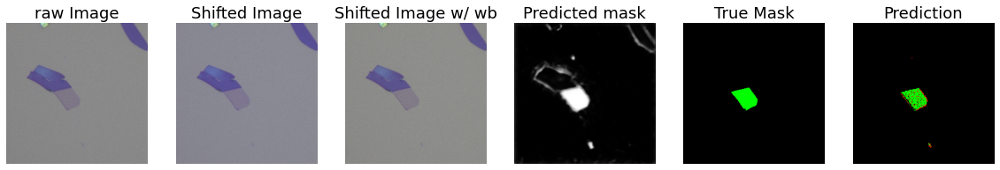

Mono_Detection rate: 0.0 mono_falsealarm: 0.084716796875
Bi_Detection rate: 0.6161780104712042 Bi_falsealarm: 0.006288224653286243
Predict bi number: 1 ground truth bi number: 1
Predict mono number: 0 ground truth mono number: 0


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


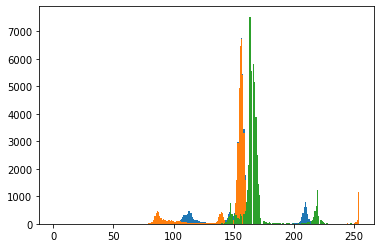

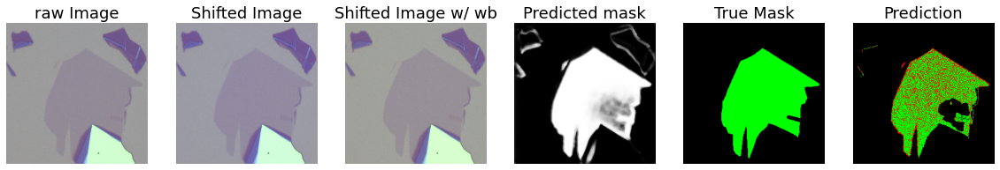

Mono_Detection rate: 0.0 mono_falsealarm: 0.005126953125


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Bi_Detection rate: 0.45604395604395603 Bi_falsealarm: 0.003136762860727729
Predict bi number: 0 ground truth bi number: 1
Predict mono number: 0 ground truth mono number: 0


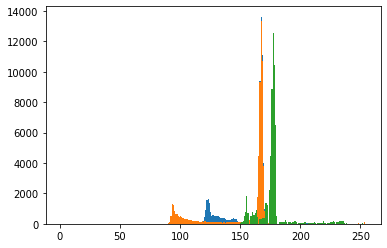

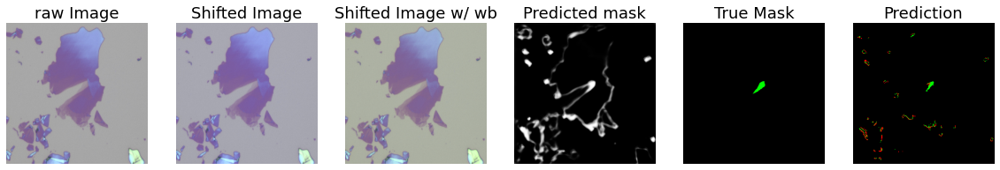

Mono_Detection rate: 0.0 mono_falsealarm: 0.0063934326171875


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Bi_Detection rate: 0.8307692307692308 Bi_falsealarm: 0.05203830703670327
Predict bi number: 1 ground truth bi number: 1
Predict mono number: 0 ground truth mono number: 0


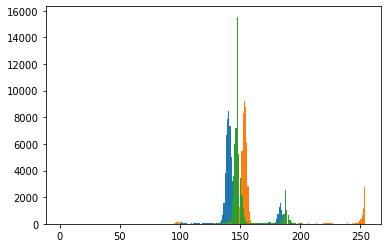

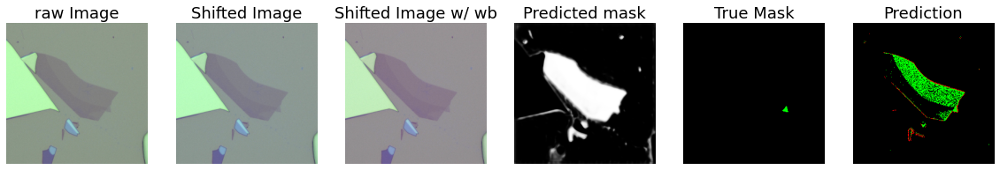

Mono_Detection rate: 0.8695255474452555 mono_falsealarm: 0.005136561142147734
Bi_Detection rate: 0.2978142076502732 Bi_falsealarm: 0.0018566825226331133


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Predict bi number: 0 ground truth bi number: 1
Predict mono number: 1 ground truth mono number: 1


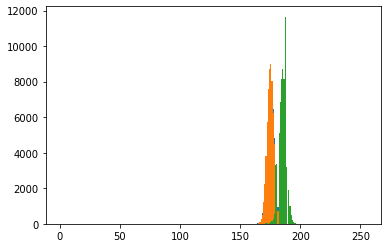

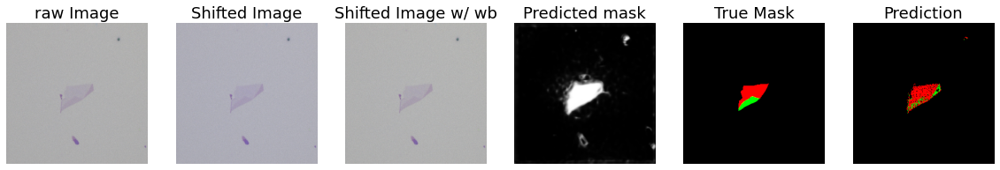

Mono_Detection rate: 0.7631160572337043 mono_falsealarm: 0.010014328192644861
Bi_Detection rate: 0.9176112800663533 Bi_falsealarm: 0.014050614512508277


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Predict bi number: 2 ground truth bi number: 2
Predict mono number: 5 ground truth mono number: 5


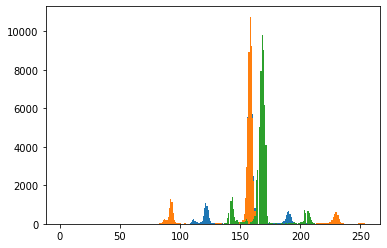

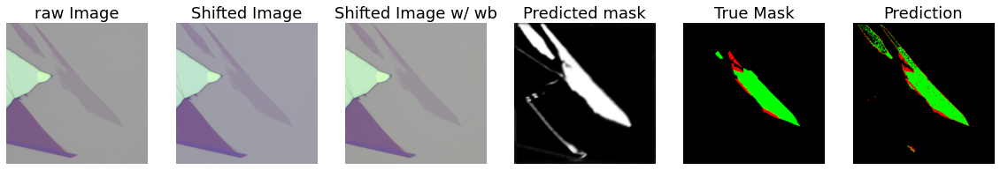

Mono_Detection rate: 0.0 mono_falsealarm: 0.0059356689453125
Bi_Detection rate: 0.8974079126875852 Bi_falsealarm: 0.0005172051526563333
Predict bi number: 2 ground truth bi number: 2
Predict mono number: 0 ground truth mono number: 0


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


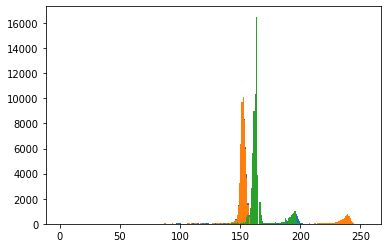

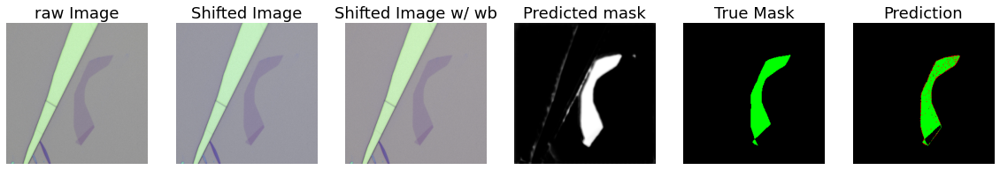

Mono_Detection rate: 0.0 mono_falsealarm: 0.0066986083984375
Bi_Detection rate: 0.6394557823129252 Bi_falsealarm: 0.005861972963776409


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Predict bi number: 2 ground truth bi number: 3
Predict mono number: 0 ground truth mono number: 0


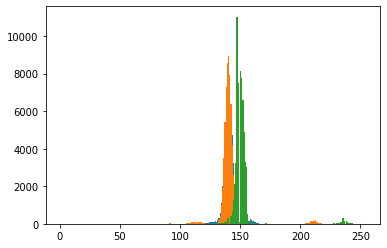

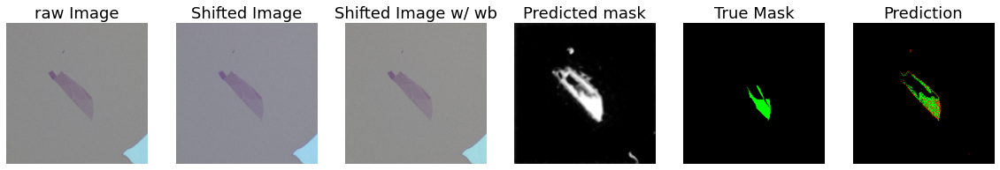

Mono_Detection rate: 0.8807658833768495 mono_falsealarm: 0.00029509062388370324


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Bi_Detection rate: 0.0 Bi_falsealarm: 0.0013580322265625
Predict bi number: 0 ground truth bi number: 0
Predict mono number: 1 ground truth mono number: 1


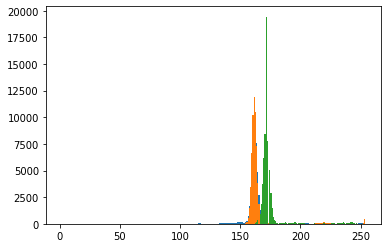

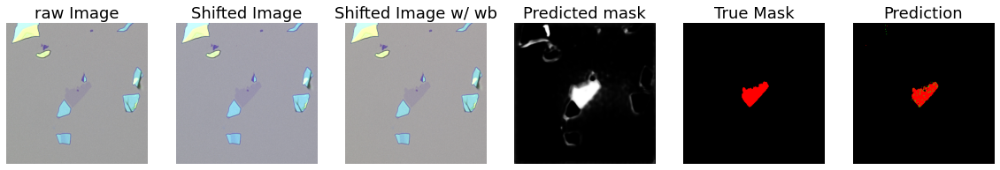

Mono_Detection rate: 0.812778603268945 mono_falsealarm: 0.011840340409786782
Bi_Detection rate: 0.6682027649769585 Bi_falsealarm: 0.05520598906903045


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Predict bi number: 2 ground truth bi number: 2
Predict mono number: 5 ground truth mono number: 5


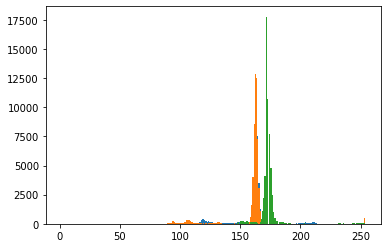

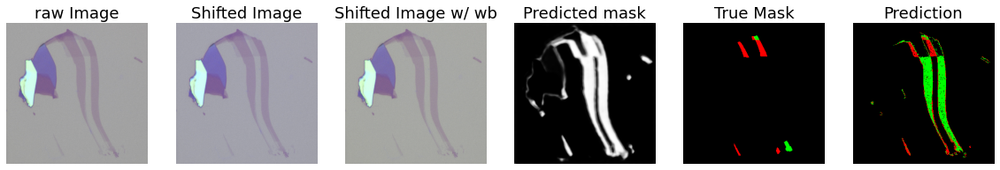

Mono_Detection rate: 0.632183908045977 mono_falsealarm: 0.006264419624440404
Bi_Detection rate: 0.5886075949367089 Bi_falsealarm: 0.00035610330092277203


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Predict bi number: 1 ground truth bi number: 1
Predict mono number: 1 ground truth mono number: 1


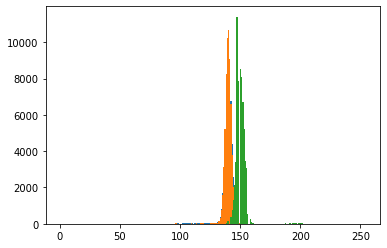

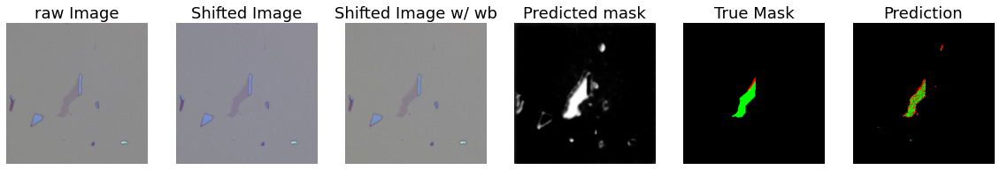

Mono_Detection rate: 0.6416666666666667 mono_falsealarm: 0.004667985655991097
Bi_Detection rate: 0.8262032085561497 Bi_falsealarm: 0.014049740739590772
Predict bi number: 1 ground truth bi number: 1
Predict mono number: 2 ground truth mono number: 2


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


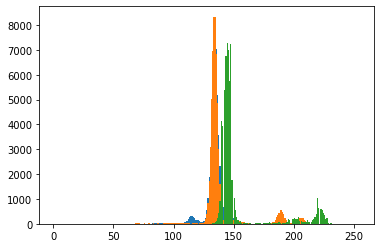

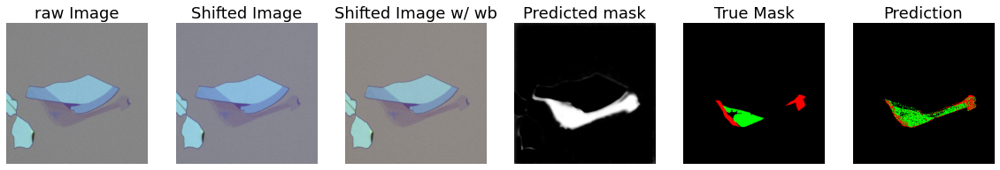

Mono_Detection rate: 0.0 mono_falsealarm: 0.00628662109375
Bi_Detection rate: 0.7740112994350282 Bi_falsealarm: 0.00012758356723653993


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Predict bi number: 2 ground truth bi number: 2
Predict mono number: 0 ground truth mono number: 0


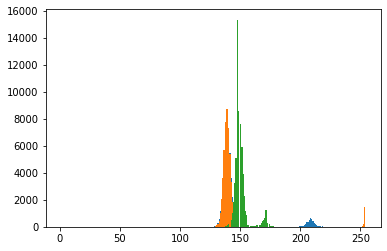

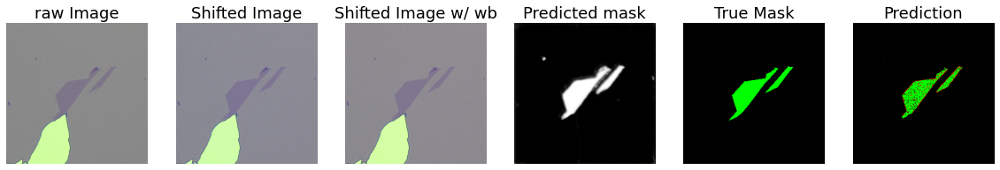

Mono_Detection rate: 0.795144157814871 mono_falsealarm: 0.0015883397178361207
Bi_Detection rate: 0.5833333333333334 Bi_falsealarm: 0.0020491803278688526
Predict bi number: 1 ground truth bi number: 1
Predict mono number: 1 ground truth mono number: 1


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


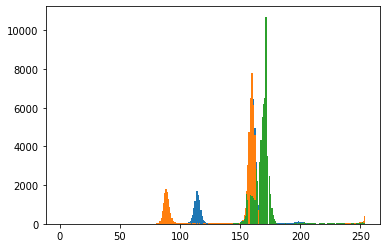

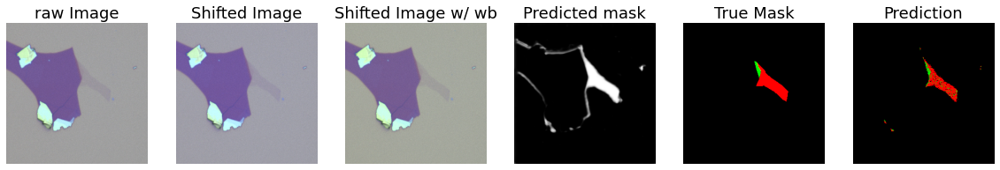

Mono_Detection rate: 0.0 mono_falsealarm: 0.0013580322265625
Bi_Detection rate: 0.7126805778491172 Bi_falsealarm: 0.000631614622648776


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Predict bi number: 2 ground truth bi number: 2
Predict mono number: 0 ground truth mono number: 0


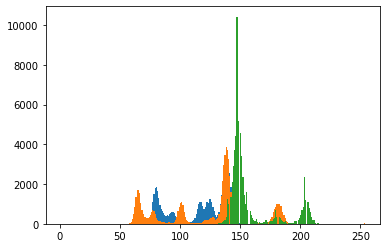

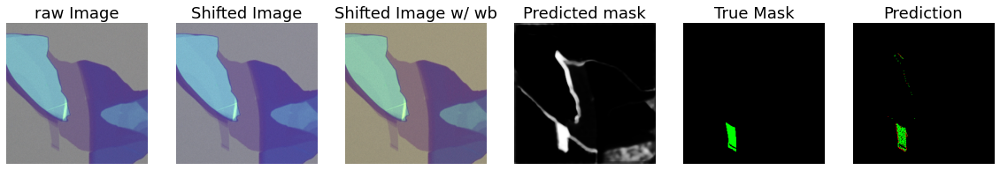

Mono_Detection rate: 0.0 mono_falsealarm: 0.001129150390625


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Bi_Detection rate: 0.8805970149253731 Bi_falsealarm: 0.00024615384615384614
Predict bi number: 1 ground truth bi number: 1
Predict mono number: 0 ground truth mono number: 0


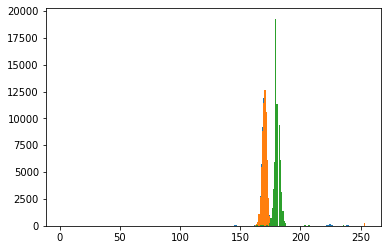

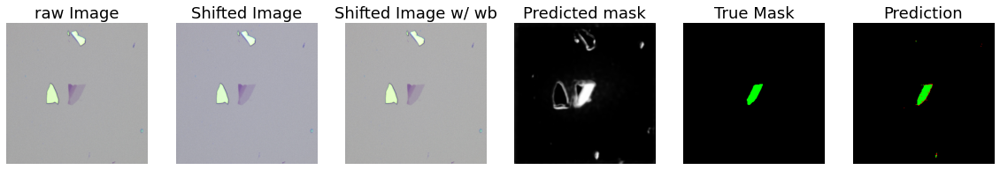

Mono_Detection rate: 0.7738478027867095 mono_falsealarm: 0.0017801030911877157
Bi_Detection rate: 0.7494692144373672 Bi_falsealarm: 0.0005994005994005994
Predict bi number: 1 ground truth bi number: 1
Predict mono number: 2 ground truth mono number: 2


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


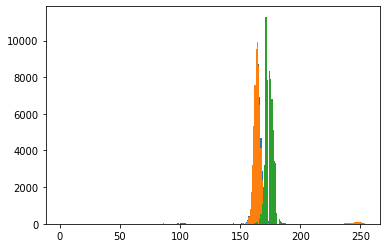

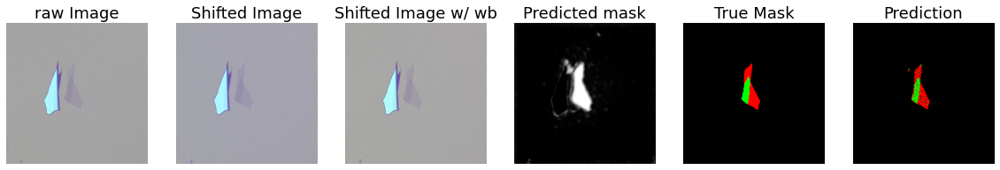

Mono_Detection rate: 0.8571428571428571 mono_falsealarm: 0.002018904285583188
Bi_Detection rate: 0.8596491228070176 Bi_falsealarm: 0.0032224071839826508


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Predict bi number: 1 ground truth bi number: 1
Predict mono number: 2 ground truth mono number: 2


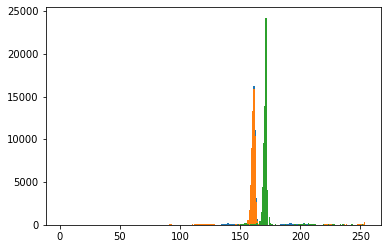

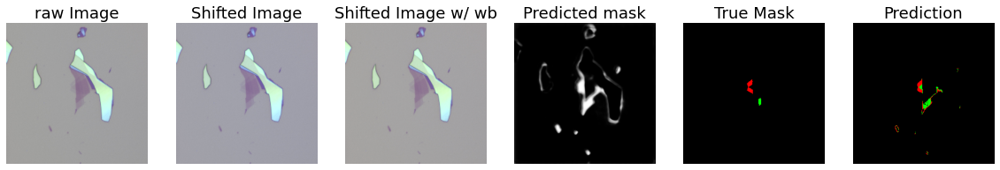

Mono_Detection rate: 0.0 mono_falsealarm: 0.0070037841796875


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Bi_Detection rate: 0.7633262260127932 Bi_falsealarm: 0.028988445165213865
Predict bi number: 1 ground truth bi number: 1
Predict mono number: 0 ground truth mono number: 0


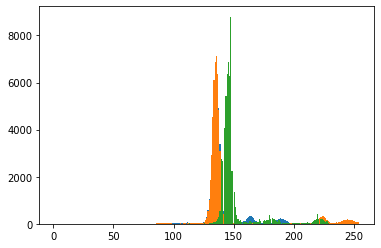

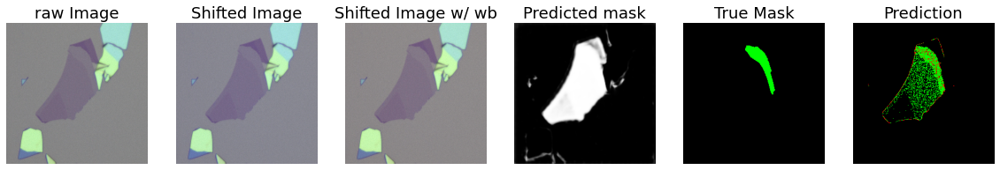

Mono_Detection rate: 0.894655704008222 mono_falsealarm: 0.0023745871992451643


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Bi_Detection rate: 0.0 Bi_falsealarm: 0.00042724609375
Predict bi number: 0 ground truth bi number: 0
Predict mono number: 1 ground truth mono number: 1


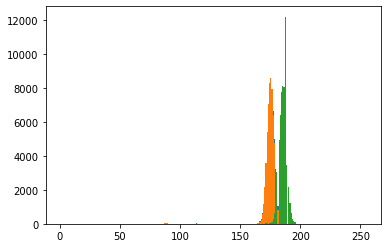

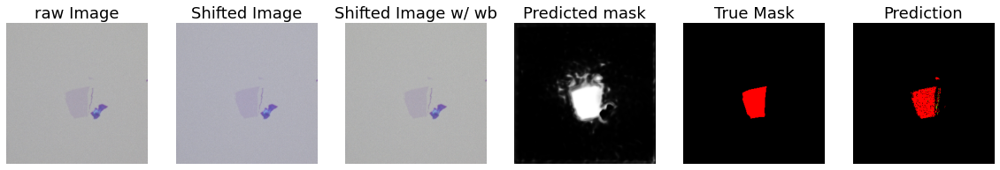

Mono_Detection rate: 0.6685714285714286 mono_falsealarm: 0.0005660868101773228
Bi_Detection rate: 0.8913043478260869 Bi_falsealarm: 0.0003531832560425048
Predict bi number: 1 ground truth bi number: 1
Predict mono number: 1 ground truth mono number: 1


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


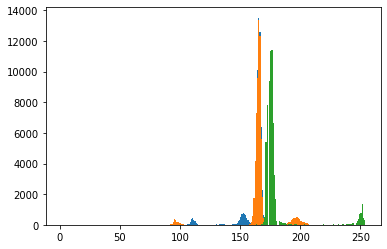

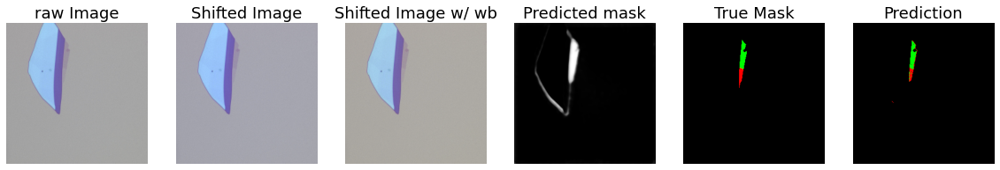

Mono_Detection rate: 0.0 mono_falsealarm: 0.016754150390625
Bi_Detection rate: 0.8575458392101551 Bi_falsealarm: 0.003555943728750117
Predict bi number: 1 ground truth bi number: 1
Predict mono number: 0 ground truth mono number: 0


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


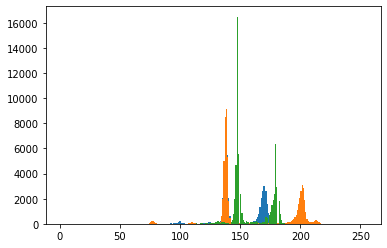

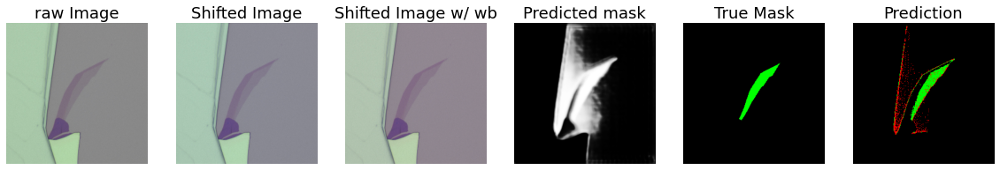

Mono_Detection rate: 0.0 mono_falsealarm: 4.5863845530568254e-05


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Bi_Detection rate: 0.0 Bi_falsealarm: 0.0001068115234375
Predict bi number: 0 ground truth bi number: 0
Predict mono number: 0 ground truth mono number: 1


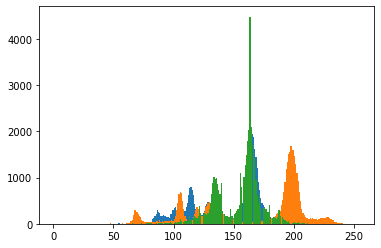

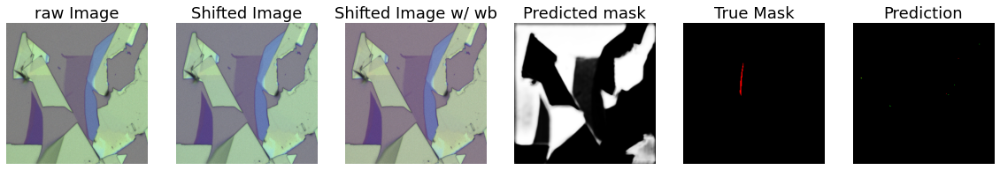

Mono_Detection rate: 0.0 mono_falsealarm: 0.001373291015625


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Bi_Detection rate: 0.9016152716593245 Bi_falsealarm: 0.0030221262817053426
Predict bi number: 1 ground truth bi number: 1
Predict mono number: 0 ground truth mono number: 0


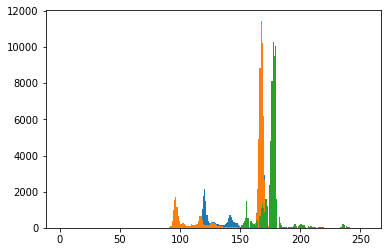

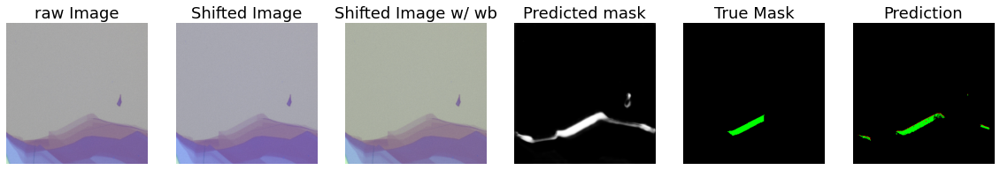

Mono_Detection rate: 0.792772444946358 mono_falsealarm: 0.005677095585352466
Bi_Detection rate: 0.6205787781350482 Bi_falsealarm: 0.0033285634293535745


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Predict bi number: 1 ground truth bi number: 1
Predict mono number: 4 ground truth mono number: 4


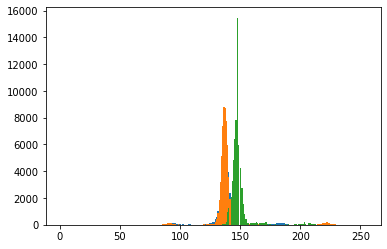

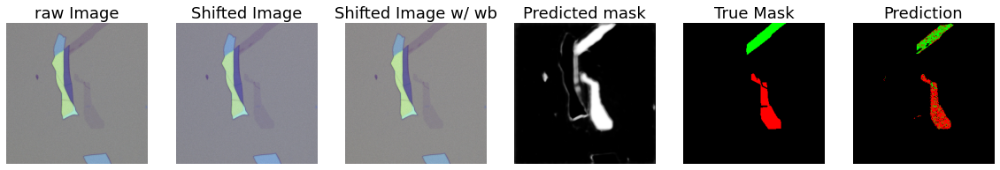

Mono_Detection rate: 0.5572139303482587 mono_falsealarm: 0.005112114486875334
Bi_Detection rate: 0.7658227848101266 Bi_falsealarm: 0.004405151580042216


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Predict bi number: 1 ground truth bi number: 1
Predict mono number: 1 ground truth mono number: 2


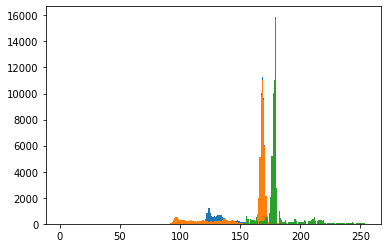

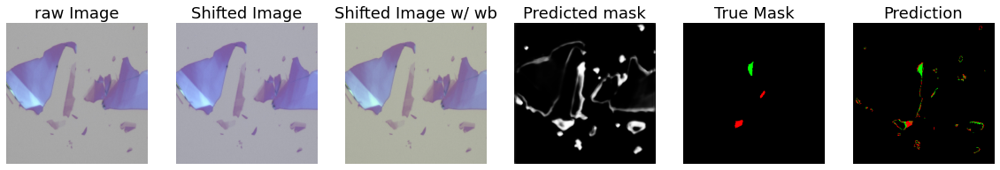

Mono_Detection rate: 0.8248847926267281 mono_falsealarm: 0.03790321312300458
Bi_Detection rate: 0.8235942668136714 Bi_falsealarm: 0.009098082903959522
Predict bi number: 1 ground truth bi number: 1
Predict mono number: 2 ground truth mono number: 2


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


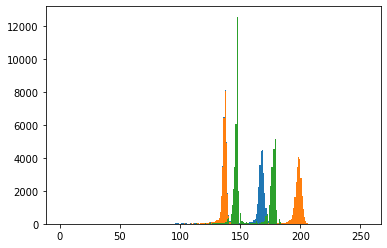

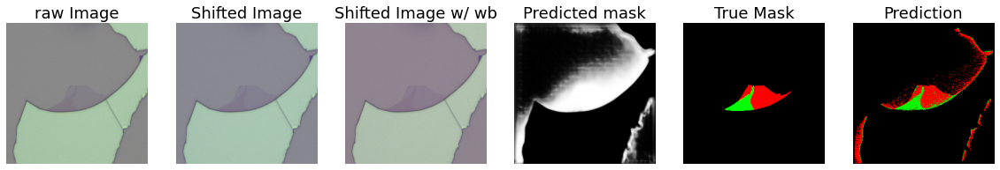

Mono_Detection rate: 0.0 mono_falsealarm: 0.0096435546875


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Bi_Detection rate: 0.5179924242424242 Bi_falsealarm: 0.002031637717121588
Predict bi number: 1 ground truth bi number: 1
Predict mono number: 0 ground truth mono number: 0


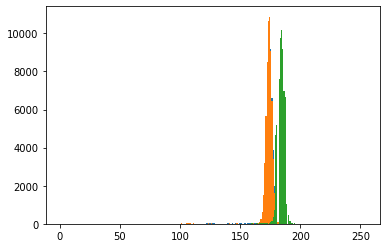

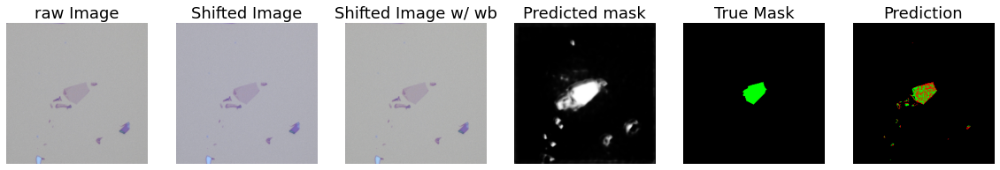

Mono_Detection rate: 0.9118217054263565 mono_falsealarm: 0.0017828351730125264


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Bi_Detection rate: 0.0 Bi_falsealarm: 0.0005340576171875
Predict bi number: 0 ground truth bi number: 0
Predict mono number: 1 ground truth mono number: 1


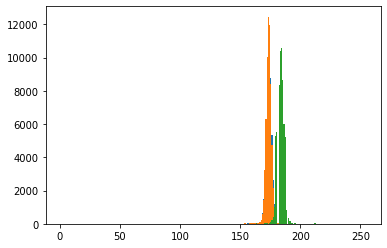

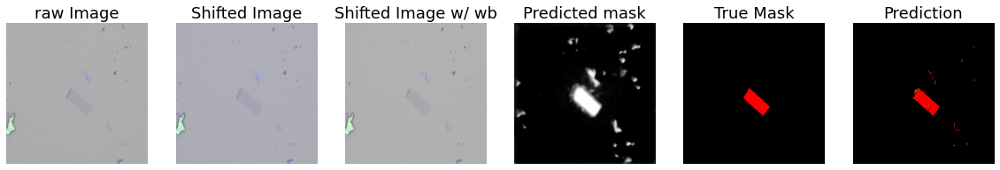

Mono_Detection rate: 0.8438661710037175 mono_falsealarm: 0.008028559608990762
Bi_Detection rate: 0.7390572390572391 Bi_falsealarm: 0.0020047243115559146


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Predict bi number: 3 ground truth bi number: 3
Predict mono number: 2 ground truth mono number: 2


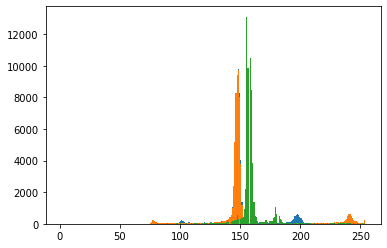

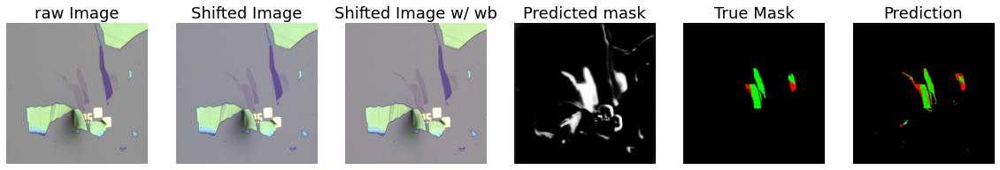

Mono_Detection rate: 0.8012221423436376 mono_falsealarm: 0.003107371641648341
Bi_Detection rate: 0.0 Bi_falsealarm: 0.0041656494140625
Predict bi number: 0 ground truth bi number: 0
Predict mono number: 2 ground truth mono number: 2


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


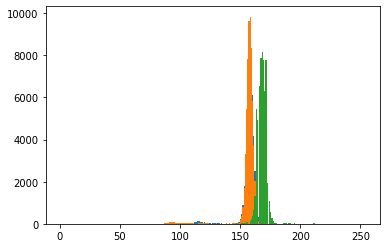

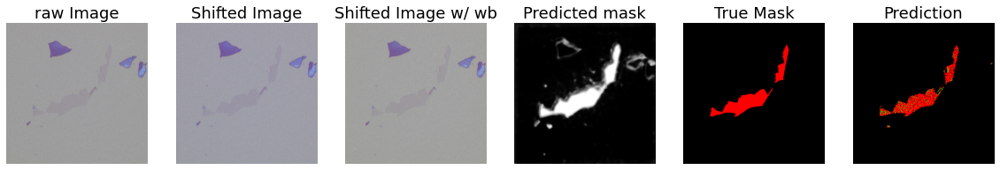

Mono_Detection rate: 0.0 mono_falsealarm: 0.004486083984375
Bi_Detection rate: 0.8709677419354839 Bi_falsealarm: 0.004860025143347745
Predict bi number: 1 ground truth bi number: 1
Predict mono number: 0 ground truth mono number: 0


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


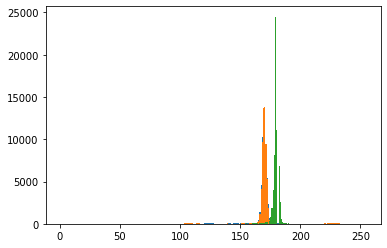

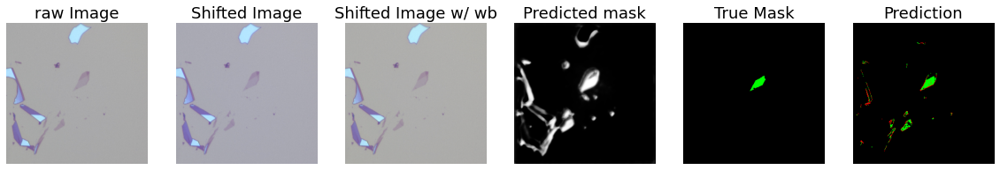

total_Mono_Detection rate: 0.6891638272079563 total_Mono_False alarm: 0.0068468869181553356
total_Bi_Detection rate: 0.6979388954959398 total_Bi_False alarm: 0.006829876338313992
total_Mono_Detection rate: 0.7249564072452938 total_Mono_False alarm: 0.006849719659140471
total_Bi_Detection rate: 0.7432539056335805 total_Bi_False alarm: 0.0068495546395854305
bi recall: 0.8356164383561644
mono recall: 0.8709677419354839


In [ ]:
import pickle 
import glob
from sklearn.externals.joblib import load

## Load a trained model
clf1 = pickle.load(open(SVM_model_path, 'rb')) 
sc_X = load(Sc_transform_path)

#change the image format(eg, .bmp, .jpg, .png, etc.)
# for filename in glob.iglob(folder + '**/*.bmp',recursive = True):
#   new_plot=plt.imread(filename)
bi_number = 0
mono_number = 0

Real_bi_number = 0
Real_mono_number = 0

m_FA=[]
m_DR=[]
b_FA=[]
b_DR=[]
m_TP = 0
m_gTp  = 0
m_FP = 0
m_gTB  = 0
b_TP = 0
b_gTp  = 0
b_FP = 0
b_gTB  = 0

b_recall_gbg = 0
m_recall_gbg = 0

Tot_m_num = 0
Tot_b_num = 0

for f in range(57):

  raw = cv2.resize(dataset_val.load_image(f),
                         dsize=default_input_size[:2],
                         interpolation=cv2.INTER_CUBIC)/255
  #blue
  shift_blue = np.zeros((256,256,3))
  shift_blue[:,:,2] = 10/255
  shift_blue = shift_blue + raw

  shift_blue1 = np.zeros((256,256,3))
  shift_blue1[:,:,2] = 10/255
  shift_blue1 = shift_blue1 + raw
  

  r = np.mean(shift_blue[:,:,0])
  g = np.mean(shift_blue[:,:,1])
  b = np.mean(shift_blue[:,:,2])

  total = r+g+b
  KB = (total)/(3*b)
  KG = (total)/(3*g)
  KR = (total)/(3*r)
  shift_blue[:,:,0] = shift_blue[:,:,0]*KR
  shift_blue[:,:,1] = shift_blue[:,:,1]*KG
  shift_blue[:,:,2] = shift_blue[:,:,2]*KB 

  pred_mask = model_attached.predict(np.expand_dims(shift_blue, 0)).squeeze()
  
  #bg = (1-(1 + np.sign(pred_mask[:,:,None]- 0.84))/2)*raw # unlock for UNet w/o wb, and new dataset w wb 
  #bg = (1-(1 + np.sign(pred_mask[:,:,None]- 0.84))/2)*raw1 # unlock for UNet w/o wb, and new dataset w/o wb 
  #bg = (1-(1 + np.sign(pred_mask[:,:,None]- 0.75))/2)*raw # unlock for UNet w wb, and new dataset w wb 
  #bg = (1-(1 + np.sign(pred_mask[:,:,None]- 0.75))/2)*raw1 # unlock for UNet w wb, and new dataset w/o wb 
  bg = (1-(1 + np.sign(pred_mask[:,:,None]- 0.75))/2)*shift_blue1 # for instagram

  y, x, _ = plt.hist((bg[:,:,0]*255).ravel(), bins=range(1,255))
  Red_medium=int(np.mean(x[np.where(y == y.max())]))
  y, x, _ = plt.hist((bg[:,:,1]*255).ravel(), bins=range(1,255))
  Green_medium=int(np.mean(x[np.where(y == y.max())]))
  y, x, _ = plt.hist((bg[:,:,2]*255).ravel(), bins=range(1,255))
  Blue_medium=int(np.mean(x[np.where(y == y.max())]))
  average_bg_color = (Red_medium+Green_medium+Blue_medium)/3
  
  #graphene_pred =  raw * (1 + np.sign(pred_mask[:,:,None]- 0.84))/2 # unlock for UNet w/o wb, and new dataset w wb
  #graphene_pred =  raw1 * (1 + np.sign(pred_mask[:,:,None]- 0.84))/2 # unlock for UNet w/o wb, and new dataset w/o wb 
  #graphene_pred =  raw * (1 + np.sign(pred_mask[:,:,None]- 0.75))/2 # unlock for UNet w wb, and new dataset w wb
  graphene_pred =  shift_blue1 * (1 + np.sign(pred_mask[:,:,None]- 0.75))/2 # unlock for UNet w wb, and new dataset w/o wb
  red = graphene_pred[:,:,0]
  green = graphene_pred[:,:,1]
  blue = graphene_pred[:,:,2]
  red=red.flatten()
  green = green.flatten()
  blue=blue.flatten()
  for j in range(len(red)):
    k = j % 256 
    i = j // 256
    if red[j]+green[j]+blue[j] == 0:
      graphene_pred[i,k,:] = 0
      graphene_pred[i,k,2] = 255  
    else:
      #x = np.array([red[j],green[j],blue[j], average_bg_color]) # unlock for 4 features 
      average = np.mean([red[j],green[j],blue[j]]) # unlock for 2 feature
      x = np.array([average, average_bg_color]) # unlock for 2 feature
      x = np.expand_dims(x,0)
      x = sc_X.transform(x) # Perform mean and standard deviation on the x value
      y = clf1.predict(x)
      if y == 0:
        graphene_pred[i,k,:] = 0 
        graphene_pred[i,k,2] = 255   
      elif y == 1:
        graphene_pred[i,k,:] = 0
        graphene_pred[i,k,0] = 255
      elif y == 2:
        graphene_pred[i,k,:] = 0
        graphene_pred[i,k,1] = 255

  mpred = graphene_pred[:,:,0]/255
  bpred = graphene_pred[:,:,1]/255
  
  # Ground truth monolayer
  h=f
  mmask = np.clip(np.sum(dataset_val.load_mask(h)[0][:,:,[i for i in range(len(dataset_val.load_mask(h)[1])) if dataset_val.load_mask(h)[1][i]==2]],axis=-1,keepdims=True),a_min=0,a_max=1)
  mmask = cv2.resize(mmask.astype(np.float32), dsize=default_input_size[:2], interpolation=cv2.INTER_CUBIC)
  mmask[mmask != 0 ] = 1
    
    # Ground truth bilayer
  bmask = np.clip(np.sum(dataset_val.load_mask(h)[0][:,:,[i for i in range(len(dataset_val.load_mask(h)[1])) if dataset_val.load_mask(h)[1][i]==1]],axis=-1,keepdims=True),a_min=0,a_max=1)
  bmask = cv2.resize(bmask.astype(np.float32), dsize=default_input_size[:2], interpolation=cv2.INTER_CUBIC)
  bmask[bmask != 0 ] = 1

  A=recall(mmask,mpred)
  B=falsealarm(mmask,mpred)
  print("Mono_Detection rate:",A,"mono_falsealarm:",B)
  m_TP+=np.sum(mpred * mmask)
  m_gTp+=np.sum(mmask)

  m_FP += np.sum(mpred * (1-mmask))
  m_gTB += np.sum((1-mmask))
  if np.sum(mmask)==0:
    m_FA.append(B)
  else:
    m_FA.append(B)
    m_DR.append(A)
    Tot_m_num += 1
    if A > 0.5:
      m_recall_gbg += 1

  A=recall(bmask,bpred)
  B=falsealarm(bmask,bpred)
  print("Bi_Detection rate:",A,"Bi_falsealarm:",B)
  b_TP+=np.sum(bpred * bmask)
  b_gTp+=np.sum(bmask)

  b_FP += np.sum(bpred * (1-bmask))
  b_gTB += np.sum((1-bmask))
  if np.sum(bmask)==0:
    b_FA.append(B)
  else:
    b_FA.append(B)
    b_DR.append(A)
    Tot_b_num += 1
    if A > 0.5:
      b_recall_gbg += 1
  gt_mask = dataset_val.load_mask(h)
  image_bi_number =0
  image_mono_number = 0

  image_real_bi_number = 0
  image_real_mono_number = 0

  for z in range(len(gt_mask[1])):
    mask_graphene = np.clip(np.sum(gt_mask[0][:,:,[z]], axis = -1, keepdims = True), a_min = 0, a_max = 1)
    #mask_impurity = np.clip(np.sum(gt_mask[0][:,:,[i for i in range(len(gt_mask[1])) if gt_mask[1][i] ==1]], axis = -1, keepdims = True), a_min = 0, a_max = 1)
            
    mask_graphene = cv2.resize(mask_graphene.astype(np.float32), dsize=default_input_size[:2], interpolation=cv2.INTER_CUBIC)
    ##mask = np.clip(np.sum(gt_mask[0][:,:,[i for i in range(len(gt_mask[1])) if gt_mask[1][i] ==1]], axis = -1, keepdims = True), a_min = 0, a_max = 1)
    mask_graphene[mask_graphene != 0] = 1

    graphene_count = graphene_pred * mask_graphene[:,:,None] 

    bi_pixel = np.sum(graphene_count[:,:,1])/255
    mono_pixel = np.sum(graphene_count[:,:,0])/255
    bg_pixel = np.sum(graphene_count[:,:,2])/255
    
    #background_pixel = np.sum(defect_count[:,:,3])
    if bi_pixel == np.max([bi_pixel,mono_pixel,bg_pixel]) and gt_mask[1][z] ==1:
      bi_number+=1
      image_bi_number+=1
    if mono_pixel == np.max([bi_pixel,mono_pixel,bg_pixel]) and gt_mask[1][z] ==2:
      mono_number+=1
      image_mono_number+=1
    #if cluster_pixel == np.max([bi_pixel,mono_pixel,bg_pixel]) and gt_mask[1][z] ==3:
      #cluster_number+=1
      #image_cluster_number +=1 
    if gt_mask[1][z] ==1:
      Real_bi_number+=1
      image_real_bi_number += 1
    if gt_mask[1][z] ==2:
      Real_mono_number+=1
      image_real_mono_number+=1
    #if gt_mask[1][z] ==3:
      #Real_cluster_number+=1
      #image_real_cluster_number+=1
  
  

  print('Predict bi number:',image_bi_number,'ground truth bi number:',image_real_bi_number)
  print('Predict mono number:',image_mono_number,'ground truth mono number:',image_real_mono_number)
  #print('Predict cluster number:',image_cluster_number,'ground truth cluster number:',image_real_cluster_number)
  zero = np.zeros((256,256))
  mask = np.stack([mmask,bmask,zero],axis=2)
  graphene_pred[:,:,2]=0
  
  fig, ax = plt.subplots(1, 6, figsize=(20,120))
  [axi.set_axis_off() for axi in ax.ravel()]
  ax[0].imshow(raw)
  ax[0].set_title('raw Image', fontsize=18)
  ax[1].imshow(shift_blue1)
  ax[1].set_title('Shifted Image', fontsize=18)
  ax[2].imshow(shift_blue)
  ax[2].set_title('Shifted Image w/ wb', fontsize=18)
  ax[3].imshow(pred_mask, cmap = 'gray')
  ax[3].set_title('Predicted mask', fontsize=18)
  ax[4].imshow(mask)
  ax[4].set_title('True Mask',fontsize=18)
  ax[5].imshow(graphene_pred)
  ax[5].set_title('Prediction',fontsize=18)
  plt.show()

print("total_Mono_Detection rate:",np.mean(m_DR),"total_Mono_False alarm:",np.mean(m_FA))
print("total_Bi_Detection rate:",np.mean(b_DR),"total_Bi_False alarm:",np.mean(b_FA))

print("total_Mono_Detection rate:",m_TP/m_gTp,"total_Mono_False alarm:",m_FP/m_gTB)
print("total_Bi_Detection rate:",b_TP/b_gTp,"total_Bi_False alarm:",b_FP/b_gTB)
      
print("bi recall:",bi_number/Real_bi_number)
print("mono recall:",mono_number/Real_mono_number)

## Plot the images

# Shift 15

In [ ]:
import pickle 
import glob
from sklearn.externals.joblib import load

## Load a trained model
clf1 = pickle.load(open(SVM_model_path, 'rb')) 
sc_X = load(Sc_transform_path)

#change the image format(eg, .bmp, .jpg, .png, etc.)
# for filename in glob.iglob(folder + '**/*.bmp',recursive = True):
#   new_plot=plt.imread(filename)
bi_number = 0
mono_number = 0

Real_bi_number = 0
Real_mono_number = 0

m_FA=[]
m_DR=[]
b_FA=[]
b_DR=[]
m_TP = 0
m_gTp  = 0
m_FP = 0
m_gTB  = 0
b_TP = 0
b_gTp  = 0
b_FP = 0
b_gTB  = 0

b_recall_gbg = 0
m_recall_gbg = 0

Tot_m_num = 0
Tot_b_num = 0

for f in range(57):

  raw = cv2.resize(dataset_val.load_image(f),
                         dsize=default_input_size[:2],
                         interpolation=cv2.INTER_CUBIC)/255
  #blue
  shift_blue = np.zeros((256,256,3))
  shift_blue[:,:,2] = 15/255
  shift_blue = shift_blue + raw

  shift_blue1 = np.zeros((256,256,3))
  shift_blue1[:,:,2] = 15/255
  shift_blue1 = shift_blue1 + raw
  

  r = np.mean(shift_blue[:,:,0])
  g = np.mean(shift_blue[:,:,1])
  b = np.mean(shift_blue[:,:,2])

  total = r+g+b
  KB = (total)/(3*b)
  KG = (total)/(3*g)
  KR = (total)/(3*r)
  shift_blue[:,:,0] = shift_blue[:,:,0]*KR
  shift_blue[:,:,1] = shift_blue[:,:,1]*KG
  shift_blue[:,:,2] = shift_blue[:,:,2]*KB 

  pred_mask = model_attached.predict(np.expand_dims(shift_blue, 0)).squeeze()
  
  #bg = (1-(1 + np.sign(pred_mask[:,:,None]- 0.84))/2)*raw # unlock for UNet w/o wb, and new dataset w wb 
  #bg = (1-(1 + np.sign(pred_mask[:,:,None]- 0.84))/2)*raw1 # unlock for UNet w/o wb, and new dataset w/o wb 
  #bg = (1-(1 + np.sign(pred_mask[:,:,None]- 0.75))/2)*raw # unlock for UNet w wb, and new dataset w wb 
  #bg = (1-(1 + np.sign(pred_mask[:,:,None]- 0.75))/2)*raw1 # unlock for UNet w wb, and new dataset w/o wb 
  bg = (1-(1 + np.sign(pred_mask[:,:,None]- 0.75))/2)*shift_blue1 # for instagram

  y, x, _ = plt.hist((bg[:,:,0]*255).ravel(), bins=range(1,255))
  Red_medium=int(np.mean(x[np.where(y == y.max())]))
  y, x, _ = plt.hist((bg[:,:,1]*255).ravel(), bins=range(1,255))
  Green_medium=int(np.mean(x[np.where(y == y.max())]))
  y, x, _ = plt.hist((bg[:,:,2]*255).ravel(), bins=range(1,255))
  Blue_medium=int(np.mean(x[np.where(y == y.max())]))
  average_bg_color = (Red_medium+Green_medium+Blue_medium)/3
  
  #graphene_pred =  raw * (1 + np.sign(pred_mask[:,:,None]- 0.84))/2 # unlock for UNet w/o wb, and new dataset w wb
  #graphene_pred =  raw1 * (1 + np.sign(pred_mask[:,:,None]- 0.84))/2 # unlock for UNet w/o wb, and new dataset w/o wb 
  #graphene_pred =  raw * (1 + np.sign(pred_mask[:,:,None]- 0.75))/2 # unlock for UNet w wb, and new dataset w wb
  graphene_pred =  shift_blue1 * (1 + np.sign(pred_mask[:,:,None]- 0.75))/2 # unlock for UNet w wb, and new dataset w/o wb
  red = graphene_pred[:,:,0]
  green = graphene_pred[:,:,1]
  blue = graphene_pred[:,:,2]
  red=red.flatten()
  green = green.flatten()
  blue=blue.flatten()
  for j in range(len(red)):
    k = j % 256 
    i = j // 256
    if red[j]+green[j]+blue[j] == 0:
      graphene_pred[i,k,:] = 0
      graphene_pred[i,k,2] = 255  
    else:
      #x = np.array([red[j],green[j],blue[j], average_bg_color]) # unlock for 4 features 
      average = np.mean([red[j],green[j],blue[j]]) # unlock for 2 feature
      x = np.array([average, average_bg_color]) # unlock for 2 feature
      x = np.expand_dims(x,0)
      x = sc_X.transform(x) # Perform mean and standard deviation on the x value
      y = clf1.predict(x)
      if y == 0:
        graphene_pred[i,k,:] = 0 
        graphene_pred[i,k,2] = 255   
      elif y == 1:
        graphene_pred[i,k,:] = 0
        graphene_pred[i,k,0] = 255
      elif y == 2:
        graphene_pred[i,k,:] = 0
        graphene_pred[i,k,1] = 255

  mpred = graphene_pred[:,:,0]/255
  bpred = graphene_pred[:,:,1]/255
  
  # Ground truth monolayer
  h=f
  mmask = np.clip(np.sum(dataset_val.load_mask(h)[0][:,:,[i for i in range(len(dataset_val.load_mask(h)[1])) if dataset_val.load_mask(h)[1][i]==2]],axis=-1,keepdims=True),a_min=0,a_max=1)
  mmask = cv2.resize(mmask.astype(np.float32), dsize=default_input_size[:2], interpolation=cv2.INTER_CUBIC)
  mmask[mmask != 0 ] = 1
    
    # Ground truth bilayer
  bmask = np.clip(np.sum(dataset_val.load_mask(h)[0][:,:,[i for i in range(len(dataset_val.load_mask(h)[1])) if dataset_val.load_mask(h)[1][i]==1]],axis=-1,keepdims=True),a_min=0,a_max=1)
  bmask = cv2.resize(bmask.astype(np.float32), dsize=default_input_size[:2], interpolation=cv2.INTER_CUBIC)
  bmask[bmask != 0 ] = 1

  A=recall(mmask,mpred)
  B=falsealarm(mmask,mpred)
  print("Mono_Detection rate:",A,"mono_falsealarm:",B)
  m_TP+=np.sum(mpred * mmask)
  m_gTp+=np.sum(mmask)

  m_FP += np.sum(mpred * (1-mmask))
  m_gTB += np.sum((1-mmask))
  if np.sum(mmask)==0:
    m_FA.append(B)
  else:
    m_FA.append(B)
    m_DR.append(A)
    Tot_m_num += 1
    if A > 0.5:
      m_recall_gbg += 1

  A=recall(bmask,bpred)
  B=falsealarm(bmask,bpred)
  print("Bi_Detection rate:",A,"Bi_falsealarm:",B)
  b_TP+=np.sum(bpred * bmask)
  b_gTp+=np.sum(bmask)

  b_FP += np.sum(bpred * (1-bmask))
  b_gTB += np.sum((1-bmask))
  if np.sum(bmask)==0:
    b_FA.append(B)
  else:
    b_FA.append(B)
    b_DR.append(A)
    Tot_b_num += 1
    if A > 0.5:
      b_recall_gbg += 1
  gt_mask = dataset_val.load_mask(h)
  image_bi_number =0
  image_mono_number = 0

  image_real_bi_number = 0
  image_real_mono_number = 0

  for z in range(len(gt_mask[1])):
    mask_graphene = np.clip(np.sum(gt_mask[0][:,:,[z]], axis = -1, keepdims = True), a_min = 0, a_max = 1)
    #mask_impurity = np.clip(np.sum(gt_mask[0][:,:,[i for i in range(len(gt_mask[1])) if gt_mask[1][i] ==1]], axis = -1, keepdims = True), a_min = 0, a_max = 1)
            
    mask_graphene = cv2.resize(mask_graphene.astype(np.float32), dsize=default_input_size[:2], interpolation=cv2.INTER_CUBIC)
    ##mask = np.clip(np.sum(gt_mask[0][:,:,[i for i in range(len(gt_mask[1])) if gt_mask[1][i] ==1]], axis = -1, keepdims = True), a_min = 0, a_max = 1)
    mask_graphene[mask_graphene != 0] = 1

    graphene_count = graphene_pred * mask_graphene[:,:,None] 

    bi_pixel = np.sum(graphene_count[:,:,1])/255
    mono_pixel = np.sum(graphene_count[:,:,0])/255
    bg_pixel = np.sum(graphene_count[:,:,2])/255
    
    #background_pixel = np.sum(defect_count[:,:,3])
    if bi_pixel == np.max([bi_pixel,mono_pixel,bg_pixel]) and gt_mask[1][z] ==1:
      bi_number+=1
      image_bi_number+=1
    if mono_pixel == np.max([bi_pixel,mono_pixel,bg_pixel]) and gt_mask[1][z] ==2:
      mono_number+=1
      image_mono_number+=1
    #if cluster_pixel == np.max([bi_pixel,mono_pixel,bg_pixel]) and gt_mask[1][z] ==3:
      #cluster_number+=1
      #image_cluster_number +=1 
    if gt_mask[1][z] ==1:
      Real_bi_number+=1
      image_real_bi_number += 1
    if gt_mask[1][z] ==2:
      Real_mono_number+=1
      image_real_mono_number+=1
    #if gt_mask[1][z] ==3:
      #Real_cluster_number+=1
      #image_real_cluster_number+=1
  
  

  print('Predict bi number:',image_bi_number,'ground truth bi number:',image_real_bi_number)
  print('Predict mono number:',image_mono_number,'ground truth mono number:',image_real_mono_number)
  #print('Predict cluster number:',image_cluster_number,'ground truth cluster number:',image_real_cluster_number)
  zero = np.zeros((256,256))
  mask = np.stack([mmask,bmask,zero],axis=2)
  graphene_pred[:,:,2]=0
  
  fig, ax = plt.subplots(1, 6, figsize=(20,120))
  [axi.set_axis_off() for axi in ax.ravel()]
  ax[0].imshow(raw)
  ax[0].set_title('raw Image', fontsize=18)
  ax[1].imshow(shift_blue1)
  ax[1].set_title('Shifted Image', fontsize=18)
  ax[2].imshow(shift_blue)
  ax[2].set_title('Shifted Image w/ wb', fontsize=18)
  ax[3].imshow(pred_mask, cmap = 'gray')
  ax[3].set_title('Predicted mask', fontsize=18)
  ax[4].imshow(mask)
  ax[4].set_title('True Mask',fontsize=18)
  ax[5].imshow(graphene_pred)
  ax[5].set_title('Prediction',fontsize=18)
  plt.show()

print("total_Mono_Detection rate:",np.mean(m_DR),"total_Mono_False alarm:",np.mean(m_FA))
print("total_Bi_Detection rate:",np.mean(b_DR),"total_Bi_False alarm:",np.mean(b_FA))

print("total_Mono_Detection rate:",m_TP/m_gTp,"total_Mono_False alarm:",m_FP/m_gTB)
print("total_Bi_Detection rate:",b_TP/b_gTp,"total_Bi_False alarm:",b_FP/b_gTB)
      
print("bi recall:",bi_number/Real_bi_number)
print("mono recall:",mono_number/Real_mono_number)

## Plot the images

# Shift 25

In [ ]:
import pickle 
import glob
from sklearn.externals.joblib import load

## Load a trained model
clf1 = pickle.load(open(SVM_model_path, 'rb')) 
sc_X = load(Sc_transform_path)

#change the image format(eg, .bmp, .jpg, .png, etc.)
# for filename in glob.iglob(folder + '**/*.bmp',recursive = True):
#   new_plot=plt.imread(filename)
bi_number = 0
mono_number = 0

Real_bi_number = 0
Real_mono_number = 0

m_FA=[]
m_DR=[]
b_FA=[]
b_DR=[]
m_TP = 0
m_gTp  = 0
m_FP = 0
m_gTB  = 0
b_TP = 0
b_gTp  = 0
b_FP = 0
b_gTB  = 0

b_recall_gbg = 0
m_recall_gbg = 0

Tot_m_num = 0
Tot_b_num = 0

for f in range(57):

  raw = cv2.resize(dataset_val.load_image(f),
                         dsize=default_input_size[:2],
                         interpolation=cv2.INTER_CUBIC)/255
  #blue
  shift_blue = np.zeros((256,256,3))
  shift_blue[:,:,2] = 25/255
  shift_blue = shift_blue + raw

  shift_blue1 = np.zeros((256,256,3))
  shift_blue1[:,:,2] = 25/255
  shift_blue1 = shift_blue1 + raw
  

  r = np.mean(shift_blue[:,:,0])
  g = np.mean(shift_blue[:,:,1])
  b = np.mean(shift_blue[:,:,2])

  total = r+g+b
  KB = (total)/(3*b)
  KG = (total)/(3*g)
  KR = (total)/(3*r)
  shift_blue[:,:,0] = shift_blue[:,:,0]*KR
  shift_blue[:,:,1] = shift_blue[:,:,1]*KG
  shift_blue[:,:,2] = shift_blue[:,:,2]*KB 

  pred_mask = model_attached.predict(np.expand_dims(shift_blue, 0)).squeeze()
  
  #bg = (1-(1 + np.sign(pred_mask[:,:,None]- 0.84))/2)*raw # unlock for UNet w/o wb, and new dataset w wb 
  #bg = (1-(1 + np.sign(pred_mask[:,:,None]- 0.84))/2)*raw1 # unlock for UNet w/o wb, and new dataset w/o wb 
  #bg = (1-(1 + np.sign(pred_mask[:,:,None]- 0.75))/2)*raw # unlock for UNet w wb, and new dataset w wb 
  #bg = (1-(1 + np.sign(pred_mask[:,:,None]- 0.75))/2)*raw1 # unlock for UNet w wb, and new dataset w/o wb 
  bg = (1-(1 + np.sign(pred_mask[:,:,None]- 0.75))/2)*shift_blue1 # for instagram

  y, x, _ = plt.hist((bg[:,:,0]*255).ravel(), bins=range(1,255))
  Red_medium=int(np.mean(x[np.where(y == y.max())]))
  y, x, _ = plt.hist((bg[:,:,1]*255).ravel(), bins=range(1,255))
  Green_medium=int(np.mean(x[np.where(y == y.max())]))
  y, x, _ = plt.hist((bg[:,:,2]*255).ravel(), bins=range(1,255))
  Blue_medium=int(np.mean(x[np.where(y == y.max())]))
  average_bg_color = (Red_medium+Green_medium+Blue_medium)/3
  
  #graphene_pred =  raw * (1 + np.sign(pred_mask[:,:,None]- 0.84))/2 # unlock for UNet w/o wb, and new dataset w wb
  #graphene_pred =  raw1 * (1 + np.sign(pred_mask[:,:,None]- 0.84))/2 # unlock for UNet w/o wb, and new dataset w/o wb 
  #graphene_pred =  raw * (1 + np.sign(pred_mask[:,:,None]- 0.75))/2 # unlock for UNet w wb, and new dataset w wb
  graphene_pred =  shift_blue1 * (1 + np.sign(pred_mask[:,:,None]- 0.75))/2 # unlock for UNet w wb, and new dataset w/o wb
  red = graphene_pred[:,:,0]
  green = graphene_pred[:,:,1]
  blue = graphene_pred[:,:,2]
  red=red.flatten()
  green = green.flatten()
  blue=blue.flatten()
  for j in range(len(red)):
    k = j % 256 
    i = j // 256
    if red[j]+green[j]+blue[j] == 0:
      graphene_pred[i,k,:] = 0
      graphene_pred[i,k,2] = 255  
    else:
      #x = np.array([red[j],green[j],blue[j], average_bg_color]) # unlock for 4 features 
      average = np.mean([red[j],green[j],blue[j]]) # unlock for 2 feature
      x = np.array([average, average_bg_color]) # unlock for 2 feature
      x = np.expand_dims(x,0)
      x = sc_X.transform(x) # Perform mean and standard deviation on the x value
      y = clf1.predict(x)
      if y == 0:
        graphene_pred[i,k,:] = 0 
        graphene_pred[i,k,2] = 255   
      elif y == 1:
        graphene_pred[i,k,:] = 0
        graphene_pred[i,k,0] = 255
      elif y == 2:
        graphene_pred[i,k,:] = 0
        graphene_pred[i,k,1] = 255

  mpred = graphene_pred[:,:,0]/255
  bpred = graphene_pred[:,:,1]/255
  
  # Ground truth monolayer
  h=f
  mmask = np.clip(np.sum(dataset_val.load_mask(h)[0][:,:,[i for i in range(len(dataset_val.load_mask(h)[1])) if dataset_val.load_mask(h)[1][i]==2]],axis=-1,keepdims=True),a_min=0,a_max=1)
  mmask = cv2.resize(mmask.astype(np.float32), dsize=default_input_size[:2], interpolation=cv2.INTER_CUBIC)
  mmask[mmask != 0 ] = 1
    
    # Ground truth bilayer
  bmask = np.clip(np.sum(dataset_val.load_mask(h)[0][:,:,[i for i in range(len(dataset_val.load_mask(h)[1])) if dataset_val.load_mask(h)[1][i]==1]],axis=-1,keepdims=True),a_min=0,a_max=1)
  bmask = cv2.resize(bmask.astype(np.float32), dsize=default_input_size[:2], interpolation=cv2.INTER_CUBIC)
  bmask[bmask != 0 ] = 1

  A=recall(mmask,mpred)
  B=falsealarm(mmask,mpred)
  print("Mono_Detection rate:",A,"mono_falsealarm:",B)
  m_TP+=np.sum(mpred * mmask)
  m_gTp+=np.sum(mmask)

  m_FP += np.sum(mpred * (1-mmask))
  m_gTB += np.sum((1-mmask))
  if np.sum(mmask)==0:
    m_FA.append(B)
  else:
    m_FA.append(B)
    m_DR.append(A)
    Tot_m_num += 1
    if A > 0.5:
      m_recall_gbg += 1

  A=recall(bmask,bpred)
  B=falsealarm(bmask,bpred)
  print("Bi_Detection rate:",A,"Bi_falsealarm:",B)
  b_TP+=np.sum(bpred * bmask)
  b_gTp+=np.sum(bmask)

  b_FP += np.sum(bpred * (1-bmask))
  b_gTB += np.sum((1-bmask))
  if np.sum(bmask)==0:
    b_FA.append(B)
  else:
    b_FA.append(B)
    b_DR.append(A)
    Tot_b_num += 1
    if A > 0.5:
      b_recall_gbg += 1
  gt_mask = dataset_val.load_mask(h)
  image_bi_number =0
  image_mono_number = 0

  image_real_bi_number = 0
  image_real_mono_number = 0

  for z in range(len(gt_mask[1])):
    mask_graphene = np.clip(np.sum(gt_mask[0][:,:,[z]], axis = -1, keepdims = True), a_min = 0, a_max = 1)
    #mask_impurity = np.clip(np.sum(gt_mask[0][:,:,[i for i in range(len(gt_mask[1])) if gt_mask[1][i] ==1]], axis = -1, keepdims = True), a_min = 0, a_max = 1)
            
    mask_graphene = cv2.resize(mask_graphene.astype(np.float32), dsize=default_input_size[:2], interpolation=cv2.INTER_CUBIC)
    ##mask = np.clip(np.sum(gt_mask[0][:,:,[i for i in range(len(gt_mask[1])) if gt_mask[1][i] ==1]], axis = -1, keepdims = True), a_min = 0, a_max = 1)
    mask_graphene[mask_graphene != 0] = 1

    graphene_count = graphene_pred * mask_graphene[:,:,None] 

    bi_pixel = np.sum(graphene_count[:,:,1])/255
    mono_pixel = np.sum(graphene_count[:,:,0])/255
    bg_pixel = np.sum(graphene_count[:,:,2])/255
    
    #background_pixel = np.sum(defect_count[:,:,3])
    if bi_pixel == np.max([bi_pixel,mono_pixel,bg_pixel]) and gt_mask[1][z] ==1:
      bi_number+=1
      image_bi_number+=1
    if mono_pixel == np.max([bi_pixel,mono_pixel,bg_pixel]) and gt_mask[1][z] ==2:
      mono_number+=1
      image_mono_number+=1
    #if cluster_pixel == np.max([bi_pixel,mono_pixel,bg_pixel]) and gt_mask[1][z] ==3:
      #cluster_number+=1
      #image_cluster_number +=1 
    if gt_mask[1][z] ==1:
      Real_bi_number+=1
      image_real_bi_number += 1
    if gt_mask[1][z] ==2:
      Real_mono_number+=1
      image_real_mono_number+=1
    #if gt_mask[1][z] ==3:
      #Real_cluster_number+=1
      #image_real_cluster_number+=1
  
  

  print('Predict bi number:',image_bi_number,'ground truth bi number:',image_real_bi_number)
  print('Predict mono number:',image_mono_number,'ground truth mono number:',image_real_mono_number)
  #print('Predict cluster number:',image_cluster_number,'ground truth cluster number:',image_real_cluster_number)
  zero = np.zeros((256,256))
  mask = np.stack([mmask,bmask,zero],axis=2)
  graphene_pred[:,:,2]=0
  
  fig, ax = plt.subplots(1, 6, figsize=(20,120))
  [axi.set_axis_off() for axi in ax.ravel()]
  ax[0].imshow(raw)
  ax[0].set_title('raw Image', fontsize=18)
  ax[1].imshow(shift_blue1)
  ax[1].set_title('Shifted Image', fontsize=18)
  ax[2].imshow(shift_blue)
  ax[2].set_title('Shifted Image w/ wb', fontsize=18)
  ax[3].imshow(pred_mask, cmap = 'gray')
  ax[3].set_title('Predicted mask', fontsize=18)
  ax[4].imshow(mask)
  ax[4].set_title('True Mask',fontsize=18)
  ax[5].imshow(graphene_pred)
  ax[5].set_title('Prediction',fontsize=18)
  plt.show()

print("total_Mono_Detection rate:",np.mean(m_DR),"total_Mono_False alarm:",np.mean(m_FA))
print("total_Bi_Detection rate:",np.mean(b_DR),"total_Bi_False alarm:",np.mean(b_FA))

print("total_Mono_Detection rate:",m_TP/m_gTp,"total_Mono_False alarm:",m_FP/m_gTB)
print("total_Bi_Detection rate:",b_TP/b_gTp,"total_Bi_False alarm:",b_FP/b_gTB)
      
print("bi recall:",bi_number/Real_bi_number)
print("mono recall:",mono_number/Real_mono_number)

## Plot the images

# Shift 5


In [ ]:
import pickle 
import glob
from sklearn.externals.joblib import load

## Load a trained model
clf1 = pickle.load(open(SVM_model_path, 'rb')) 
sc_X = load(Sc_transform_path)

#change the image format(eg, .bmp, .jpg, .png, etc.)
# for filename in glob.iglob(folder + '**/*.bmp',recursive = True):
#   new_plot=plt.imread(filename)
bi_number = 0
mono_number = 0

Real_bi_number = 0
Real_mono_number = 0

m_FA=[]
m_DR=[]
b_FA=[]
b_DR=[]
m_TP = 0
m_gTp  = 0
m_FP = 0
m_gTB  = 0
b_TP = 0
b_gTp  = 0
b_FP = 0
b_gTB  = 0

b_recall_gbg = 0
m_recall_gbg = 0

Tot_m_num = 0
Tot_b_num = 0

for f in range(57):

  raw = cv2.resize(dataset_val.load_image(f),
                         dsize=default_input_size[:2],
                         interpolation=cv2.INTER_CUBIC)/255
  #blue
  shift_blue = np.zeros((256,256,3))
  shift_blue[:,:,2] = 5/255
  shift_blue = shift_blue + raw

  shift_blue1 = np.zeros((256,256,3))
  shift_blue1[:,:,2] = 5/255
  shift_blue1 = shift_blue1 + raw
  

  r = np.mean(shift_blue[:,:,0])
  g = np.mean(shift_blue[:,:,1])
  b = np.mean(shift_blue[:,:,2])

  total = r+g+b
  KB = (total)/(3*b)
  KG = (total)/(3*g)
  KR = (total)/(3*r)
  shift_blue[:,:,0] = shift_blue[:,:,0]*KR
  shift_blue[:,:,1] = shift_blue[:,:,1]*KG
  shift_blue[:,:,2] = shift_blue[:,:,2]*KB 

  pred_mask = model_attached.predict(np.expand_dims(shift_blue, 0)).squeeze()
  
  #bg = (1-(1 + np.sign(pred_mask[:,:,None]- 0.84))/2)*raw # unlock for UNet w/o wb, and new dataset w wb 
  #bg = (1-(1 + np.sign(pred_mask[:,:,None]- 0.84))/2)*raw1 # unlock for UNet w/o wb, and new dataset w/o wb 
  #bg = (1-(1 + np.sign(pred_mask[:,:,None]- 0.75))/2)*raw # unlock for UNet w wb, and new dataset w wb 
  #bg = (1-(1 + np.sign(pred_mask[:,:,None]- 0.75))/2)*raw1 # unlock for UNet w wb, and new dataset w/o wb 
  bg = (1-(1 + np.sign(pred_mask[:,:,None]- 0.75))/2)*shift_blue1 # for instagram

  y, x, _ = plt.hist((bg[:,:,0]*255).ravel(), bins=range(1,255))
  Red_medium=int(np.mean(x[np.where(y == y.max())]))
  y, x, _ = plt.hist((bg[:,:,1]*255).ravel(), bins=range(1,255))
  Green_medium=int(np.mean(x[np.where(y == y.max())]))
  y, x, _ = plt.hist((bg[:,:,2]*255).ravel(), bins=range(1,255))
  Blue_medium=int(np.mean(x[np.where(y == y.max())]))
  average_bg_color = (Red_medium+Green_medium+Blue_medium)/3
  
  #graphene_pred =  raw * (1 + np.sign(pred_mask[:,:,None]- 0.84))/2 # unlock for UNet w/o wb, and new dataset w wb
  #graphene_pred =  raw1 * (1 + np.sign(pred_mask[:,:,None]- 0.84))/2 # unlock for UNet w/o wb, and new dataset w/o wb 
  #graphene_pred =  raw * (1 + np.sign(pred_mask[:,:,None]- 0.75))/2 # unlock for UNet w wb, and new dataset w wb
  graphene_pred =  shift_blue1 * (1 + np.sign(pred_mask[:,:,None]- 0.75))/2 # unlock for UNet w wb, and new dataset w/o wb
  red = graphene_pred[:,:,0]
  green = graphene_pred[:,:,1]
  blue = graphene_pred[:,:,2]
  red=red.flatten()
  green = green.flatten()
  blue=blue.flatten()
  for j in range(len(red)):
    k = j % 256 
    i = j // 256
    if red[j]+green[j]+blue[j] == 0:
      graphene_pred[i,k,:] = 0
      graphene_pred[i,k,2] = 255  
    else:
      #x = np.array([red[j],green[j],blue[j], average_bg_color]) # unlock for 4 features 
      average = np.mean([red[j],green[j],blue[j]]) # unlock for 2 feature
      x = np.array([average, average_bg_color]) # unlock for 2 feature
      x = np.expand_dims(x,0)
      x = sc_X.transform(x) # Perform mean and standard deviation on the x value
      y = clf1.predict(x)
      if y == 0:
        graphene_pred[i,k,:] = 0 
        graphene_pred[i,k,2] = 255   
      elif y == 1:
        graphene_pred[i,k,:] = 0
        graphene_pred[i,k,0] = 255
      elif y == 2:
        graphene_pred[i,k,:] = 0
        graphene_pred[i,k,1] = 255

  mpred = graphene_pred[:,:,0]/255
  bpred = graphene_pred[:,:,1]/255
  
  # Ground truth monolayer
  h=f
  mmask = np.clip(np.sum(dataset_val.load_mask(h)[0][:,:,[i for i in range(len(dataset_val.load_mask(h)[1])) if dataset_val.load_mask(h)[1][i]==2]],axis=-1,keepdims=True),a_min=0,a_max=1)
  mmask = cv2.resize(mmask.astype(np.float32), dsize=default_input_size[:2], interpolation=cv2.INTER_CUBIC)
  mmask[mmask != 0 ] = 1
    
    # Ground truth bilayer
  bmask = np.clip(np.sum(dataset_val.load_mask(h)[0][:,:,[i for i in range(len(dataset_val.load_mask(h)[1])) if dataset_val.load_mask(h)[1][i]==1]],axis=-1,keepdims=True),a_min=0,a_max=1)
  bmask = cv2.resize(bmask.astype(np.float32), dsize=default_input_size[:2], interpolation=cv2.INTER_CUBIC)
  bmask[bmask != 0 ] = 1

  A=recall(mmask,mpred)
  B=falsealarm(mmask,mpred)
  print("Mono_Detection rate:",A,"mono_falsealarm:",B)
  m_TP+=np.sum(mpred * mmask)
  m_gTp+=np.sum(mmask)

  m_FP += np.sum(mpred * (1-mmask))
  m_gTB += np.sum((1-mmask))
  if np.sum(mmask)==0:
    m_FA.append(B)
  else:
    m_FA.append(B)
    m_DR.append(A)
    Tot_m_num += 1
    if A > 0.5:
      m_recall_gbg += 1

  A=recall(bmask,bpred)
  B=falsealarm(bmask,bpred)
  print("Bi_Detection rate:",A,"Bi_falsealarm:",B)
  b_TP+=np.sum(bpred * bmask)
  b_gTp+=np.sum(bmask)

  b_FP += np.sum(bpred * (1-bmask))
  b_gTB += np.sum((1-bmask))
  if np.sum(bmask)==0:
    b_FA.append(B)
  else:
    b_FA.append(B)
    b_DR.append(A)
    Tot_b_num += 1
    if A > 0.5:
      b_recall_gbg += 1
  gt_mask = dataset_val.load_mask(h)
  image_bi_number =0
  image_mono_number = 0

  image_real_bi_number = 0
  image_real_mono_number = 0

  for z in range(len(gt_mask[1])):
    mask_graphene = np.clip(np.sum(gt_mask[0][:,:,[z]], axis = -1, keepdims = True), a_min = 0, a_max = 1)
    #mask_impurity = np.clip(np.sum(gt_mask[0][:,:,[i for i in range(len(gt_mask[1])) if gt_mask[1][i] ==1]], axis = -1, keepdims = True), a_min = 0, a_max = 1)
            
    mask_graphene = cv2.resize(mask_graphene.astype(np.float32), dsize=default_input_size[:2], interpolation=cv2.INTER_CUBIC)
    ##mask = np.clip(np.sum(gt_mask[0][:,:,[i for i in range(len(gt_mask[1])) if gt_mask[1][i] ==1]], axis = -1, keepdims = True), a_min = 0, a_max = 1)
    mask_graphene[mask_graphene != 0] = 1

    graphene_count = graphene_pred * mask_graphene[:,:,None] 

    bi_pixel = np.sum(graphene_count[:,:,1])/255
    mono_pixel = np.sum(graphene_count[:,:,0])/255
    bg_pixel = np.sum(graphene_count[:,:,2])/255
    
    #background_pixel = np.sum(defect_count[:,:,3])
    if bi_pixel == np.max([bi_pixel,mono_pixel,bg_pixel]) and gt_mask[1][z] ==1:
      bi_number+=1
      image_bi_number+=1
    if mono_pixel == np.max([bi_pixel,mono_pixel,bg_pixel]) and gt_mask[1][z] ==2:
      mono_number+=1
      image_mono_number+=1
    #if cluster_pixel == np.max([bi_pixel,mono_pixel,bg_pixel]) and gt_mask[1][z] ==3:
      #cluster_number+=1
      #image_cluster_number +=1 
    if gt_mask[1][z] ==1:
      Real_bi_number+=1
      image_real_bi_number += 1
    if gt_mask[1][z] ==2:
      Real_mono_number+=1
      image_real_mono_number+=1
    #if gt_mask[1][z] ==3:
      #Real_cluster_number+=1
      #image_real_cluster_number+=1
  
  

  print('Predict bi number:',image_bi_number,'ground truth bi number:',image_real_bi_number)
  print('Predict mono number:',image_mono_number,'ground truth mono number:',image_real_mono_number)
  #print('Predict cluster number:',image_cluster_number,'ground truth cluster number:',image_real_cluster_number)
  zero = np.zeros((256,256))
  mask = np.stack([mmask,bmask,zero],axis=2)
  graphene_pred[:,:,2]=0
  
  fig, ax = plt.subplots(1, 6, figsize=(20,120))
  [axi.set_axis_off() for axi in ax.ravel()]
  ax[0].imshow(raw)
  ax[0].set_title('raw Image', fontsize=18)
  ax[1].imshow(shift_blue1)
  ax[1].set_title('Shifted Image', fontsize=18)
  ax[2].imshow(shift_blue)
  ax[2].set_title('Shifted Image w/ wb', fontsize=18)
  ax[3].imshow(pred_mask, cmap = 'gray')
  ax[3].set_title('Predicted mask', fontsize=18)
  ax[4].imshow(mask)
  ax[4].set_title('True Mask',fontsize=18)
  ax[5].imshow(graphene_pred)
  ax[5].set_title('Prediction',fontsize=18)
  plt.show()

print("total_Mono_Detection rate:",np.mean(m_DR),"total_Mono_False alarm:",np.mean(m_FA))
print("total_Bi_Detection rate:",np.mean(b_DR),"total_Bi_False alarm:",np.mean(b_FA))

print("total_Mono_Detection rate:",m_TP/m_gTp,"total_Mono_False alarm:",m_FP/m_gTB)
print("total_Bi_Detection rate:",b_TP/b_gTp,"total_Bi_False alarm:",b_FP/b_gTB)
      
print("bi recall:",bi_number/Real_bi_number)
print("mono recall:",mono_number/Real_mono_number)

## Plot the images